___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to "***Clustering (Customer Segmentation) Project***". This is the last medium project of ***Machine Learning*** course.

At the end of this project, you will have performed ***Cluster Analysis*** with an ***Unsupervised Learning*** method.

---

In this project, customers are required to be segmented according to the purchasing history obtained from customer of a food delivery company.

This project is less challenging than other projects. After getting to know the data set quickly, you are expected to perform ***Exploratory Data Analysis***. You should observe the distribution of customers according to different variables, also discover relationships and correlations between variables. Then you will specify the different variables to use for cluster analysis.

The last step in customer segmentation is to group the customers into distinct clusters based on their characteristics and behaviors. One of the most common methods for clustering is ***K-Means Clustering***, which partitions the data into k clusters based on the distance to the cluster centroids. Other clustering methods include ***hierarchical clustering***, density-based clustering, and spectral clustering. Each cluster can be assigned a label that describes its main features and preferences.

- ***NOTE:*** *This project assumes that you already know the basics of coding in Python. You should also be familiar with the theory behind Cluster Analysis and scikit-learn module as well as Machine Learning before you begin.*

***Features:***
- AcceptedCmp1 - 1 if customer accepted the offer in the 1st campaign, 0 otherwise
- AcceptedCmp2 - 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
- AcceptedCmp3 - 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
- AcceptedCmp4 - 1 if customer accepted the offer in the 4th campaign, 0 otherwise
- AcceptedCmp5 - 1 if customer accepted the offer in the 5th campaign, 0 otherwise
- ***Response (target) - 1 if customer accepted the offer in the last campaign, 0 otherwise*** 
- Complain - 1 if customer complained in the last 2 years
- DtCustomer - date of customer’s enrolment with the company
- Education - customer’s level of education
- Marital - customer’s marital status
- Kidhome - number of small children in customer’s household
- Teenhome - number of teenagers in customer’s household
- Income - customer’s yearly household income
- MntFishProducts - amount spent on fish products in the last 2 years
- MntMeatProducts - amount spent on meat products in the last 2 years
- MntFruits - amount spent on fruits products in the last 2 years
- MntSweetProducts - amount spent on sweet products in the last 2 years
- MntWines - amount spent on wine products in the last 2 years
- MntGoldProds - amount spent on gold products in the last 2 years
- NumDealsPurchases - number of purchases made with discount
- NumCatalogPurchases - number of purchases made using catalogue
- NumStorePurchases - number of purchases made directly in stores
- NumWebPurchases - number of purchases made through company’s web site
- NumWebVisitsMonth - number of visits to company’s web site in the last month
- Recency - number of days since the last purchase

#### 1. Import Libraries, Load Dataset, Exploring Data
- Import Libraries
- Load Dataset
- The First Look

#### 2. Exploratory Data Analysis (EDA)


#### 3. Cluster Analysis

- Clustering with numeric features

    * Create a new dataset with numeric features
    
    * Determine optimal number of clusters*
    
    * Apply K Means*
    
    * Visualizing and Labeling All the Clusters*
    
    
- Clustering based on selected features

    * Create a new dataset with variables of your choice*
    
    * Determine optimal number of clusters*
    
    * Apply K Means*
    
    * Visualizing and Labeling All the Clusters*
    
    
- Hierarchical Clustering with selected features

    * Determine optimal number of clusters using Dendogram*

    * Apply Agglomerative Clustering*

    * Visualizing and Labeling All the Clusters*

- Conclusion

---
---

## 1. Import Libraries, Load Dataset, Exploring Data

### Import Libraries

In [1370]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

sns.set_style("whitegrid")

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

from sklearn.metrics import silhouette_score

from ipywidgets import interact
import warnings

warnings.filterwarnings("ignore")

pd.options.display.float_format = (
    lambda x: "{:.0f}".format(x) if int(x) == x else "{:,.2f}".format(x)
)

In [1371]:
def first_looking(df, col):
    """
    Prints basic information about a column in a Pandas DataFrame.

    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame to analyze.
    col : str
        The name of the column to analyze.

    Returns:
    --------
    None.

    Prints:
    -------
    column name    : str
        The name of the column being analyzed.
    per_of_nulls   : float
        The percentage of null values in the column.
    num_of_nulls   : int
        The number of null values in the column.
    num_of_uniques : int
        The number of unique values in the column.
    shape_of_df    : tuple
        The shape of the DataFrame.
    The unique values in the column and their frequency of occurrence.
    """
    print("column name    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum() * 100 / df.shape[0], 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].astype(str).nunique())
    print("shape_of_df    : ", df.shape)
    print("--------------------------------")
    print(df[col].value_counts(dropna=False))

### Load Dataset

In [1372]:
df0 = pd.read_csv("marketing_campaign.csv", sep=";") 


In [1373]:
df = df0.copy()
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223,0,1,2013-06-13,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014,2,1,2014-06-10,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981,0,0,2014-01-25,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245,0,1,2014-01-24,8,428,...,3,0,0,0,0,0,0,3,11,0


### The First Look
- Since we will do clustering analysis, we will remove Response variable from dataset.
- You can rename columns to more usable, if you need.

In [1374]:
df.head().T

,0,1,2,3,4
ID,5524,2174,4141,6182,5324
Year_Birth,1957,1954,1965,1984,1981
Education,Graduation,Graduation,Graduation,Graduation,PhD
Marital_Status,Single,Single,Together,Together,Married
Income,58138,46344,71613,26646,58293
Kidhome,0,1,0,1,1
Teenhome,0,1,0,0,0
Dt_Customer,2012-09-04,2014-03-08,2013-08-21,2014-02-10,2014-01-19
Recency,58,38,26,26,94
MntWines,635,11,426,11,173


In [1375]:
df.shape

(2240, 29)

In [1376]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [1377]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240,"5,592.16","3,246.66",0,"2,828.25","5,458.50","8,427.75",11191
Year_Birth,2240,"1,968.81",11.98,1893,1959,1970,1977,1996
Income,2216,"52,247.25","25,173.08",1730,35303,"51,381.50",68522,666666
Kidhome,2240,0.44,0.54,0,0,0,1,2
Teenhome,2240,0.51,0.54,0,0,0,1,2
Recency,2240,49.11,28.96,0,24,49,74,99
MntWines,2240,303.94,336.60,0,23.75,173.50,504.25,1493
MntFruits,2240,26.30,39.77,0,1,8,33,199
MntMeatProducts,2240,166.95,225.72,0,16,67,232,1725
MntFishProducts,2240,37.53,54.63,0,3,12,50,259


In [1378]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [1379]:
# First Method

from skimpy import clean_columns

df = clean_columns(df)
df.head(3)

,id,year_birth,education,marital_status,income,kidhome,teenhome,dt_customer,recency,mnt_wines,...,num_web_visits_month,accepted_cmp_3,accepted_cmp_4,accepted_cmp_5,accepted_cmp_1,accepted_cmp_2,complain,z_cost_contact,z_revenue,response
0,5524,1957,Graduation,Single,58138,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0


In [1380]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     2240 non-null   int64  
 1   year_birth             2240 non-null   int64  
 2   education              2240 non-null   object 
 3   marital_status         2240 non-null   object 
 4   income                 2216 non-null   float64
 5   kidhome                2240 non-null   int64  
 6   teenhome               2240 non-null   int64  
 7   dt_customer            2240 non-null   object 
 8   recency                2240 non-null   int64  
 9   mnt_wines              2240 non-null   int64  
 10  mnt_fruits             2240 non-null   int64  
 11  mnt_meat_products      2240 non-null   int64  
 12  mnt_fish_products      2240 non-null   int64  
 13  mnt_sweet_products     2240 non-null   int64  
 14  mnt_gold_prods         2240 non-null   int64  
 15  num_

## 2. Exploratory Data Analysis (EDA)

After performing Cluster Analysis, you need to know the data well in order to label the observations correctly. Analyze frequency distributions of features, relationships and correlations between the independent variables and the dependent variable. It is recommended to apply data visualization techniques. Observing breakpoints helps you to internalize the data.

In [1381]:
df.isnull().sum()

id                        0
year_birth                0
education                 0
marital_status            0
income                   24
kidhome                   0
teenhome                  0
dt_customer               0
recency                   0
mnt_wines                 0
mnt_fruits                0
mnt_meat_products         0
mnt_fish_products         0
mnt_sweet_products        0
mnt_gold_prods            0
num_deals_purchases       0
num_web_purchases         0
num_catalog_purchases     0
num_store_purchases       0
num_web_visits_month      0
accepted_cmp_3            0
accepted_cmp_4            0
accepted_cmp_5            0
accepted_cmp_1            0
accepted_cmp_2            0
complain                  0
z_cost_contact            0
z_revenue                 0
response                  0
dtype: int64

In [1382]:
df.shape

(2240, 29)

In [1383]:
df.duplicated().sum()

0

In [1384]:
customer_no_id = df.drop("id", axis=1) # same targets
customer_no_id_response = df.drop(["id", "response"], axis=1)

In [1385]:
customer_dup1 = customer_no_id[customer_no_id.duplicated(keep = 'last')]
print(customer_dup1.shape)
customer_dup2 = customer_no_id_response[customer_no_id_response.duplicated(keep = 'last')]
print(customer_dup2.shape)
customer_dup_final = customer_dup2.loc[~customer_dup2.index.isin(customer_dup1.index.tolist())] # different targets
print(customer_dup_final.shape)

(182, 28)
(201, 27)
(19, 27)


In [1386]:
# Same Data but Different Targets
idx = 0
list_index = []
for index, row in customer_dup_final.iterrows():
    idx += 1
    year_birth = row["year_birth"]
    education = row["education"]
    income = row["income"]
    data_m = df[(df["year_birth"]==year_birth)&(df["education"]==education)&(df["income"]==income)]
    diff_dup = data_m.index.tolist()
    length = len(diff_dup)
    list_index.extend(diff_dup[length-2:length])

In [1387]:
print("Before Drop Duplicated Data with Different Targets:", df.shape)
df = df.loc[~df.index.isin(list_index)]
print("After Drop Duplicated Data with Different Targets:", df.shape)

Before Drop Duplicated Data with Different Targets: (2240, 29)
After Drop Duplicated Data with Different Targets: (2202, 29)


## id 

In [1388]:
first_looking(df, "id")

column name    :  id
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2202
shape_of_df    :  (2202, 29)
--------------------------------
id
5524    1
2005    1
9743    1
5763    1
3478    1
       ..
6516    1
6255    1
7072    1
7875    1
9405    1
Name: count, Length: 2202, dtype: int64


In [1389]:
df = df.drop(columns=['id'])

## marital_status

In [1390]:
first_looking(df, "marital_status")

column name    :  marital_status
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  7
shape_of_df    :  (2202, 28)
--------------------------------
marital_status
Married     850
Together    572
Single      474
Divorced    226
Widow        75
Alone         3
Absurd        2
Name: count, dtype: int64


In [1391]:
df['marital_status'] = df['marital_status'].replace({'Divorced' :'Single', 'Widow': 'Single', 'Alone': 'Single', 'Absurd': 'Single', 'YOLO': 'Single'})

In [1392]:
df['marital_status'] = df['marital_status'].replace({'Together': 'Married'})

In [1393]:
first_looking(df, "marital_status")

column name    :  marital_status
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2
shape_of_df    :  (2202, 28)
--------------------------------
marital_status
Married    1422
Single      780
Name: count, dtype: int64


## year_birth

In [1394]:
first_looking(df, "year_birth")

column name    :  year_birth
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  59
shape_of_df    :  (2202, 28)
--------------------------------
year_birth
1976    87
1971    87
1975    81
1970    77
1978    77
1972    77
1965    74
1969    71
1973    70
1974    65
1956    55
1979    53
1958    53
1952    52
1959    51
1954    50
1966    50
1968    49
1977    48
1955    47
1960    47
1982    45
1962    44
1967    44
1951    43
1963    43
1986    42
1983    42
1964    42
1957    41
1980    39
1981    39
1984    36
1953    35
1961    34
1985    32
1989    30
1988    29
1950    29
1949    28
1987    25
1948    21
1990    18
1946    16
1947    16
1992    13
1991    13
1945     8
1943     7
1944     7
1995     5
1993     5
1994     3
1996     2
1899     1
1941     1
1893     1
1900     1
1940     1
Name: count, dtype: int64


In [1395]:
first_looking(df, "dt_customer")

column name    :  dt_customer
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  662
shape_of_df    :  (2202, 28)
--------------------------------
dt_customer
2012-08-31    12
2012-09-12    11
2014-05-12    11
2013-02-14    11
2014-05-22    10
              ..
2013-01-24     1
2013-07-20     1
2014-02-03     1
2013-11-09     1
2014-01-09     1
Name: count, Length: 662, dtype: int64


In [1396]:
df['age'] = 2014 - df.year_birth

In [1397]:
df['age'] 

0       57
1       60
2       49
3       30
4       33
        ..
2235    47
2236    68
2237    33
2238    58
2239    60
Name: age, Length: 2202, dtype: int64

In [1398]:
df = df.drop(columns=['year_birth'])


## dt_customer

In [1399]:
df['dt_customer'] = pd.to_datetime(df['dt_customer'])

In [1400]:
df['dt_customer']

0      2012-09-04
1      2014-03-08
2      2013-08-21
3      2014-02-10
4      2014-01-19
          ...    
2235   2013-06-13
2236   2014-06-10
2237   2014-01-25
2238   2014-01-24
2239   2012-10-15
Name: dt_customer, Length: 2202, dtype: datetime64[ns]

In [1401]:
# Latest date
latest_date = df['dt_customer'].max()

In [1402]:
df['dt_days'] = (latest_date - df['dt_customer']).dt.days

In [1403]:
df['dt_days']

0       663
1       113
2       312
3       139
4       161
       ... 
2235    381
2236     19
2237    155
2238    156
2239    622
Name: dt_days, Length: 2202, dtype: int64

In [1404]:
df = df.drop(columns=['dt_customer'])

## education

In [1405]:
first_looking(df, "education")

column name    :  education
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  5
shape_of_df    :  (2202, 28)
--------------------------------
education
Graduation    1117
PhD            470
Master         362
2n Cycle       199
Basic           54
Name: count, dtype: int64


In [1406]:
#Segmenting education levels in three groups
#CHANGING CATEGORY INTO "UG" AND "PG" ONLY....
df['education'] = df['education'].replace(['PhD','2n Cycle','Graduation', 'Master'],'Post Graduate')  
df['education'] = df['education'].replace(['Basic'], 'Under Graduate')

In [1407]:
first_looking(df, "education")

column name    :  education
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2
shape_of_df    :  (2202, 28)
--------------------------------
education
Post Graduate     2148
Under Graduate      54
Name: count, dtype: int64


## income

In [1408]:
first_looking(df, "income")

column name    :  income
--------------------------------
per_of_nulls   :  % 1.09
num_of_nulls   :  24
num_of_uniques :  1959
shape_of_df    :  (2202, 28)
--------------------------------
income
NaN      24
7500     12
37760     3
83844     3
34176     3
         ..
6835      1
33622     1
42720     1
78939     1
52869     1
Name: count, Length: 1959, dtype: int64


In [1409]:
df["income"] = df.groupby(["education",'marital_status','age'])["income"].transform(lambda x: x.fillna(x.median()))
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2202 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   education              2202 non-null   object 
 1   marital_status         2202 non-null   object 
 2   income                 2202 non-null   float64
 3   kidhome                2202 non-null   int64  
 4   teenhome               2202 non-null   int64  
 5   recency                2202 non-null   int64  
 6   mnt_wines              2202 non-null   int64  
 7   mnt_fruits             2202 non-null   int64  
 8   mnt_meat_products      2202 non-null   int64  
 9   mnt_fish_products      2202 non-null   int64  
 10  mnt_sweet_products     2202 non-null   int64  
 11  mnt_gold_prods         2202 non-null   int64  
 12  num_deals_purchases    2202 non-null   int64  
 13  num_web_purchases      2202 non-null   int64  
 14  num_catalog_purchases  2202 non-null   int64  
 15  num_store

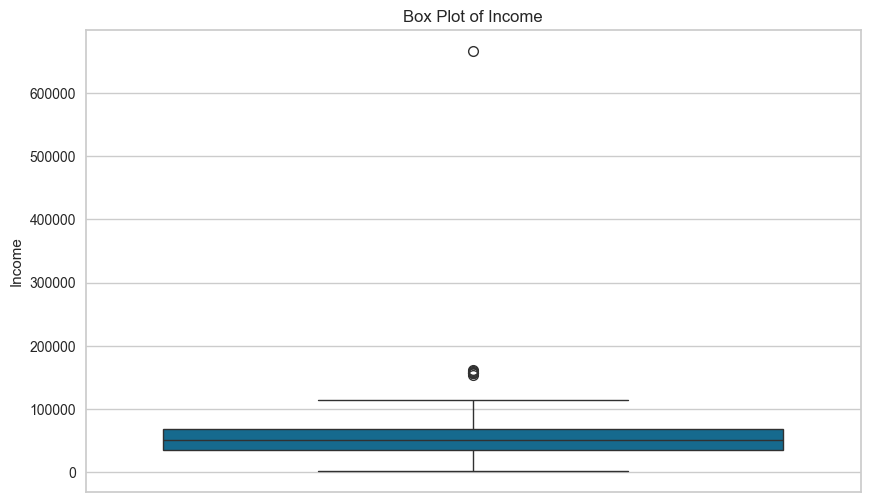

In [1410]:
# Create the box plot for the 'income' column
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='income')
plt.title('Box Plot of Income')
plt.ylabel('Income')
plt.show()

In [1411]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile) for 'income'
Q1 = df['income'].quantile(0.25)
Q3 = df['income'].quantile(0.75)
IQR = Q3 - Q1

In [1412]:
# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [1413]:
# Filter out outliers
df = df[(df['income'] >= lower_bound) & (df['income'] <= upper_bound)]

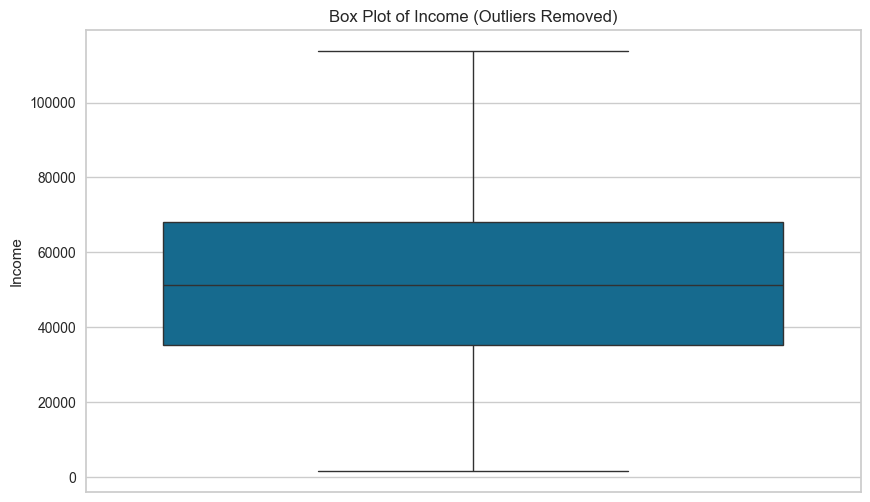

In [1414]:
# Create the box plot for the 'income' column without outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='income')
plt.title('Box Plot of Income (Outliers Removed)')
plt.ylabel('Income')
plt.show()

In [1415]:
df.shape

(2194, 28)

## kidhome

In [1416]:
first_looking(df, "kidhome")

column name    :  kidhome
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  3
shape_of_df    :  (2194, 28)
--------------------------------
kidhome
0    1270
1     876
2      48
Name: count, dtype: int64


## teenhome

In [1417]:
first_looking(df, "teenhome")

column name    :  teenhome
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  3
shape_of_df    :  (2194, 28)
--------------------------------
teenhome
0    1140
1    1002
2      52
Name: count, dtype: int64


In [1418]:
# Combining different dataframe into a single column to reduce the number of dimension

df['kids'] = df['kidhome'] + df['teenhome']

In [1419]:
#df = df.drop(columns=['kidhome','teenhome'])

## family_size

In [1420]:
df["family_size"] = df["marital_status"].replace({"Single": 1, "Married":2}) + df["kids"]

## recency

In [1421]:
first_looking(df, "recency")

column name    :  recency
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  100
shape_of_df    :  (2194, 30)
--------------------------------
recency
56    37
54    32
30    32
46    31
92    30
      ..
41    15
59    14
22    13
7     12
44    11
Name: count, Length: 100, dtype: int64


## total_spend

In [1422]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2194 entries, 0 to 2239
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   education              2194 non-null   object 
 1   marital_status         2194 non-null   object 
 2   income                 2194 non-null   float64
 3   kidhome                2194 non-null   int64  
 4   teenhome               2194 non-null   int64  
 5   recency                2194 non-null   int64  
 6   mnt_wines              2194 non-null   int64  
 7   mnt_fruits             2194 non-null   int64  
 8   mnt_meat_products      2194 non-null   int64  
 9   mnt_fish_products      2194 non-null   int64  
 10  mnt_sweet_products     2194 non-null   int64  
 11  mnt_gold_prods         2194 non-null   int64  
 12  num_deals_purchases    2194 non-null   int64  
 13  num_web_purchases      2194 non-null   int64  
 14  num_catalog_purchases  2194 non-null   int64  
 15  num_store

In [1423]:
#Total spendings on various items
df["total_spend"] = df["mnt_wines"]+ df["mnt_fruits"]+ df["mnt_meat_products"]+ df["mnt_fish_products"]+ df["mnt_sweet_products"]+ df["mnt_gold_prods"]

In [1424]:
df["total_spend"].value_counts()

total_spend
22      18
46      17
57      16
55      15
44      15
        ..
2486     1
1789     1
1101     1
108      1
843      1
Name: count, Length: 1047, dtype: int64

## Accepted_camps

In [1425]:
#Total spendings on various items
df["accepted_camps"] = df["accepted_cmp_1"]+ df["accepted_cmp_2"]+ df["accepted_cmp_3"]+ df["accepted_cmp_4"]+ df["accepted_cmp_5"]

In [1426]:
df["accepted_camps"].value_counts()

accepted_camps
0    1745
1     313
2      81
3      44
4      11
Name: count, dtype: int64

In [1427]:
df = df.drop(columns=['accepted_cmp_1',"accepted_cmp_2","accepted_cmp_3","accepted_cmp_4","accepted_cmp_5"])

## complain                  

In [1428]:
first_looking(df, "complain")

column name    :  complain
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2
shape_of_df    :  (2194, 27)
--------------------------------
complain
0    2173
1      21
Name: count, dtype: int64


In [1429]:
df = df.drop(columns=['complain'])

## z_cost_contact

In [1430]:
first_looking(df, "z_cost_contact")

column name    :  z_cost_contact
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  1
shape_of_df    :  (2194, 26)
--------------------------------
z_cost_contact
3    2194
Name: count, dtype: int64


In [1431]:
df = df.drop(columns=['z_cost_contact'])

## z_revenue

In [1432]:
first_looking(df, "z_revenue")

column name    :  z_revenue
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  1
shape_of_df    :  (2194, 25)
--------------------------------
z_revenue
11    2194
Name: count, dtype: int64


In [1433]:
df = df.drop(columns=['z_revenue'])

In [1434]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2194 entries, 0 to 2239
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   education              2194 non-null   object 
 1   marital_status         2194 non-null   object 
 2   income                 2194 non-null   float64
 3   kidhome                2194 non-null   int64  
 4   teenhome               2194 non-null   int64  
 5   recency                2194 non-null   int64  
 6   mnt_wines              2194 non-null   int64  
 7   mnt_fruits             2194 non-null   int64  
 8   mnt_meat_products      2194 non-null   int64  
 9   mnt_fish_products      2194 non-null   int64  
 10  mnt_sweet_products     2194 non-null   int64  
 11  mnt_gold_prods         2194 non-null   int64  
 12  num_deals_purchases    2194 non-null   int64  
 13  num_web_purchases      2194 non-null   int64  
 14  num_catalog_purchases  2194 non-null   int64  
 15  num_store

## total_purchases

In [1435]:
df['total_purchases'] = df['num_web_purchases'] + df['num_catalog_purchases'] + df['num_store_purchases'] + df['num_deals_purchases']
df['total_purchases'].unique()

array([25,  6, 21,  8, 19, 22, 10,  2,  4, 16, 15,  5, 26,  9, 13, 12, 43,
       17, 20, 14, 27, 11, 18, 28,  7, 24, 29, 23, 32, 30, 31, 33, 35, 39,
       34,  1,  0], dtype=int64)

## response

In [1436]:
first_looking(df, "response")

column name    :  response
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2
shape_of_df    :  (2194, 25)
--------------------------------
response
0    1879
1     315
Name: count, dtype: int64


In [1437]:
target = df[["response"]]

In [1438]:
target

,response
0,1
1,0
2,0
3,0
4,0
...,...
2235,0
2236,0
2237,0
2238,0


In [1439]:
df = df.drop(columns=['response'])

In [1440]:
df = df.reset_index(drop=True)

In [1441]:
df.head()

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,Post Graduate,Single,58138,0,0,58,635,88,546,172,...,10,4,7,57,663,0,1,1617,0,25
1,Post Graduate,Single,46344,1,1,38,11,1,6,2,...,1,2,5,60,113,2,3,27,0,6
2,Post Graduate,Married,71613,0,0,26,426,49,127,111,...,2,10,4,49,312,0,2,776,0,21
3,Post Graduate,Married,26646,1,0,26,11,4,20,10,...,0,4,6,30,139,1,3,53,0,8
4,Post Graduate,Married,58293,1,0,94,173,43,118,46,...,3,6,5,33,161,1,3,422,0,19


In [1442]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
income,2194,"51,619.51","20,652.16",1730,"35,422.25",51369,"68,146.50",113734
kidhome,2194,0.44,0.54,0,0,0,1,2
teenhome,2194,0.50,0.55,0,0,0,1,2
recency,2194,49.38,28.90,0,25,50,74,99
mnt_wines,2194,303.85,335.48,0,24,176.50,504,1493
mnt_fruits,2194,26.60,39.96,0,2,8,33,199
mnt_meat_products,2194,165.37,218.52,0,16,68,232.75,1725
mnt_fish_products,2194,37.89,54.78,0,3,12,50,259
mnt_sweet_products,2194,27.23,41.30,0,1,8,34,263
mnt_gold_prods,2194,43.96,52.02,0,9,24,56,362


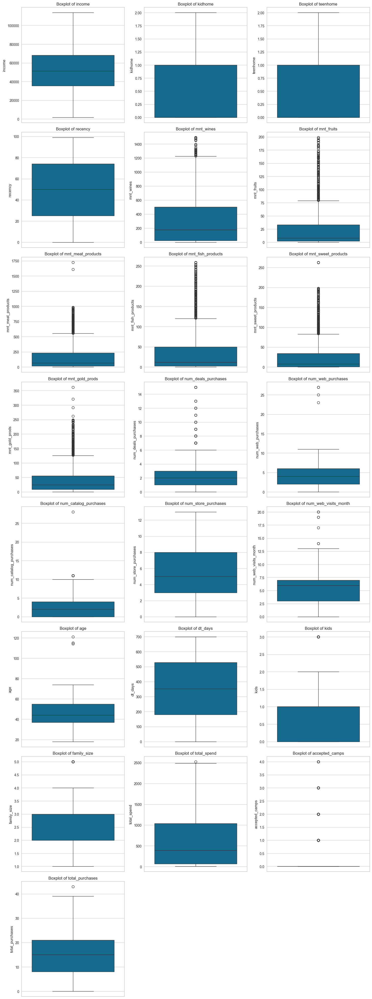

In [1443]:
# Plotting box plots for all numeric columns in a 3-column layout
numeric_columns = df.select_dtypes(include=['number'])

ncols = 3
num_plots = len(numeric_columns.columns)
nrows = (num_plots - 1) // ncols + 1

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 5 * nrows))

for i, column in enumerate(numeric_columns.columns):
    row = i // ncols
    col = i % ncols
    sns.boxplot(data=numeric_columns, y=column, ax=axes[row, col])
    axes[row, col].set_title(f'Boxplot of {column}')

for i in range(num_plots, nrows * ncols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

In [1444]:
#Dropping the outliers by setting a cap on Age and income. 
df = df[(df["age"]<90)]

print("The total number of data-points after removing the outliers are:", len(df))

The total number of data-points after removing the outliers are: 2191


In [1445]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2191 entries, 0 to 2193
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   education              2191 non-null   object 
 1   marital_status         2191 non-null   object 
 2   income                 2191 non-null   float64
 3   kidhome                2191 non-null   int64  
 4   teenhome               2191 non-null   int64  
 5   recency                2191 non-null   int64  
 6   mnt_wines              2191 non-null   int64  
 7   mnt_fruits             2191 non-null   int64  
 8   mnt_meat_products      2191 non-null   int64  
 9   mnt_fish_products      2191 non-null   int64  
 10  mnt_sweet_products     2191 non-null   int64  
 11  mnt_gold_prods         2191 non-null   int64  
 12  num_deals_purchases    2191 non-null   int64  
 13  num_web_purchases      2191 non-null   int64  
 14  num_catalog_purchases  2191 non-null   int64  
 15  num_store

In [1446]:
largest_incomes = df.nlargest(7, 'income')
largest_incomes

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
1858,Post Graduate,Single,113734,0,0,9,6,2,3,1,...,0,0,1,69,32,0,1,277,0,27
635,Post Graduate,Married,105471,0,0,36,1009,181,104,202,...,8,13,3,44,524,0,2,1724,2,30
247,Post Graduate,Single,102692,0,0,5,168,148,444,32,...,9,13,2,40,450,0,1,1112,4,29
198,Post Graduate,Married,102160,0,0,54,763,29,138,76,...,9,10,4,37,604,0,2,1240,3,26
122,Post Graduate,Single,101970,0,0,69,722,27,102,44,...,8,13,2,31,474,0,1,1135,3,27
639,Post Graduate,Single,98777,0,0,23,1000,19,711,125,...,6,9,1,54,132,0,1,2008,1,19
1092,Post Graduate,Single,98777,0,0,23,1000,19,711,125,...,6,9,1,54,132,0,1,2008,1,19


### PCA
- We have too many features for bivariate analysis and pairplot. So we will create 3 components to have insight how our data distrubuted. 

In [1447]:
#Factorial Analysis of Mixed Data (FAMD)

In [1448]:
#pip install factor-analyzer

In [1449]:
#pip install prince

In [1450]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from factor_analyzer import FactorAnalyzer
import prince

In [1451]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2191 entries, 0 to 2193
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   education              2191 non-null   object 
 1   marital_status         2191 non-null   object 
 2   income                 2191 non-null   float64
 3   kidhome                2191 non-null   int64  
 4   teenhome               2191 non-null   int64  
 5   recency                2191 non-null   int64  
 6   mnt_wines              2191 non-null   int64  
 7   mnt_fruits             2191 non-null   int64  
 8   mnt_meat_products      2191 non-null   int64  
 9   mnt_fish_products      2191 non-null   int64  
 10  mnt_sweet_products     2191 non-null   int64  
 11  mnt_gold_prods         2191 non-null   int64  
 12  num_deals_purchases    2191 non-null   int64  
 13  num_web_purchases      2191 non-null   int64  
 14  num_catalog_purchases  2191 non-null   int64  
 15  num_store

In [1452]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
income,2191,"51,607.88","20,651.75",1730,35402,51369,68145,113734
kidhome,2191,0.44,0.54,0,0,0,1,2
teenhome,2191,0.50,0.55,0,0,0,1,2
recency,2191,49.38,28.90,0,25,50,74,99
mnt_wines,2191,303.91,335.46,0,24,177,504,1493
mnt_fruits,2191,26.57,39.90,0,2,8,33,199
mnt_meat_products,2191,165.34,218.46,0,16,68,232.50,1725
mnt_fish_products,2191,37.88,54.79,0,3,12,50,259
mnt_sweet_products,2191,27.23,41.31,0,1,8,34,263
mnt_gold_prods,2191,43.91,51.90,0,9,24,56,362


In [1453]:
# Define categorical and numerical features
categorical_features = ['education', 'marital_status']
numerical_features = [col for col in df.columns if col not in categorical_features]

In [1454]:
df[categorical_features]

,education,marital_status
0,Post Graduate,Single
1,Post Graduate,Single
2,Post Graduate,Married
3,Post Graduate,Married
4,Post Graduate,Married
...,...,...
2189,Post Graduate,Married
2190,Post Graduate,Married
2191,Post Graduate,Single
2192,Post Graduate,Married


In [1455]:
numerical_features

['income',
 'kidhome',
 'teenhome',
 'recency',
 'mnt_wines',
 'mnt_fruits',
 'mnt_meat_products',
 'mnt_fish_products',
 'mnt_sweet_products',
 'mnt_gold_prods',
 'num_deals_purchases',
 'num_web_purchases',
 'num_catalog_purchases',
 'num_store_purchases',
 'num_web_visits_month',
 'age',
 'dt_days',
 'kids',
 'family_size',
 'total_spend',
 'accepted_camps',
 'total_purchases']

In [1456]:
numeric_df = df.select_dtypes(include="number")

In [1457]:
# Standard scale the numerical variables
scaler = StandardScaler()
scaled_numerical_data = scaler.fit_transform(numeric_df)

In [1458]:
# Convert scaled_numerical_data back to a DataFrame
scaled_numerical_df = pd.DataFrame(scaled_numerical_data, columns=numeric_df.columns)
scaled_numerical_df 

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,0.32,-0.82,-0.92,0.30,0.99,1.54,1.74,2.45,1.47,0.85,...,2.63,-0.56,0.70,1.01,1.54,-1.26,-1.76,1.69,-0.44,1.33
1,-0.25,1.03,0.91,-0.39,-0.87,-0.64,-0.73,-0.66,-0.64,-0.73,...,-0.58,-1.18,-0.13,1.27,-1.19,1.40,0.45,-0.96,-0.44,-1.16
2,0.97,-0.82,-0.92,-0.81,0.36,0.56,-0.18,1.33,-0.15,-0.04,...,-0.23,1.29,-0.55,0.33,-0.20,-1.26,-0.65,0.29,-0.44,0.81
3,-1.21,1.03,-0.92,-0.81,-0.87,-0.57,-0.67,-0.51,-0.59,-0.75,...,-0.94,-0.56,0.28,-1.29,-1.06,0.07,0.45,-0.92,-0.44,-0.90
4,0.32,1.03,-0.92,1.54,-0.39,0.41,-0.22,0.15,-0.01,-0.56,...,0.13,0.06,-0.13,-1.04,-0.95,0.07,0.45,-0.31,-0.44,0.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2186,0.47,-0.82,0.91,-0.12,1.21,0.41,0.08,0.08,2.20,3.91,...,0.13,-0.56,-0.13,0.16,0.14,0.07,0.45,1.23,-0.44,0.41
2187,0.60,2.89,0.91,0.23,0.30,-0.67,-0.62,-0.69,-0.66,-0.69,...,-0.23,-0.25,0.70,1.95,-1.65,2.73,2.65,-0.27,1.03,0.94
2188,0.26,-0.82,-0.92,1.44,1.80,0.54,0.24,-0.11,-0.37,-0.38,...,0.13,2.22,0.28,-1.04,-0.98,-1.26,-1.76,1.06,1.03,0.55
2189,0.85,-0.82,0.91,-1.43,0.37,0.09,0.22,0.77,0.07,0.33,...,0.85,1.29,-0.96,1.10,-0.97,0.07,0.45,0.40,-0.44,1.07


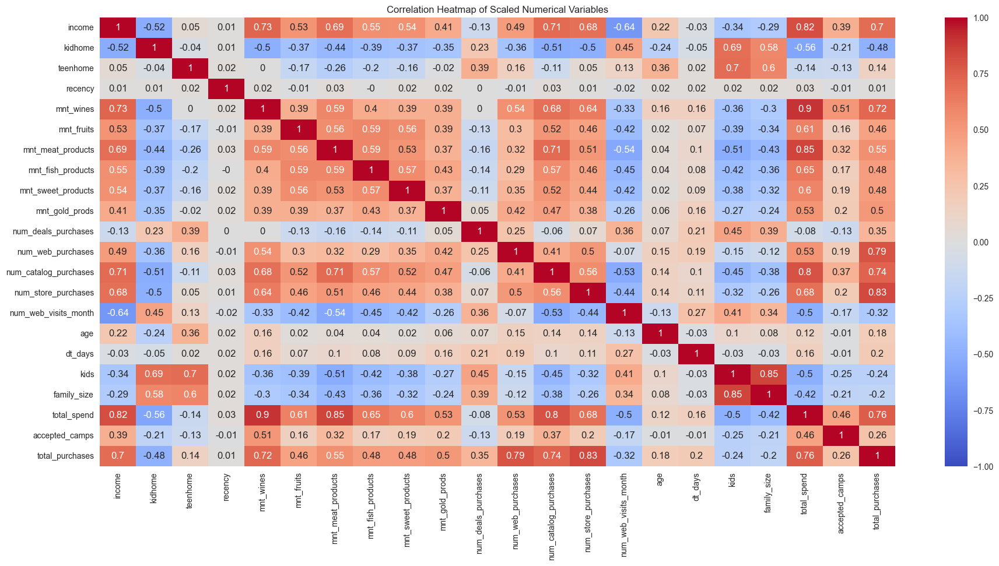

In [1459]:


# Plotting the heatmap
plt.figure(figsize=(22, 10))
sns.heatmap(scaled_numerical_df.corr().round(2), vmin=-1, vmax=1, annot=True, cmap="coolwarm")
plt.title('Correlation Heatmap of Scaled Numerical Variables')
plt.show()

# PCA algorithm will work much better if there are meaningful correlations between features.
# PCA also takes care of the multicollinearity issue.
# High corr with each other. or features with a meaningful corr relationship are more intensely
# combined in the same component.
# In all the new componets we will achieve in PCA, more or less, all the features will surely contribute.

In [1460]:
# Process categorical variables
#encoder = OneHotEncoder()
#one_hot_encoded_data = encoder.fit_transform(df[categorical_features]).toarray()

In [1461]:
# Get probabilities of each category
#category_probabilities = one_hot_encoded_data.mean(axis=0)

In [1462]:
# Scale one-hot encoded columns by dividing by the square root of their probability
#scaled_one_hot_encoded_data = one_hot_encoded_data / np.sqrt(category_probabilities)

In [1463]:

# Center the columns by subtracting the mean
#scaled_one_hot_encoded_data -= scaled_one_hot_encoded_data.mean(axis=0)

In [1464]:
# Combine the numerical and processed categorical data
#combined_data = np.hstack((scaled_numerical_data, scaled_one_hot_encoded_data))

In [1465]:
# Apply PCA to create 3 components
pca = PCA(n_components=3, random_state=42)
pca_result = pca.fit_transform(scaled_numerical_data)

In [1466]:
# Convert to DataFrame for easy viewing and visualization
pca_df = pd.DataFrame(data=pca_result, columns=['first_component', 'second_component', 'third_component'])

# Display the first few rows
pca_df.head()



,first_component,second_component,third_component
0,4.79,-0.15,2.07
1,-3.10,0.21,-2.13
2,2.31,-0.65,-0.02
3,-2.90,-1.44,0.25
4,-0.35,0.28,0.47


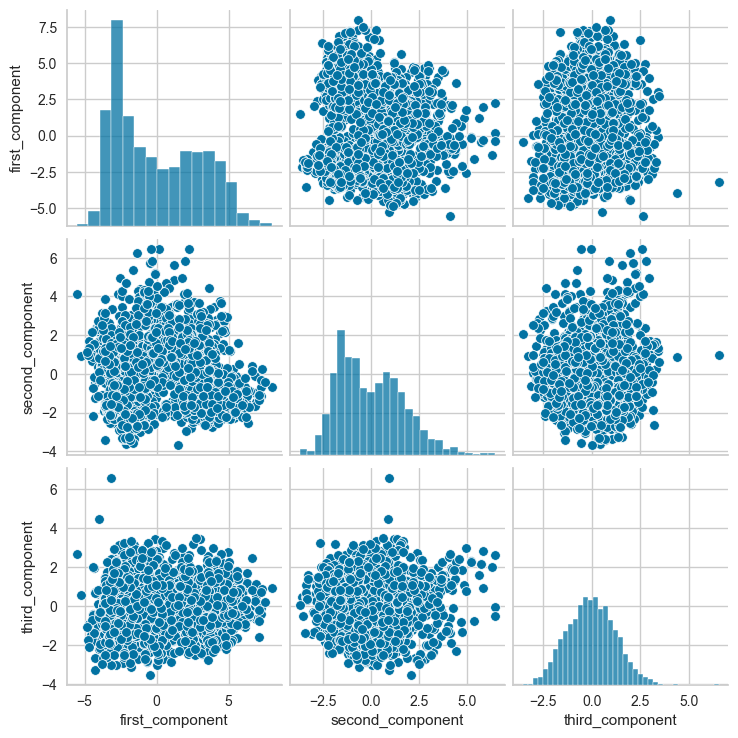

In [1467]:
# Pairplot to visualize the 3 components
sns.pairplot(pca_df)
plt.show()

In [1468]:
#Eigenvectors
pca.components_

array([[ 2.88344048e-01, -2.33158297e-01, -6.19034444e-02,
         4.49728773e-03,  2.69306043e-01,  2.30292565e-01,
         2.75455229e-01,  2.39531337e-01,  2.29428928e-01,
         1.94299261e-01, -4.81748437e-02,  1.92231022e-01,
         2.85492549e-01,  2.55094103e-01, -2.08259958e-01,
         4.68222860e-02,  3.91539176e-02, -2.12036559e-01,
        -1.85390748e-01,  3.20859250e-01,  1.42813918e-01,
         2.71690478e-01],
       [ 8.97215943e-02,  7.02148751e-02,  4.58328649e-01,
         1.92913805e-02,  1.38825824e-01, -4.74398736e-02,
        -6.81313532e-02, -5.80684509e-02, -2.97781387e-02,
         9.04518326e-02,  4.24567194e-01,  2.83684790e-01,
         4.00776485e-02,  1.60908634e-01,  1.47639081e-01,
         2.05875290e-01,  1.40214173e-01,  3.82743996e-01,
         3.62431506e-01,  5.01604800e-02, -2.52375639e-02,
         2.91377183e-01],
       [-2.29479727e-01,  1.18215031e-01, -3.12959273e-01,
        -2.29288002e-02,  3.07770535e-02,  2.29877405e-02,
    

In [1469]:
eigenvectors_first_component = pca.components_[0]
eigenvectors_first_component

array([ 0.28834405, -0.2331583 , -0.06190344,  0.00449729,  0.26930604,
        0.23029256,  0.27545523,  0.23953134,  0.22942893,  0.19429926,
       -0.04817484,  0.19223102,  0.28549255,  0.2550941 , -0.20825996,
        0.04682229,  0.03915392, -0.21203656, -0.18539075,  0.32085925,
        0.14281392,  0.27169048])

In [1470]:
eigenvectors_second_component = pca.components_[1]
eigenvectors_second_component

array([ 0.08972159,  0.07021488,  0.45832865,  0.01929138,  0.13882582,
       -0.04743987, -0.06813135, -0.05806845, -0.02977814,  0.09045183,
        0.42456719,  0.28368479,  0.04007765,  0.16090863,  0.14763908,
        0.20587529,  0.14021417,  0.382744  ,  0.36243151,  0.05016048,
       -0.02523756,  0.29137718])

In [1471]:
eigenvectors_third_component = pca.components_[2]
eigenvectors_third_component

array([-2.29479727e-01,  1.18215031e-01, -3.12959273e-01, -2.29288002e-02,
        3.07770535e-02,  2.29877405e-02, -1.79061191e-04,  2.00201215e-02,
        2.52161001e-02,  1.47065484e-01,  2.64508134e-01,  1.85608511e-01,
       -2.65260822e-02, -2.51770940e-02,  4.35151976e-01, -4.04838470e-01,
        5.42612302e-01, -1.42236069e-01, -1.52184361e-01,  3.49794453e-02,
        7.02065270e-03,  1.12508913e-01])

In [1472]:
scaled_numerical_df.loc[0]

income                   0.32
kidhome                 -0.82
teenhome                -0.92
recency                  0.30
mnt_wines                0.99
mnt_fruits               1.54
mnt_meat_products        1.74
mnt_fish_products        2.45
mnt_sweet_products       1.47
mnt_gold_prods           0.85
num_deals_purchases      0.37
num_web_purchases        1.40
num_catalog_purchases    2.63
num_store_purchases     -0.56
num_web_visits_month     0.70
age                      1.01
dt_days                  1.54
kids                    -1.26
family_size             -1.76
total_spend              1.69
accepted_camps          -0.44
total_purchases          1.33
Name: 0, dtype: float64

In [1473]:
(scaled_numerical_df.loc[0] * eigenvectors_first_component).sum()

4.788430505419098

In [1474]:
(scaled_numerical_df.loc[0] * eigenvectors_second_component).sum()

-0.14728999409261018

In [1475]:
(scaled_numerical_df.loc[0] * eigenvectors_third_component).sum()

2.073810332581045

In [1476]:
pca.explained_variance_ #Eigenvalues
# The explained_variance_ code shows us the eigenvalues that is
# how much information the relevant components carry on it.
# A component with a large value means it carries more information.

array([8.68852455, 2.90802977, 1.51329681])

<Axes: >

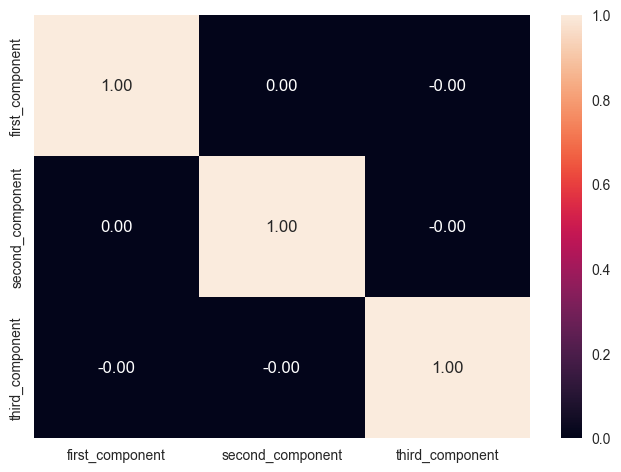

In [1477]:
sns.heatmap(pca_df.corr(), annot=True, fmt=".2f")

# Their correaltions also 0.

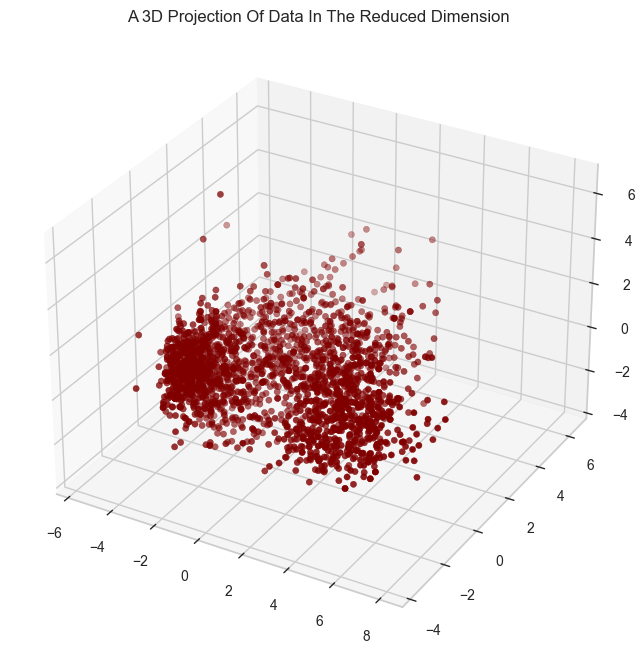

In [1478]:
#A 3D Projection Of Data In The Reduced Dimension
x =pca_df["first_component"]
y =pca_df["second_component"]
z =pca_df["third_component"]
#To plot
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

In [1479]:
pca.explained_variance_

array([8.68852455, 2.90802977, 1.51329681])

In [1480]:
pca.explained_variance_ratio_

array([0.39475268, 0.13212284, 0.06875482])

In [1481]:
pca.explained_variance_ratio_.cumsum()

array([0.39475268, 0.52687552, 0.59563035])

In [1482]:
scaled_numerical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2191 entries, 0 to 2190
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   income                 2191 non-null   float64
 1   kidhome                2191 non-null   float64
 2   teenhome               2191 non-null   float64
 3   recency                2191 non-null   float64
 4   mnt_wines              2191 non-null   float64
 5   mnt_fruits             2191 non-null   float64
 6   mnt_meat_products      2191 non-null   float64
 7   mnt_fish_products      2191 non-null   float64
 8   mnt_sweet_products     2191 non-null   float64
 9   mnt_gold_prods         2191 non-null   float64
 10  num_deals_purchases    2191 non-null   float64
 11  num_web_purchases      2191 non-null   float64
 12  num_catalog_purchases  2191 non-null   float64
 13  num_store_purchases    2191 non-null   float64
 14  num_web_visits_month   2191 non-null   float64
 15  age 

In [1483]:
pca = PCA(n_components=20).fit(scaled_numerical_data)

In [1484]:
my_dict = {"explained_variance": pca.explained_variance_,
           "explained_variance_ratio": pca.explained_variance_ratio_,
           "cumsum_explained_variance_ratio": pca.explained_variance_ratio_.cumsum()}

In [1485]:
df_ev = pd.DataFrame(my_dict, index=range(1,21))
df_ev

,explained_variance,explained_variance_ratio,cumsum_explained_variance_ratio
1,8.69,0.39,0.39
2,2.91,0.13,0.53
3,1.51,0.07,0.60
4,1.19,0.05,0.65
5,1.12,0.05,0.70
6,1.01,0.05,0.75
7,0.81,0.04,0.78
8,0.71,0.03,0.82
9,0.60,0.03,0.84
10,0.58,0.03,0.87


Text(0, 0.5, 'Variance Ratio')

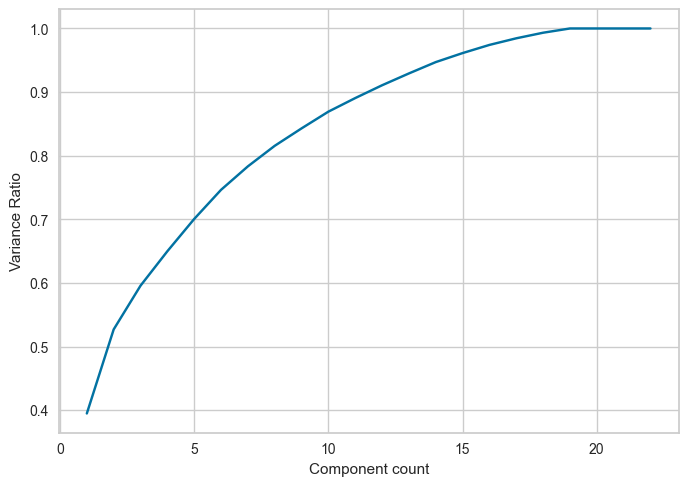

In [1486]:
x = range(1,23)
pca = PCA().fit(scaled_numerical_df)
plt.plot(x, pca.explained_variance_ratio_.cumsum())
# plt.plot rearranges PCA's n_components hyper_parameter to n_components=x
# for each x value and calculates how much information the components carry
# on them in total for all values x will take up to 1, 2, 3 .......30
# Returns cumulative totals with representation.
plt.xlabel("Component count")
plt.ylabel("Variance Ratio")

In [1487]:
df_ev.explained_variance.sum()

22.010045662100467

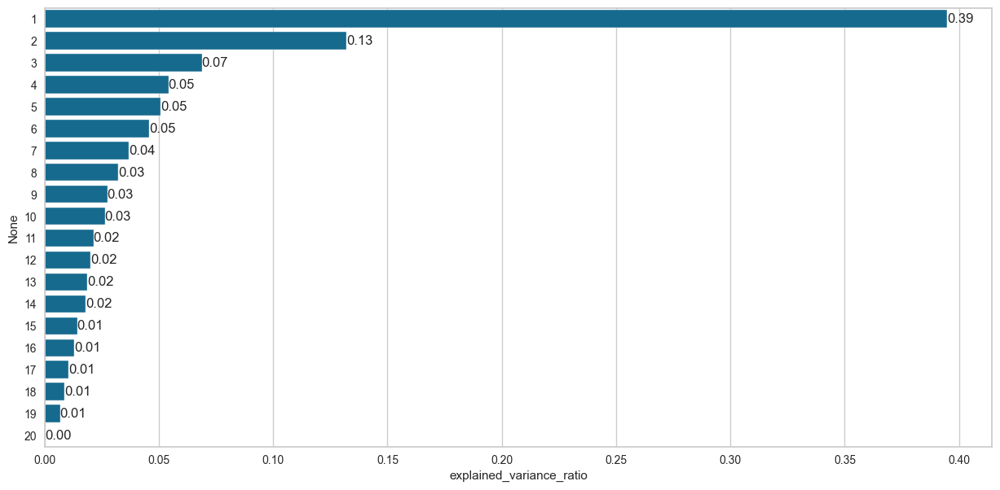

In [1488]:
plt.figure(figsize=(15, 7))

ax = sns.barplot(y=df_ev.index,
                 x=df_ev.explained_variance_ratio,
                orient='horizontal')
ax.bar_label(ax.containers[0], fmt="%.2f");

# 3. Cluster Analysis

The purpose of the project is to perform cluster analysis using [K-Means](https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1) and [Hierarchical Clustering](https://medium.com/analytics-vidhya/hierarchical-clustering-d2d92835280c) algorithms.

The K-Means algorithm requires determining the number of clusters using the [Elbow Method](https://en.wikipedia.org/wiki/Elbow_method_(clustering), while Hierarchical Clustering builds a dendrogram without defining the number of clusters beforehand. Different labeling should be done based on the information obtained from each analysis.
Labeling example:

- **Normal Customers**  -- An Average consumer in terms of purchases and Income
- **Spender Customers** --  Income is less but purcheses high, so can also be treated as potential target customer.

## K-means Clustering

### Create a new dataset with numeric features

In [1489]:
# function to compute hopkins's statistic for the dataframe X
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform


In [1490]:
df

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,Post Graduate,Single,58138,0,0,58,635,88,546,172,...,10,4,7,57,663,0,1,1617,0,25
1,Post Graduate,Single,46344,1,1,38,11,1,6,2,...,1,2,5,60,113,2,3,27,0,6
2,Post Graduate,Married,71613,0,0,26,426,49,127,111,...,2,10,4,49,312,0,2,776,0,21
3,Post Graduate,Married,26646,1,0,26,11,4,20,10,...,0,4,6,30,139,1,3,53,0,8
4,Post Graduate,Married,58293,1,0,94,173,43,118,46,...,3,6,5,33,161,1,3,422,0,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,Post Graduate,Married,61223,0,1,46,709,43,182,42,...,3,4,5,47,381,1,3,1341,0,18
2190,Post Graduate,Married,64014,2,1,56,406,0,30,0,...,2,5,7,68,19,3,5,444,1,22
2191,Post Graduate,Single,56981,0,0,91,908,48,217,32,...,3,13,6,33,155,0,1,1241,1,19
2192,Post Graduate,Married,69245,0,1,8,428,30,214,80,...,5,10,3,58,156,1,3,843,0,23


In [1491]:
numeric_df.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,58138,0,0,58,635,88,546,172,88,88,...,10,4,7,57,663,0,1,1617,0,25
1,46344,1,1,38,11,1,6,2,1,6,...,1,2,5,60,113,2,3,27,0,6
2,71613,0,0,26,426,49,127,111,21,42,...,2,10,4,49,312,0,2,776,0,21
3,26646,1,0,26,11,4,20,10,3,5,...,0,4,6,30,139,1,3,53,0,8
4,58293,1,0,94,173,43,118,46,27,15,...,3,6,5,33,161,1,3,422,0,19


In [1492]:
scaler = StandardScaler()

X = scaler.fit_transform(numeric_df)

scaled_X = pd.DataFrame(X, columns=numeric_df.columns)

In [1493]:
scaled_X

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,0.32,-0.82,-0.92,0.30,0.99,1.54,1.74,2.45,1.47,0.85,...,2.63,-0.56,0.70,1.01,1.54,-1.26,-1.76,1.69,-0.44,1.33
1,-0.25,1.03,0.91,-0.39,-0.87,-0.64,-0.73,-0.66,-0.64,-0.73,...,-0.58,-1.18,-0.13,1.27,-1.19,1.40,0.45,-0.96,-0.44,-1.16
2,0.97,-0.82,-0.92,-0.81,0.36,0.56,-0.18,1.33,-0.15,-0.04,...,-0.23,1.29,-0.55,0.33,-0.20,-1.26,-0.65,0.29,-0.44,0.81
3,-1.21,1.03,-0.92,-0.81,-0.87,-0.57,-0.67,-0.51,-0.59,-0.75,...,-0.94,-0.56,0.28,-1.29,-1.06,0.07,0.45,-0.92,-0.44,-0.90
4,0.32,1.03,-0.92,1.54,-0.39,0.41,-0.22,0.15,-0.01,-0.56,...,0.13,0.06,-0.13,-1.04,-0.95,0.07,0.45,-0.31,-0.44,0.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2186,0.47,-0.82,0.91,-0.12,1.21,0.41,0.08,0.08,2.20,3.91,...,0.13,-0.56,-0.13,0.16,0.14,0.07,0.45,1.23,-0.44,0.41
2187,0.60,2.89,0.91,0.23,0.30,-0.67,-0.62,-0.69,-0.66,-0.69,...,-0.23,-0.25,0.70,1.95,-1.65,2.73,2.65,-0.27,1.03,0.94
2188,0.26,-0.82,-0.92,1.44,1.80,0.54,0.24,-0.11,-0.37,-0.38,...,0.13,2.22,0.28,-1.04,-0.98,-1.26,-1.76,1.06,1.03,0.55
2189,0.85,-0.82,0.91,-1.43,0.37,0.09,0.22,0.77,0.07,0.33,...,0.85,1.29,-0.96,1.10,-0.97,0.07,0.45,0.40,-0.44,1.07


In [1494]:
scaled_X.shape

(2191, 22)

In [1495]:
def elbow_vis(X, k_range=range(2, 11), inertia=True):
    """
    This is a function that visualizes the elbow method for determining the optimal number of clusters in a dataset.

    Args:
        X (pd.Dataframe): Input data
        k_range (range, optional): generator for k values. Defaults to range(2, 11).
        inertia (bool, optional): to select either inertia or distorion. Defaults to True.
    Returns:
        None.
    """
    if inertia:
        inertias = []
        for k in k_range:
            kmeanModel = KMeans(n_clusters=k, random_state=42).fit(X)
            inertias.append(kmeanModel.inertia_)
        plt.figure(figsize=(10, 6))
        plt.plot(k_range, inertias, "bo--")
        plt.xlabel("k")
        plt.ylabel("Inertia")
        plt.title("The Elbow Method showing the optimal k")
        plt.show()
    else:
        distortion = []
        for k in k_range:
            kmeanModel = KMeans(n_clusters=k, random_state=42)
            kmeanModel.fit(X)
            distances = kmeanModel.transform(
                X
            )  # distances from each observation to each cluster centroid
            labels = kmeanModel.labels_
            result = []
            for i in range(k):
                cluster_distances = distances[
                    labels == i, i
                ]  # distances from observations in each cluster to their own centroid
                result.append(
                    np.mean(cluster_distances**2)
                )  # calculate the mean of squared distances from observations in each cluster to their own centroid and add it to the result list
            distortion.append(
                sum(result)
            )  # sum the means of all clusters and add it to the distortion list

        plt.figure(figsize=(10, 6))
        plt.plot(k_range, distortion, "r*--", markersize=14.0)
        plt.xlabel("Different k values")
        plt.ylabel("Distortion")
        plt.title("elbow method")

In [1496]:
def hopkins(X, ratio=0.05):

    if not isinstance(X, np.ndarray):
      X=X.values  #convert dataframe to a numpy array
    sample_size = int(X.shape[0] * ratio) #0.05 (5%) based on paper by Lawson and Jures

    #a uniform random sample in the original data space
    X_uniform_random_sample = uniform(X.min(axis=0), X.max(axis=0) ,(sample_size , X.shape[1]))

    #a random sample of size sample_size from the original data X
    random_indices=sample(range(0, X.shape[0], 1), sample_size)
    X_sample = X[random_indices]

    #initialise unsupervised learner for implementing neighbor searches
    neigh = NearestNeighbors(n_neighbors=2)
    nbrs=neigh.fit(X)

    #u_distances = nearest neighbour distances from uniform random sample
    u_distances , u_indices = nbrs.kneighbors(X_uniform_random_sample , n_neighbors=2)
    u_distances = u_distances[: , 0] #distance to the first (nearest) neighbour

    #w_distances = nearest neighbour distances from a sample of points from original data X
    w_distances , w_indices = nbrs.kneighbors(X_sample , n_neighbors=2)
    #distance to the second nearest neighbour (as the first neighbour will be the point itself, with distance = 0)
    w_distances = w_distances[: , 1]

    u_sum = np.sum(u_distances)
    w_sum = np.sum(w_distances)

    #compute and return hopkins' statistic
    H = u_sum/ (u_sum + w_sum)
    return H

In [1497]:
hopkins(scaled_X)

0.8412830064426309

In [1498]:
hopkins(scaled_X,1)

0.8436743897428021

#### Determine optimal number of clusters

### inertia

In [1499]:
from sklearn.cluster import KMeans

ssd = []

K = range(2,10)

for k in K:
    model = KMeans(n_clusters=k,
                   random_state=42)
    model.fit(scaled_X)
    ssd.append(model.inertia_)

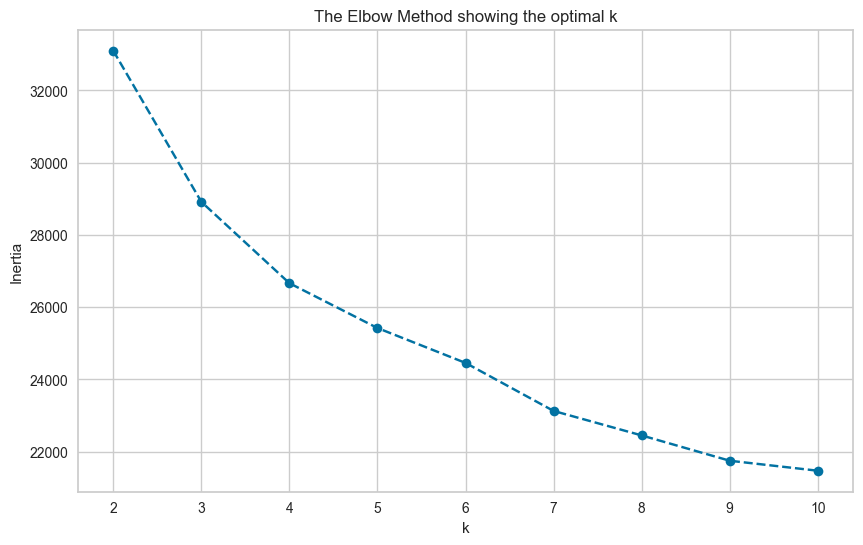

In [1500]:
elbow_vis(scaled_X)

In [1501]:
ssd # sum of squared distance

[33096.89293335867,
 28915.58096413228,
 26664.227227309053,
 25423.840608897004,
 24458.159272274206,
 23129.214917151698,
 22452.004039392992,
 21751.091840565325]

In [1502]:
-pd.Series(ssd).diff()

# we see that the first point where the sharp decline stopped is 4.

0        NaN
1   4,181.31
2   2,251.35
3   1,240.39
4     965.68
5   1,328.94
6     677.21
7     700.91
dtype: float64

In [1503]:
df_diff =pd.DataFrame(-pd.Series(ssd).diff()).rename(index = lambda x : x+1)
df_diff

,0
1,NaN
2,"4,181.31"
3,"2,251.35"
4,"1,240.39"
5,965.68
6,"1,328.94"
7,677.21
8,700.91


### distortion

In [1504]:
K = range(2, 10)
distortion = []
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=42)
    kmeanModel.fit(scaled_X)
    distances = kmeanModel.transform(scaled_X) # distances from each observation to each cluster centroid
    labels = kmeanModel.labels_
    result = []
    for i in range(k):
        cluster_distances = distances[labels == i, i] # distances from observations in each cluster to their own centroid
        result.append(np.mean(cluster_distances ** 2)) # calculate the mean of squared distances from observations in each cluster to their own centroid and add it to the result list
    distortion.append(sum(result)) # sum the means of all clusters and add it to the distortion list

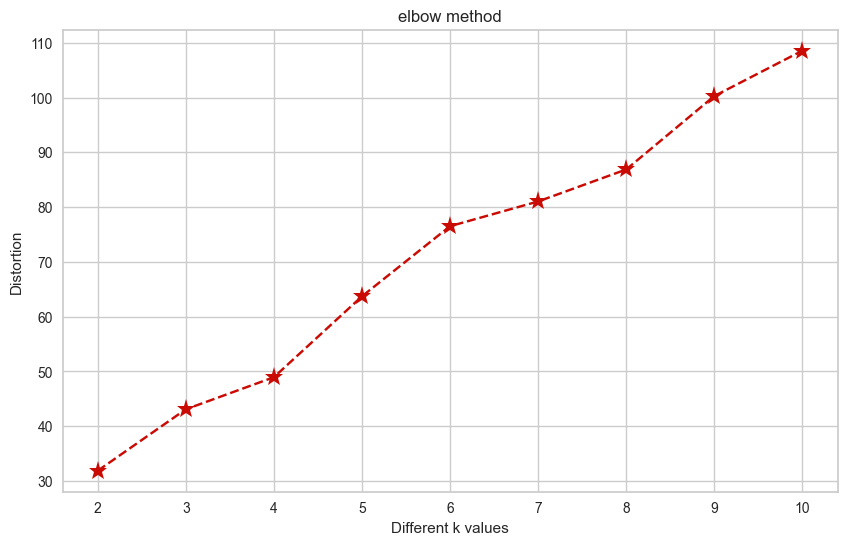

In [1505]:
elbow_vis(scaled_X, inertia=False)

### silhoutte score

In [1506]:
range_n_clusters = range(2,10)
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,
                    random_state=42)
    kmeans.fit(scaled_X)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(scaled_X, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.2996270376082096
For n_clusters=3, the silhouette score is 0.23332548132569578
For n_clusters=4, the silhouette score is 0.16899020598114167
For n_clusters=5, the silhouette score is 0.16048600979360747
For n_clusters=6, the silhouette score is 0.15581400018422475
For n_clusters=7, the silhouette score is 0.16117685980116886
For n_clusters=8, the silhouette score is 0.16094480730178706
For n_clusters=9, the silhouette score is 0.1598131152584321


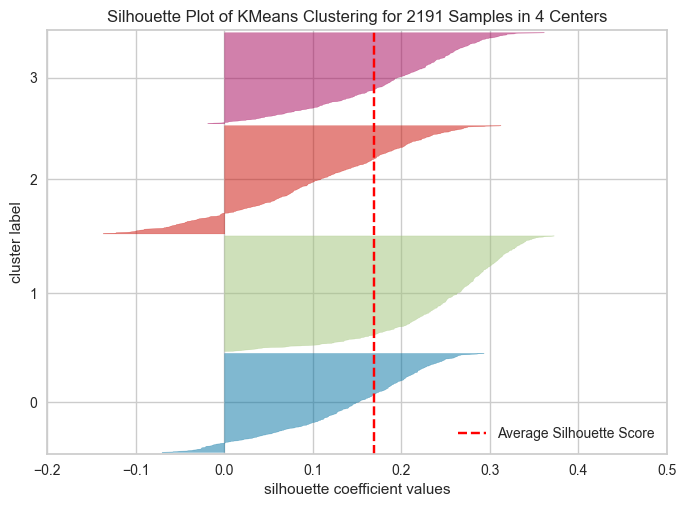

In [1507]:
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

# Assuming pca_df contains your PCA components and you have decided to use 3 clusters
model = KMeans(n_clusters=4, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

# Fit the data to the visualizer
visualizer.fit(scaled_X)

# Display the visualization
visualizer.poof();

# With this feature of yellowbrick, we can see the silhouette scores of each cluster separately.

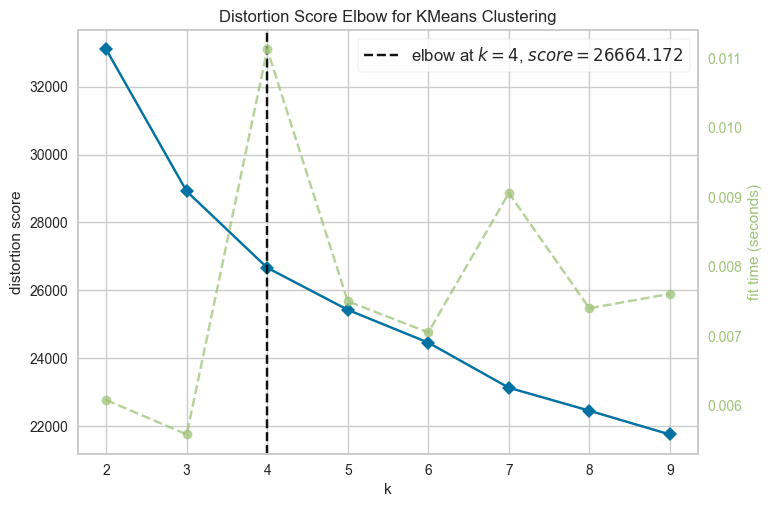

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [1508]:
from yellowbrick.cluster import KElbowVisualizer

kmeans = KMeans(random_state=42)
visu = KElbowVisualizer(kmeans, k = (2,10))
visu.fit(scaled_X)
visu.poof()

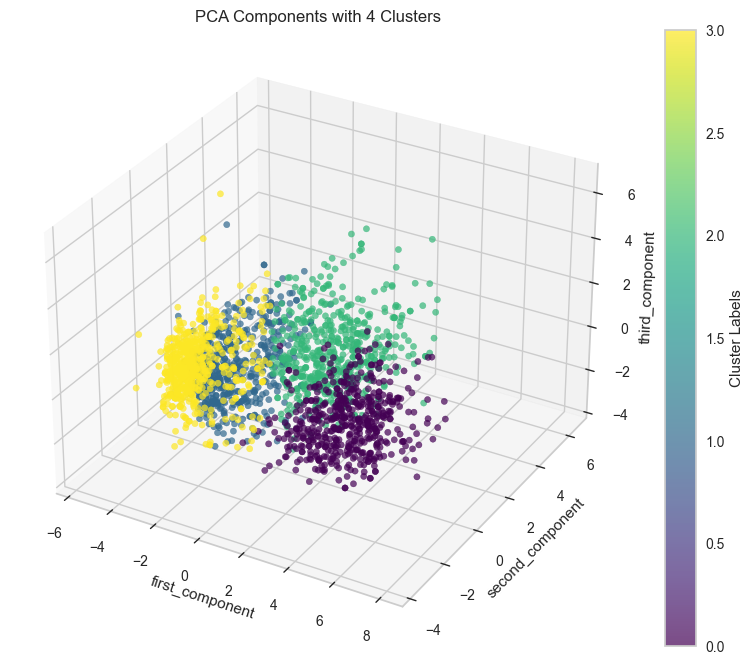

In [1509]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D  # Importing 3D plotting tools

# Fit KMeans clustering with 2 clusters
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(pca_df)

# Get cluster labels
kmeans_labels = kmeans.labels_

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with PCA components colored by cluster labels
scatter = ax.scatter(xs=pca_df['first_component'],
                     ys=pca_df['second_component'],
                     zs=pca_df['third_component'],
                     c=kmeans_labels,  # Cluster labels for coloring
                     cmap='viridis',  # Color map
                     alpha=0.7)

# Customize labels and title
ax.set_xlabel('first_component')
ax.set_ylabel('second_component')
ax.set_zlabel('third_component')
plt.title('PCA Components with 4 Clusters')

# Adding a color bar
plt.colorbar(scatter, label='Cluster Labels')

plt.show()

In [1510]:
model = KMeans(n_clusters=4, random_state=42)
clusters = model.fit_predict(scaled_X)
clusters

array([0, 3, 0, ..., 0, 2, 3])

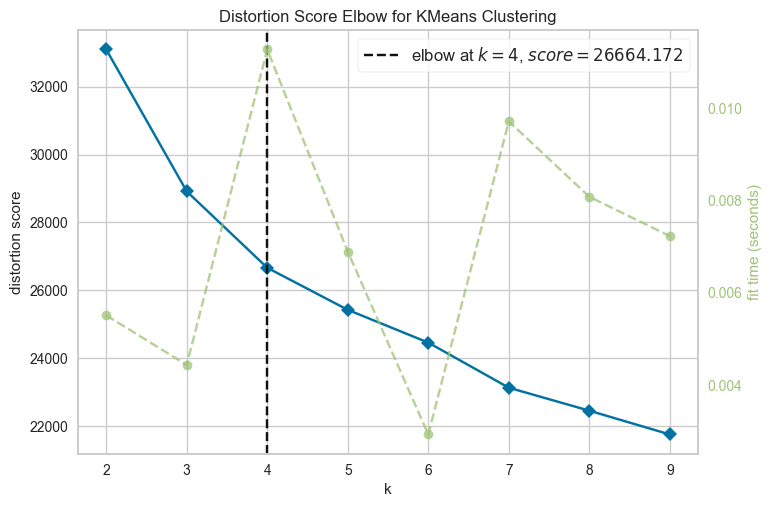

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [1511]:
from yellowbrick.cluster import KElbowVisualizer

kmeans = KMeans(random_state=42)
visu = KElbowVisualizer(kmeans, k = (2,10))
visu.fit(scaled_X)
visu.poof()

#### Apply K Means

In [1512]:
visualizer.silhouette_samples_
# We can see the individual silhouette scores of the observations.

array([ 0.13964925,  0.26971351, -0.05071629, ...,  0.03950012,
        0.21199826,  0.28761629])

In [1513]:
labels_1 = (model.labels_ == 1)

In [1514]:
visualizer.silhouette_samples_[labels_1] # silhoutte scores of 1 classes

array([0.28827162, 0.30398337, 0.28045221, 0.33458787, 0.3446287 ,
       0.12357382, 0.30339108, 0.28094193, 0.29984309, 0.23969122,
       0.30914518, 0.19131087, 0.26313009, 0.01875971, 0.29874423,
       0.16209091, 0.2402343 , 0.31020229, 0.195633  , 0.3394943 ,
       0.2705773 , 0.3548396 , 0.26935401, 0.21056453, 0.14741299,
       0.31047328, 0.27656743, 0.26262837, 0.23424511, 0.23792675,
       0.19131087, 0.27128318, 0.14988819, 0.26940436, 0.16250893,
       0.24322035, 0.31005333, 0.24955213, 0.2108961 , 0.07143212,
       0.32837816, 0.30725486, 0.1915814 , 0.28290195, 0.31092392,
       0.19166899, 0.25046836, 0.22336653, 0.18734219, 0.31299722,
       0.24907278, 0.28091317, 0.22449024, 0.31165204, 0.02251784,
       0.24572399, 0.27408562, 0.29722345, 0.25257828, 0.18174097,
       0.23046533, 0.21846024, 0.28984905, 0.26003648, 0.19021593,
       0.28444387, 0.32169887, 0.27102067, 0.3144727 , 0.3507826 ,
       0.36334821, 0.20506938, 0.30377363, 0.30068149, 0.06836

In [1515]:
mean_silhoutte_score_1 = visualizer.silhouette_samples_[labels_1].mean()
mean_silhoutte_score_1

0.24621460305570805

In [1516]:
K_means_model = KMeans(n_clusters = 4, random_state=42)
K_means_model.fit_predict(scaled_X)

array([0, 3, 0, ..., 0, 2, 3])

In [1517]:
## Let's do same thing above for all classes:
for i in range(4):
    label = (model.labels_== i)
    print(f"mean silhouette score for label {i:<4} : {visualizer.silhouette_samples_[label].mean()}")
print(f"mean silhouette score for all labels : {visualizer.silhouette_score_}")

mean silhouette score for label 0    : 0.13671655246705325
mean silhouette score for label 1    : 0.24621460305570805
mean silhouette score for label 2    : 0.10211297919591293
mean silhouette score for label 3    : 0.18552695780621173
mean silhouette score for all labels : 0.16899020598114167


#### Visualizing and Labeling All the Clusters

In [1518]:
K_means_model = KMeans(n_clusters = 4, random_state=42)
K_means_model.fit_predict(scaled_X)

array([0, 3, 0, ..., 0, 2, 3])

In [1519]:
K_means_model.labels_

array([0, 3, 0, ..., 0, 2, 3])

In [1520]:
clusters = K_means_model.labels_

In [1521]:
numeric_df = df[numerical_features]
numeric_df.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,58138,0,0,58,635,88,546,172,88,88,...,10,4,7,57,663,0,1,1617,0,25
1,46344,1,1,38,11,1,6,2,1,6,...,1,2,5,60,113,2,3,27,0,6
2,71613,0,0,26,426,49,127,111,21,42,...,2,10,4,49,312,0,2,776,0,21
3,26646,1,0,26,11,4,20,10,3,5,...,0,4,6,30,139,1,3,53,0,8
4,58293,1,0,94,173,43,118,46,27,15,...,3,6,5,33,161,1,3,422,0,19


In [1522]:
df["predicted_clusters"] = clusters

In [1523]:
numeric_df["predicted_clusters"] = clusters

In [1524]:
df["response"] = target

In [1525]:
numeric_df.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases,predicted_clusters
0,58138,0,0,58,635,88,546,172,88,88,...,4,7,57,663,0,1,1617,0,25,0
1,46344,1,1,38,11,1,6,2,1,6,...,2,5,60,113,2,3,27,0,6,3
2,71613,0,0,26,426,49,127,111,21,42,...,10,4,49,312,0,2,776,0,21,0
3,26646,1,0,26,11,4,20,10,3,5,...,4,6,30,139,1,3,53,0,8,1
4,58293,1,0,94,173,43,118,46,27,15,...,6,5,33,161,1,3,422,0,19,2


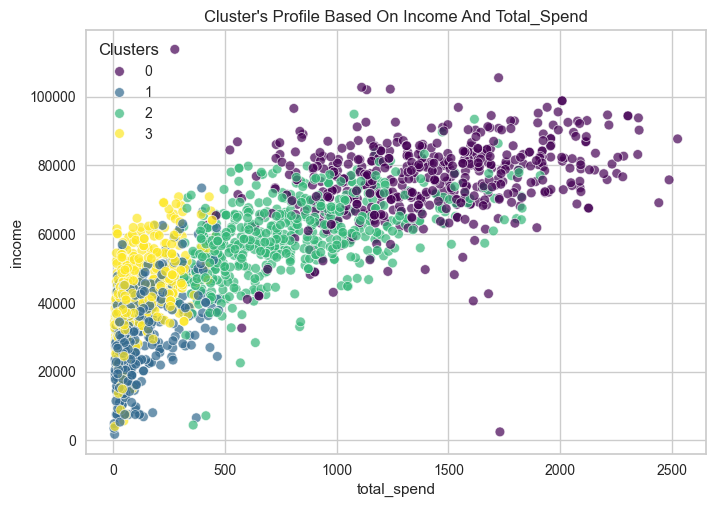

In [1526]:
pal = sns.color_palette("viridis", as_cmap=True)
pl = sns.scatterplot(data=df, x="total_spend", y="income", hue="predicted_clusters", alpha = 0.7, palette=pal)
pl.set_title("Cluster's Profile Based On Income And Total_Spend")
plt.legend(title='Clusters')
plt.show()

## Income vs spending plot shows the clusters pattern



In [1527]:
clusters = range(4)  # 0, 1, 2, 3, 4

cluster_means = []

# Her küme için ortalama 'income' ve 'expences' değerlerini hesapla
for cluster in clusters:
    cluster_data = df[df['predicted_clusters'] == cluster][['income', 'total_spend']].mean()
    cluster_means.append({
        'cluster': cluster,
        'income_mean': cluster_data['income'],
        'expences_mean': cluster_data['total_spend']
    })

cluster_means_df = pd.DataFrame(cluster_means)

cluster_means_df

,cluster,income_mean,expences_mean
0,0,"75,931.27","1,401.14"
1,1,"30,408.50",105.77
2,2,"59,753.72",812.46
3,3,"42,398.32",126.01


In [1528]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2191 entries, 0 to 2193
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   education              2191 non-null   object 
 1   marital_status         2191 non-null   object 
 2   income                 2191 non-null   float64
 3   kidhome                2191 non-null   int64  
 4   teenhome               2191 non-null   int64  
 5   recency                2191 non-null   int64  
 6   mnt_wines              2191 non-null   int64  
 7   mnt_fruits             2191 non-null   int64  
 8   mnt_meat_products      2191 non-null   int64  
 9   mnt_fish_products      2191 non-null   int64  
 10  mnt_sweet_products     2191 non-null   int64  
 11  mnt_gold_prods         2191 non-null   int64  
 12  num_deals_purchases    2191 non-null   int64  
 13  num_web_purchases      2191 non-null   int64  
 14  num_catalog_purchases  2191 non-null   int64  
 15  num_store

In [1529]:
df[df['predicted_clusters'] == 0].groupby(['family_size',  'accepted_camps'])['total_spend'].mean()

family_size  accepted_camps
1            0                1,276.25
             1                    1534
             2                1,462.39
             3                1,677.58
             4                1,471.40
2            0                1,264.61
             1                1,487.97
             2                1,695.52
             3                1,771.71
             4                1,311.75
3            0                1,245.25
             1                1,655.40
             2                1,584.75
             3                1,588.80
             4                    1957
Name: total_spend, dtype: float64

In [1530]:
df[df['predicted_clusters'] == 0].groupby(['family_size',  'accepted_camps'])['income'].mean()

family_size  accepted_camps
1            0                73,835.26
             1                75,492.47
             2                79,597.33
             3                82,888.58
             4                91,132.20
2            0                73,206.22
             1                77,859.83
             2                81,425.79
             3                84,693.92
             4                78,318.75
3            0                69,883.71
             1                80,309.20
             2                74,316.75
             3                80,690.60
             4                    87771
Name: income, dtype: float64

### Clustering based on selected features

#### Select features from existing data

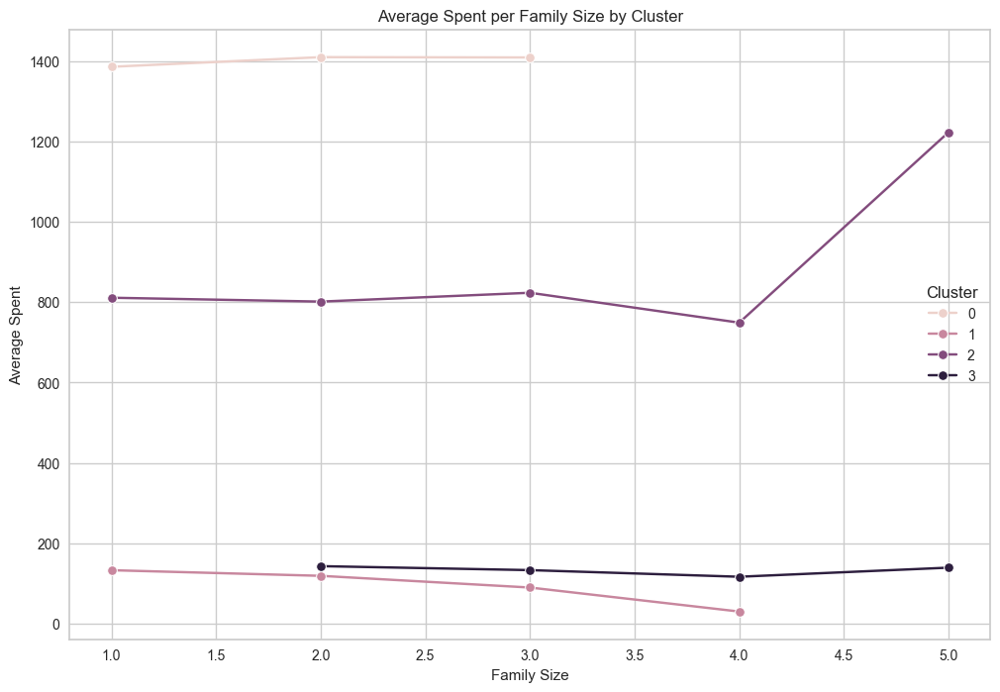

In [1531]:
# Kümeleri belirle
clusters = df['predicted_clusters'].unique()

# Sonuçları saklamak için boş bir liste oluştur
cluster_family_spent = []

# Her küme için 'family_size' sütununa göre gruplama yaparak ortalama 'spent' değerlerini hesapla
for cluster in clusters:
    cluster_data = df[df['predicted_clusters'] == cluster]
    grouped_data = cluster_data.groupby('family_size')['total_spend'].mean().reset_index()
    grouped_data['predicted_clusters'] = cluster
    cluster_family_spent.append(grouped_data)

# Listeyi DataFrame'e dönüştür
cluster_family_spent_df = pd.concat(cluster_family_spent, ignore_index=True)

# Grafiği çiz
plt.figure(figsize=(12, 8))
sns.lineplot(data=cluster_family_spent_df, x='family_size', y='total_spend', hue='predicted_clusters', marker='o')

plt.title('Average Spent per Family Size by Cluster')
plt.xlabel('Family Size')
plt.ylabel('Average Spent')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [1532]:
df1 = df.copy()

In [1533]:
df1[['camp1', 'camp2', 'camp3', 'camp4', 'camp5']] = df0[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']]

In [1534]:
df1[['kidhome', 'teenhome']] = df0[['Kidhome','Teenhome']]

In [1535]:
cluster_means = df1.groupby('predicted_clusters')['income'].mean()
cluster_means

predicted_clusters
0   75,931.27
1   30,408.50
2   59,753.72
3   42,398.32
Name: income, dtype: float64

In [1536]:
def classify_income(row):
    return cluster_means[row['predicted_clusters']]

In [1537]:
df1['income_class'] = df1.apply(classify_income, axis=1)


In [1538]:
df1

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,accepted_camps,total_purchases,predicted_clusters,response,camp1,camp2,camp3,camp4,camp5,income_class
0,Post Graduate,Single,58138,0,0,58,635,88,546,172,...,0,25,0,1,0,0,0,0,0,"75,931.27"
1,Post Graduate,Single,46344,1,1,38,11,1,6,2,...,0,6,3,0,0,0,0,0,0,"42,398.32"
2,Post Graduate,Married,71613,0,0,26,426,49,127,111,...,0,21,0,0,0,0,0,0,0,"75,931.27"
3,Post Graduate,Married,26646,1,0,26,11,4,20,10,...,0,8,1,0,0,0,0,0,0,"30,408.50"
4,Post Graduate,Married,58293,1,0,94,173,43,118,46,...,0,19,2,0,0,0,0,0,0,"59,753.72"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,Post Graduate,Married,61223,1,0,46,709,43,182,42,...,0,18,2,0,0,0,0,0,0,"59,753.72"
2190,Post Graduate,Married,64014,0,0,56,406,0,30,0,...,1,22,3,1,0,0,0,0,0,"42,398.32"
2191,Post Graduate,Single,56981,1,1,91,908,48,217,32,...,1,19,0,0,0,0,0,0,0,"75,931.27"
2192,Post Graduate,Married,69245,0,0,8,428,30,214,80,...,0,23,2,0,0,0,0,0,0,"59,753.72"


In [1539]:
df1['income_class'] = pd.cut(df1['income_class'], bins=4, labels=['high_income', 'medium_high_income', 'medium_low_income', 'low_income'])

In [1540]:
df1.head()

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,accepted_camps,total_purchases,predicted_clusters,response,camp1,camp2,camp3,camp4,camp5,income_class
0,Post Graduate,Single,58138,0,0,58,635,88,546,172,...,0,25,0,1,0,0,0,0,0,low_income
1,Post Graduate,Single,46344,1,1,38,11,1,6,2,...,0,6,3,0,0,0,0,0,0,medium_high_income
2,Post Graduate,Married,71613,0,0,26,426,49,127,111,...,0,21,0,0,0,0,0,0,0,low_income
3,Post Graduate,Married,26646,1,0,26,11,4,20,10,...,0,8,1,0,0,0,0,0,0,high_income
4,Post Graduate,Married,58293,1,0,94,173,43,118,46,...,0,19,2,0,0,0,0,0,0,medium_low_income


In [1541]:
df1[df1['predicted_clusters'] == 0].groupby(['family_size',  'accepted_camps'])['total_spend'].mean()

family_size  accepted_camps
1            0                1,276.25
             1                    1534
             2                1,462.39
             3                1,677.58
             4                1,471.40
2            0                1,264.61
             1                1,487.97
             2                1,695.52
             3                1,771.71
             4                1,311.75
3            0                1,245.25
             1                1,655.40
             2                1,584.75
             3                1,588.80
             4                    1957
Name: total_spend, dtype: float64

In [1542]:
df1[df1['predicted_clusters'] == 0].groupby(['family_size',  'accepted_camps'])['income'].mean()

family_size  accepted_camps
1            0                73,835.26
             1                75,492.47
             2                79,597.33
             3                82,888.58
             4                91,132.20
2            0                73,206.22
             1                77,859.83
             2                81,425.79
             3                84,693.92
             4                78,318.75
3            0                69,883.71
             1                80,309.20
             2                74,316.75
             3                80,690.60
             4                    87771
Name: income, dtype: float64

In [1543]:
df1[df1['predicted_clusters'] == 0].groupby(['education',  'marital_status', 'kids'])['total_spend'].mean()

education      marital_status  kids
Post Graduate  Married         0      1,417.96
                               1      1,401.67
               Single          0      1,385.79
                               1      1,311.96
                               2          1695
Name: total_spend, dtype: float64

In [1544]:
df[df['predicted_clusters'] == 1].groupby(['education',  'marital_status', 'kids'])['income'].mean()

education       marital_status  kids
Post Graduate   Married         0      32,307.20
                                1      30,803.98
                                2          19510
                Single          0      28,972.06
                                1      32,419.97
                                2      34,163.25
Under Graduate  Married         0      21,459.92
                                1      21,485.74
                Single          0          17870
                                1      18,352.47
Name: income, dtype: float64

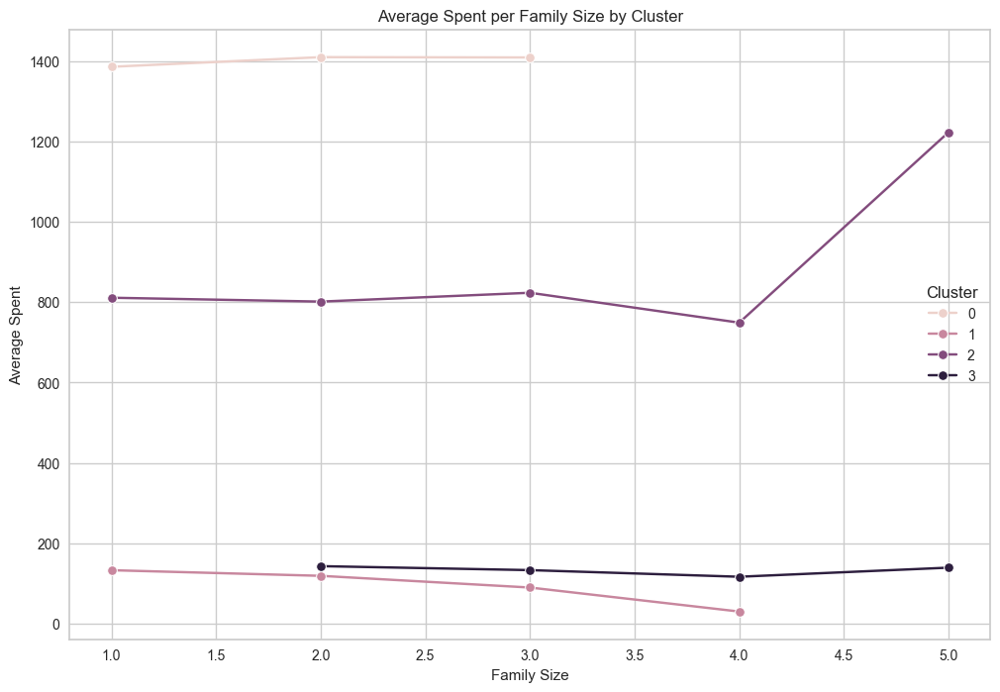

In [1545]:
# Kümeleri belirle
clusters = df['predicted_clusters'].unique()

# Sonuçları saklamak için boş bir liste oluştur
cluster_family_spent = []

# Her küme için 'family_size' sütununa göre gruplama yaparak ortalama 'spent' değerlerini hesapla
for cluster in clusters:
    cluster_data = df1[df1['predicted_clusters'] == cluster]
    grouped_data = cluster_data.groupby('family_size')['total_spend'].mean().reset_index()
    grouped_data['predicted_clusters'] = cluster
    cluster_family_spent.append(grouped_data)

# Listeyi DataFrame'e dönüştür
cluster_family_spent_df = pd.concat(cluster_family_spent, ignore_index=True)

# Grafiği çiz
plt.figure(figsize=(12, 8))
sns.lineplot(data=cluster_family_spent_df, x='family_size', y='total_spend', hue='predicted_clusters', marker='o')

plt.title('Average Spent per Family Size by Cluster')
plt.xlabel('Family Size')
plt.ylabel('Average Spent')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

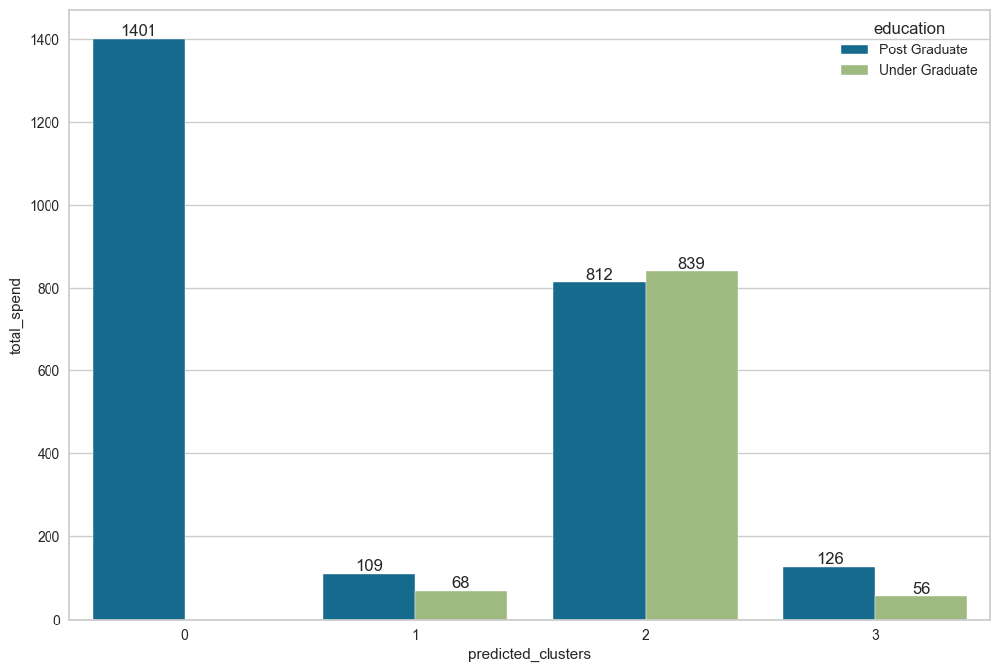

In [1546]:
# Kümeleri belirle
clusters = df['predicted_clusters'].unique()

# Sonuçları saklamak için boş bir liste oluştur
cluster_family_spent = []

# Her küme için 'education' sütununa göre gruplama yaparak ortalama 'spent' değerlerini hesapla
for cluster in clusters:
    cluster_data = df1[df1['predicted_clusters'] == cluster]
    grouped_data = cluster_data.groupby('education')['total_spend'].mean().reset_index()
    grouped_data['predicted_clusters'] = cluster
    cluster_family_spent.append(grouped_data)

# Listeyi DataFrame'e dönüştür
cluster_family_spent_df = pd.concat(cluster_family_spent, ignore_index=True)

# Grafiği çiz
plt.figure(figsize=(12, 8))
ax = sns.barplot(data=cluster_family_spent_df, x='predicted_clusters', y='total_spend', hue='education')

for container in ax.containers:
    for bar in container:
        count = int(bar.get_height())
        ax.text(bar.get_x() + bar.get_width() / 2, count + 0.1, count, ha='center', va='bottom')

plt.show()


In [1547]:
numerical_df = df1.select_dtypes(include=['int64', 'float64','int32'])

In [1548]:
numerical_df

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,total_spend,accepted_camps,total_purchases,predicted_clusters,response,camp1,camp2,camp3,camp4,camp5
0,58138,0,0,58,635,88,546,172,88,88,...,1617,0,25,0,1,0,0,0,0,0
1,46344,1,1,38,11,1,6,2,1,6,...,27,0,6,3,0,0,0,0,0,0
2,71613,0,0,26,426,49,127,111,21,42,...,776,0,21,0,0,0,0,0,0,0
3,26646,1,0,26,11,4,20,10,3,5,...,53,0,8,1,0,0,0,0,0,0
4,58293,1,0,94,173,43,118,46,27,15,...,422,0,19,2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,61223,1,0,46,709,43,182,42,118,247,...,1341,0,18,2,0,0,0,0,0,0
2190,64014,0,0,56,406,0,30,0,0,8,...,444,1,22,3,1,0,0,0,0,0
2191,56981,1,1,91,908,48,217,32,12,24,...,1241,1,19,0,0,0,0,0,0,0
2192,69245,0,0,8,428,30,214,80,30,61,...,843,0,23,2,0,0,0,0,0,0


In [1549]:
clus_pred = numerical_df.iloc[:, :-1].groupby("predicted_clusters").mean().T
clus_pred

predicted_clusters,0,1,2,3
income,"75,931.27","30,408.50","59,753.72","42,398.32"
kidhome,0.46,0.43,0.44,0.44
teenhome,0.49,0.50,0.49,0.54
recency,49.50,48.88,48.65,50.74
mnt_wines,624.43,36.29,490.98,72.88
mnt_fruits,66.44,6.87,30.25,3.85
mnt_meat_products,464.01,27.09,157.51,25.47
mnt_fish_products,100.43,10.61,37.09,5.46
mnt_sweet_products,69.34,6.97,30.03,3.86
mnt_gold_prods,76.49,17.93,66.60,14.49


''

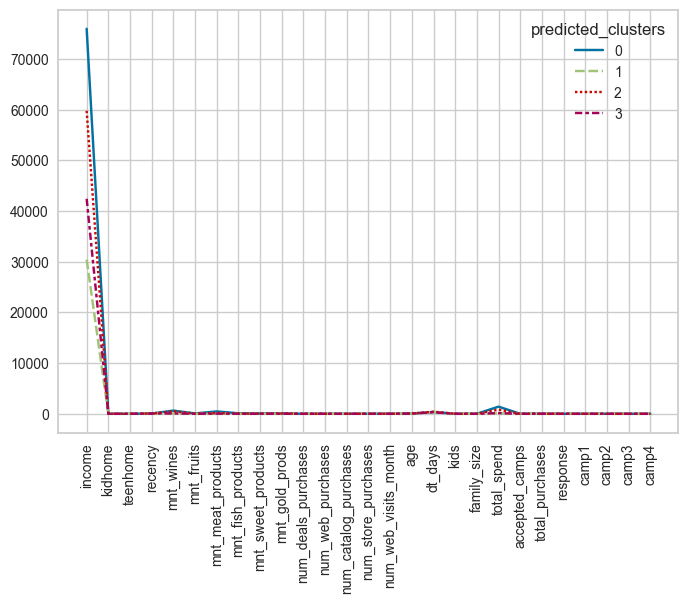

In [1550]:
sns.lineplot(data = clus_pred)
plt.xticks(rotation=90)
;

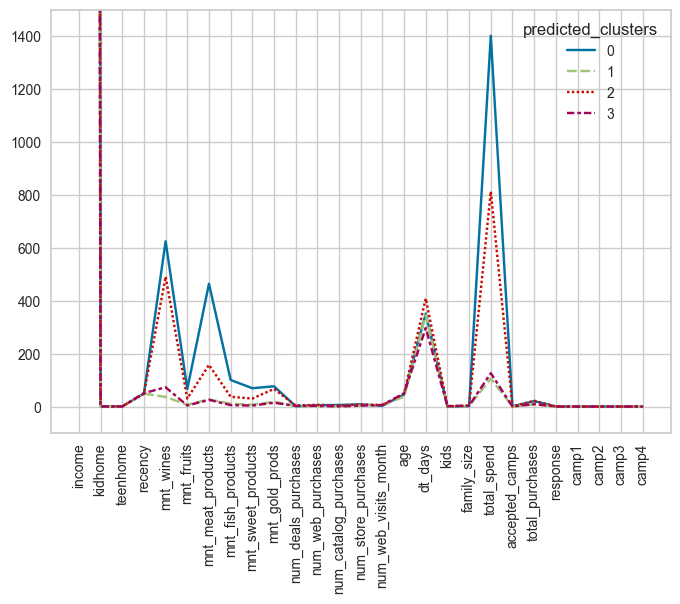

In [1551]:
sns.lineplot(data = clus_pred)
plt.xticks(rotation=90)
plt.ylim(-100,1500);

feature selection

income
mntwines
mntmeatproducts
mntgoldprods
days_since_enrollment
spent

In [1552]:
df1.columns

Index(['education', 'marital_status', 'income', 'kidhome', 'teenhome',
       'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products',
       'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods',
       'num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases',
       'num_store_purchases', 'num_web_visits_month', 'age', 'dt_days', 'kids',
       'family_size', 'total_spend', 'accepted_camps', 'total_purchases',
       'predicted_clusters', 'response', 'camp1', 'camp2', 'camp3', 'camp4',
       'camp5', 'income_class'],
      dtype='object')

In [1553]:
df2 = df[['income', 'mnt_wines', 'mnt_meat_products', 'mnt_gold_prods', 'dt_days', 'total_spend']]
df2

,income,mnt_wines,mnt_meat_products,mnt_gold_prods,dt_days,total_spend
0,58138,635,546,88,663,1617
1,46344,11,6,6,113,27
2,71613,426,127,42,312,776
3,26646,11,20,5,139,53
4,58293,173,118,15,161,422
...,...,...,...,...,...,...
2189,61223,709,182,247,381,1341
2190,64014,406,30,8,19,444
2191,56981,908,217,24,155,1241
2192,69245,428,214,61,156,843


In [1554]:
scaler = StandardScaler()

In [1555]:
scaled_df2 = scaler.fit_transform(df2)
scaled_df2

array([[ 0.3162741 ,  0.98720198,  1.74292248,  0.84974829,  1.5380769 ,
         1.68842529],
       [-0.25494592, -0.87337503, -0.72954423, -0.73052951, -1.18771518,
        -0.96392148],
       [ 0.96891015,  0.36402795, -0.17552854, -0.03674901, -0.20147405,
         0.28551734],
       ...,
       [ 0.260237  ,  1.80120443,  0.23654924, -0.38363926, -0.97956379,
         1.06120366],
       [ 0.85422057,  0.36999134,  0.22281332,  0.32941292, -0.9746078 ,
         0.3972829 ],
       [ 0.06108008, -0.65571138, -0.47771892, -0.4414543 ,  1.33488149,
        -0.7220408 ]])

In [1556]:
scaled_X1 = pd.DataFrame(scaled_df2, columns = df2.columns)
scaled_X1.head()

,income,mnt_wines,mnt_meat_products,mnt_gold_prods,dt_days,total_spend
0,0.32,0.99,1.74,0.85,1.54,1.69
1,-0.25,-0.87,-0.73,-0.73,-1.19,-0.96
2,0.97,0.36,-0.18,-0.04,-0.20,0.29
3,-1.21,-0.87,-0.67,-0.75,-1.06,-0.92
4,0.32,-0.39,-0.22,-0.56,-0.95,-0.31


In [1557]:
hopkins(scaled_X1, 0.05)

0.9073524998670199

In [1558]:
hopkins(scaled_X1, 1)

0.8949210121010008

#### Determine optimal number of clusters for selected features

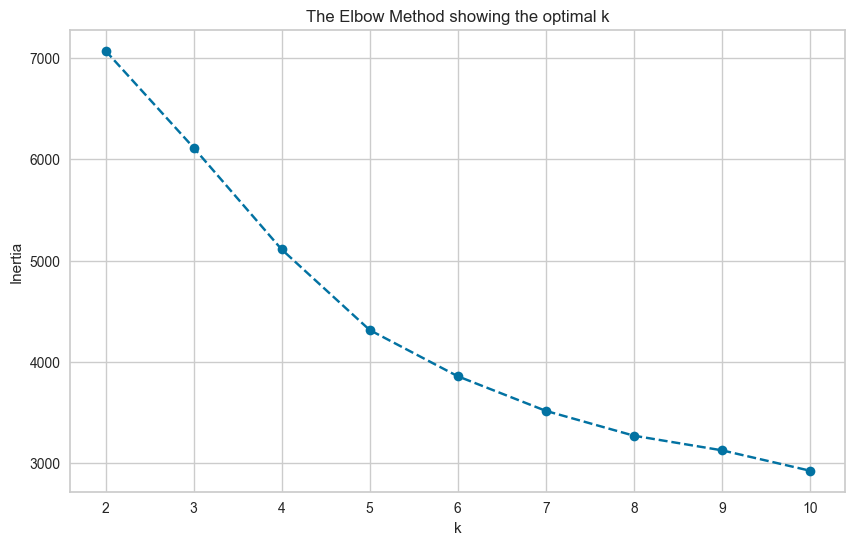

In [1559]:
elbow_vis(scaled_X1)

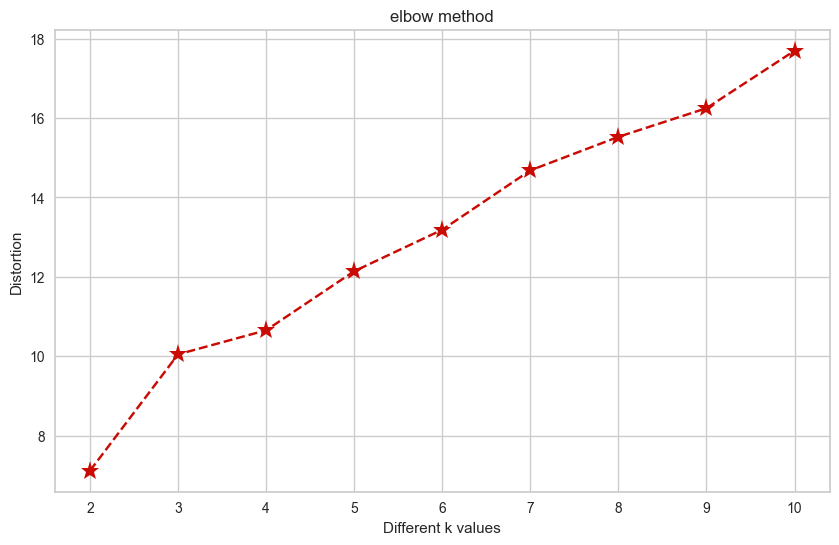

In [1560]:
elbow_vis(scaled_X1, inertia = False)

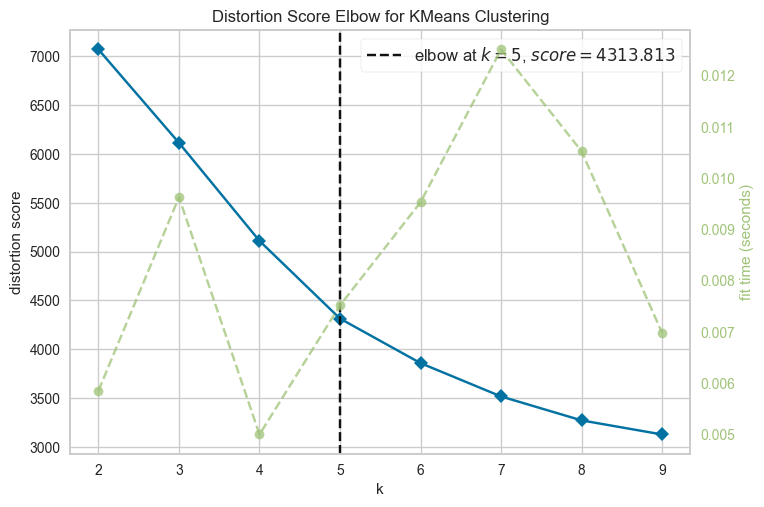

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [1561]:
from yellowbrick.cluster import KElbowVisualizer

kmeans = KMeans(random_state=42)
visu = KElbowVisualizer(kmeans, k = (2,10))
visu.fit(scaled_X1)
visu.poof()

In [1562]:
range_n_clusters = range(2,10)
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,
                    random_state=42)
    kmeans.fit(scaled_X1)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(scaled_X1, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.4267887354147521
For n_clusters=3, the silhouette score is 0.3915512085978861
For n_clusters=4, the silhouette score is 0.28026782806090145
For n_clusters=5, the silhouette score is 0.28657577383645194
For n_clusters=6, the silhouette score is 0.2901682911830734
For n_clusters=7, the silhouette score is 0.29346877760966406
For n_clusters=8, the silhouette score is 0.276530991290045
For n_clusters=9, the silhouette score is 0.24282333962903957


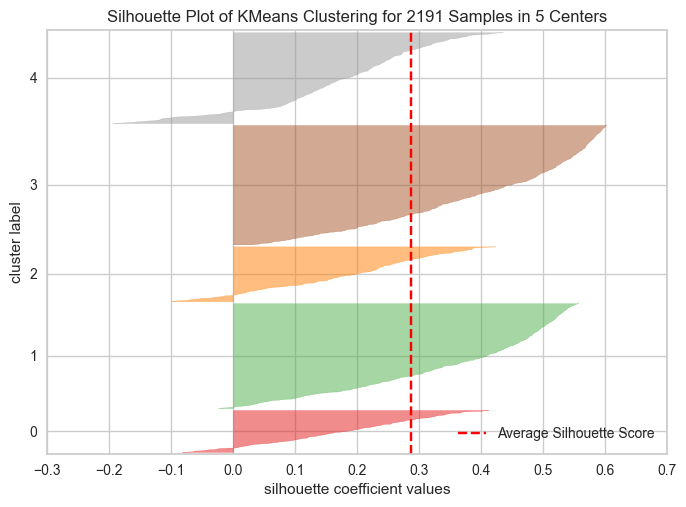

In [1563]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model3 = KMeans(n_clusters=5,
                random_state=42)          # we decided n_clusters=5!
visualizer = SilhouetteVisualizer(model3)

visualizer.fit(scaled_X1)    # Fit the data to the visualizer
visualizer.poof();

# With this feature of yellowbrick, we can see the silhouette scores of each cluster separately.

#### Building the model based on the optimal number of clusters with selected features

In [1564]:
K_means_model = KMeans(n_clusters = 5, random_state=42)
K_means_model.fit_predict(scaled_X1)

array([2, 3, 4, ..., 4, 4, 1])

In [1565]:
K_means_model.labels_

array([2, 3, 4, ..., 4, 4, 1])

In [1566]:
clusters = K_means_model.labels_

In [1567]:
df2['clusters'] = clusters

In [1568]:
df2

,income,mnt_wines,mnt_meat_products,mnt_gold_prods,dt_days,total_spend,clusters
0,58138,635,546,88,663,1617,2
1,46344,11,6,6,113,27,3
2,71613,426,127,42,312,776,4
3,26646,11,20,5,139,53,3
4,58293,173,118,15,161,422,3
...,...,...,...,...,...,...,...
2189,61223,709,182,247,381,1341,0
2190,64014,406,30,8,19,444,3
2191,56981,908,217,24,155,1241,4
2192,69245,428,214,61,156,843,4


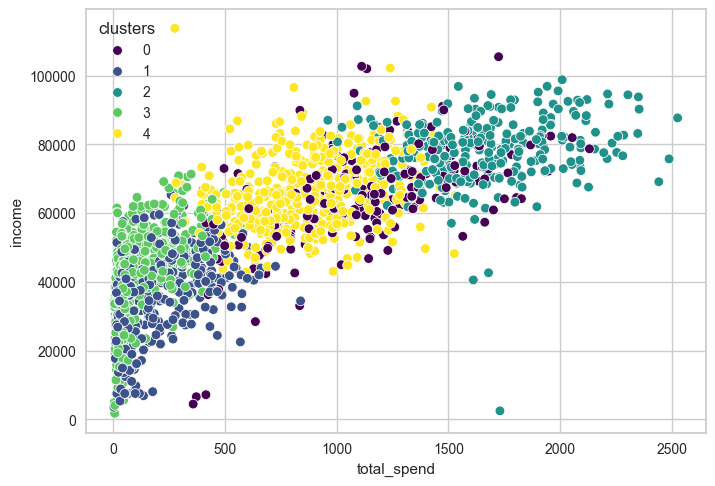

In [1569]:
sns.scatterplot(data=df2, x="total_spend", y="income", hue="clusters", palette = 'viridis');

# K_means Part2



In [1570]:
df3 = df[['income', 'total_spend']]
df3

,income,total_spend
0,58138,1617
1,46344,27
2,71613,776
3,26646,53
4,58293,422
...,...,...
2189,61223,1341
2190,64014,444
2191,56981,1241
2192,69245,843


In [1571]:
scaler = StandardScaler()

In [1572]:
scaled_df3 = scaler.fit_transform(df3)
scaled_df3

array([[ 0.3162741 ,  1.68842529],
       [-0.25494592, -0.96392148],
       [ 0.96891015,  0.28551734],
       ...,
       [ 0.260237  ,  1.06120366],
       [ 0.85422057,  0.3972829 ],
       [ 0.06108008, -0.7220408 ]])

In [1573]:
scaled_X3 = pd.DataFrame(scaled_df3, columns = df3.columns)
scaled_X3.head()

,income,total_spend
0,0.32,1.69
1,-0.25,-0.96
2,0.97,0.29
3,-1.21,-0.92
4,0.32,-0.31


In [1574]:
hopkins(scaled_X3, 0.05)

0.9204518771597916

In [1575]:
hopkins(scaled_X3, 1)

0.9284867443149323

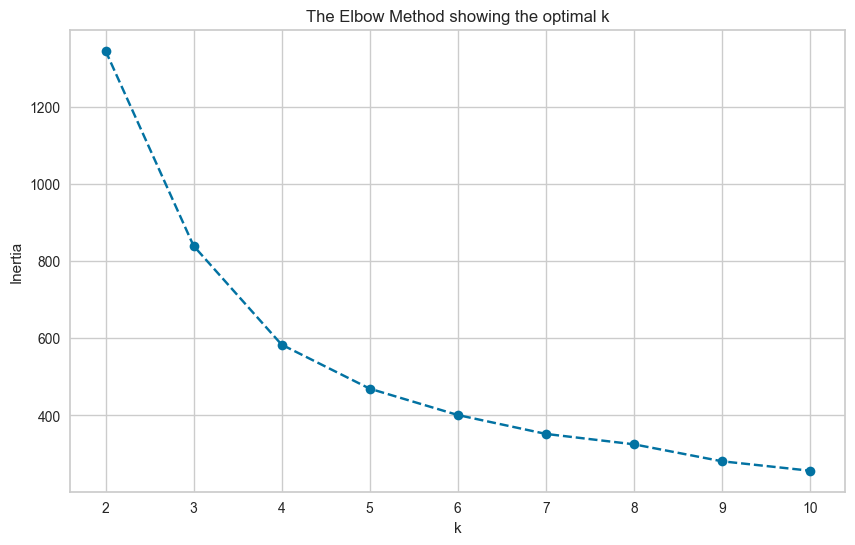

In [1576]:
elbow_vis(scaled_X3)

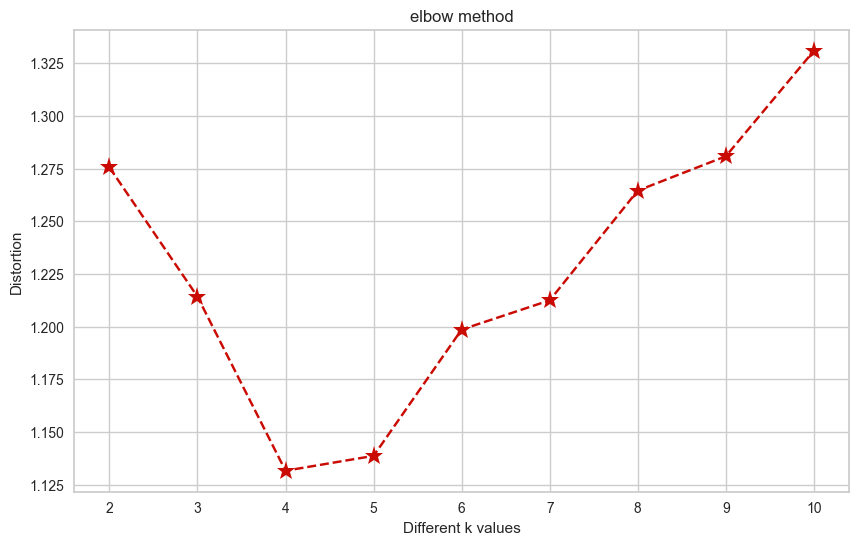

In [1577]:
elbow_vis(scaled_X3, inertia = False)

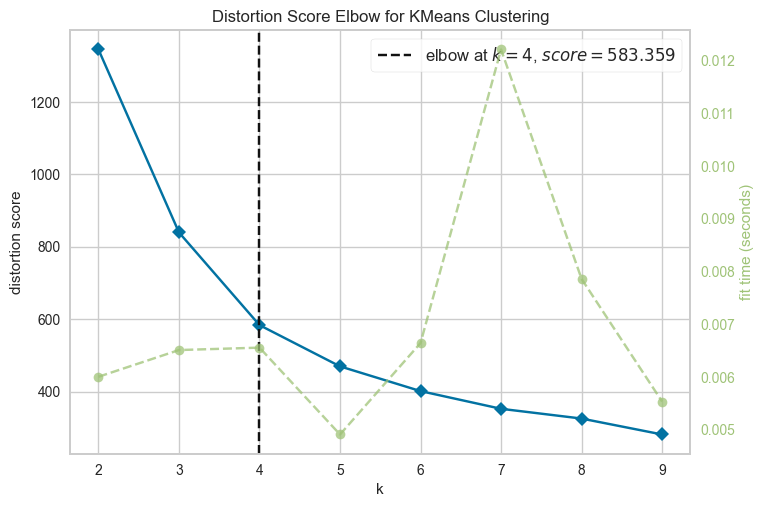

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [1578]:
from yellowbrick.cluster import KElbowVisualizer

kmeans = KMeans(random_state=42)
visu = KElbowVisualizer(kmeans, k = (2,10))
visu.fit(scaled_X3)
visu.poof()

In [1579]:
range_n_clusters = range(2,10)
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,
                    random_state=42)
    kmeans.fit(scaled_X3)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(scaled_X3, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.5883292624561092
For n_clusters=3, the silhouette score is 0.4822313512637848
For n_clusters=4, the silhouette score is 0.4389658799552602
For n_clusters=5, the silhouette score is 0.409422740177371
For n_clusters=6, the silhouette score is 0.390872743789243
For n_clusters=7, the silhouette score is 0.37679146706439187
For n_clusters=8, the silhouette score is 0.35499873965970347
For n_clusters=9, the silhouette score is 0.35429342601985525


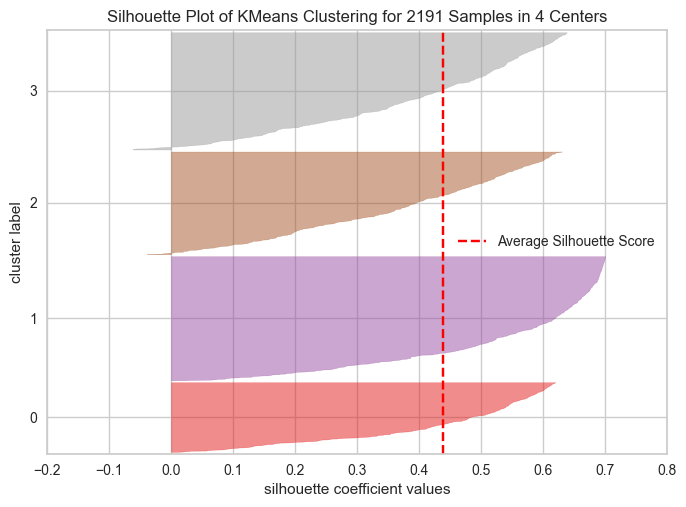

In [1580]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model3 = KMeans(n_clusters=4,
                random_state=42)          # we decided n_clusters=4!
visualizer = SilhouetteVisualizer(model3)

visualizer.fit(scaled_X3)    # Fit the data to the visualizer
visualizer.poof();

In [1581]:
K_means_model = KMeans(n_clusters = 4, random_state=42)
K_means_model.fit_predict(scaled_X3)

array([0, 3, 2, ..., 2, 2, 3])

In [1582]:
K_means_model.labels_

array([0, 3, 2, ..., 2, 2, 3])

In [1583]:
clusters3 = K_means_model.labels_

In [1584]:
df3['predicted_clusters'] = clusters3

In [1585]:
df3

,income,total_spend,predicted_clusters
0,58138,1617,0
1,46344,27,3
2,71613,776,2
3,26646,53,1
4,58293,422,3
...,...,...,...
2189,61223,1341,2
2190,64014,444,3
2191,56981,1241,2
2192,69245,843,2


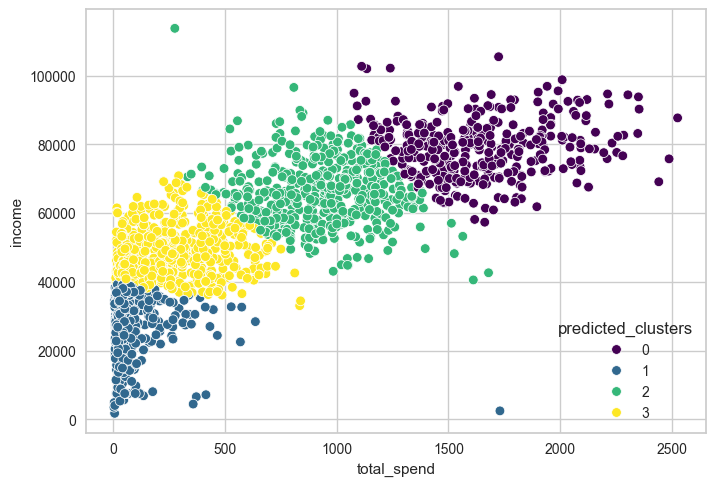

In [1586]:
sns.scatterplot(data=df3, x="total_spend", y="income", hue="predicted_clusters", palette = 'viridis');

In [1587]:
clusters_mapping = {1: 'bronze',
                   3 : 'silver',
                   2 : 'gold',
                   0 : 'diamond'}

In [1588]:
df3['clusters'] = df3.predicted_clusters.map(clusters_mapping)

In [1589]:
#df3['cat_income'] = df1['income_category']

In [1590]:
df3

,income,total_spend,predicted_clusters,clusters
0,58138,1617,0,diamond
1,46344,27,3,silver
2,71613,776,2,gold
3,26646,53,1,bronze
4,58293,422,3,silver
...,...,...,...,...
2189,61223,1341,2,gold
2190,64014,444,3,silver
2191,56981,1241,2,gold
2192,69245,843,2,gold


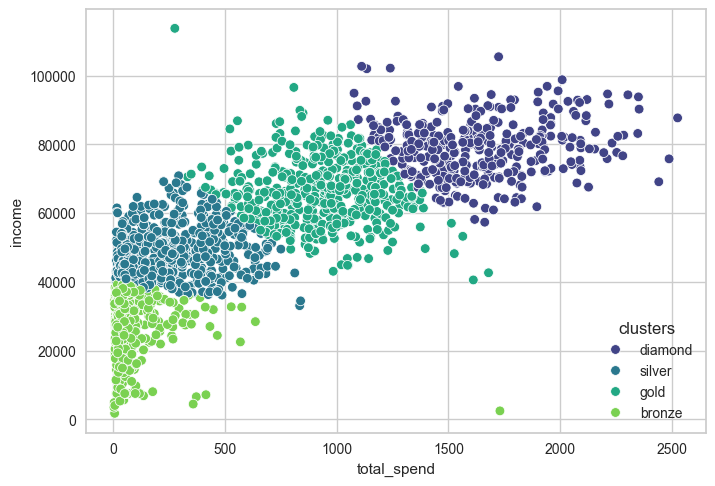

In [1591]:
sns.scatterplot(data=df3, x="total_spend", y="income", hue="clusters", palette = 'viridis');

In [1592]:
df3.clusters.unique()

array(['diamond', 'silver', 'gold', 'bronze'], dtype=object)

In [1593]:

cluster_names = ['diamond', 'silver', 'gold', 'bronze']

cluster_means = []

# Her küme için ortalama 'income' ve 'spent' değerlerini hesapla
for cluster in cluster_names:
    cluster_data = df3[df3['clusters'] == cluster][['income', 'total_spend']].mean()
    cluster_means.append({
        'clusters': cluster,
        'income_mean': cluster_data['income'],
        'spent_mean': cluster_data['total_spend']
    })

cluster_means_df = pd.DataFrame(cluster_means)

cluster_means_df.sort_values(by = 'income_mean')

,clusters,income_mean,spent_mean
3,bronze,"27,153.85",77.31
1,silver,"48,564.30",267.38
2,gold,"66,040.28",930.83
0,diamond,"78,993.06","1,631.43"


In [1594]:
df3['total_acceptedcmp'] = numeric_df['accepted_camps']

In [1595]:
df3

,income,total_spend,predicted_clusters,clusters,total_acceptedcmp
0,58138,1617,0,diamond,0
1,46344,27,3,silver,0
2,71613,776,2,gold,0
3,26646,53,1,bronze,0
4,58293,422,3,silver,0
...,...,...,...,...,...
2189,61223,1341,2,gold,0
2190,64014,444,3,silver,1
2191,56981,1241,2,gold,1
2192,69245,843,2,gold,0


In [1596]:
df3.groupby('clusters')['total_acceptedcmp'].mean()

clusters
bronze    0.08
diamond   0.97
gold      0.30
silver    0.12
Name: total_acceptedcmp, dtype: float64

In [1597]:
df3.groupby('clusters')['total_acceptedcmp'].sum()

clusters
bronze      53
diamond    357
gold       165
silver      75
Name: total_acceptedcmp, dtype: int64

In [1598]:
df3.groupby(['clusters',  'total_acceptedcmp'])['total_spend'].mean()

clusters  total_acceptedcmp
bronze    0                      77.17
          1                      78.94
diamond   0                   1,548.41
          1                   1,685.35
          2                   1,632.95
          3                   1,864.72
          4                   1,645.11
gold      0                     919.90
          1                     956.81
          2                   1,027.39
          3                     989.75
          4                        856
silver    0                     256.32
          1                     364.54
          2                     265.17
Name: total_spend, dtype: float64

## Evaluation by Clusters

In [1599]:
df3

,income,total_spend,predicted_clusters,clusters,total_acceptedcmp
0,58138,1617,0,diamond,0
1,46344,27,3,silver,0
2,71613,776,2,gold,0
3,26646,53,1,bronze,0
4,58293,422,3,silver,0
...,...,...,...,...,...
2189,61223,1341,2,gold,0
2190,64014,444,3,silver,1
2191,56981,1241,2,gold,1
2192,69245,843,2,gold,0


In [1600]:
df1.head()

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,accepted_camps,total_purchases,predicted_clusters,response,camp1,camp2,camp3,camp4,camp5,income_class
0,Post Graduate,Single,58138,0,0,58,635,88,546,172,...,0,25,0,1,0,0,0,0,0,low_income
1,Post Graduate,Single,46344,1,1,38,11,1,6,2,...,0,6,3,0,0,0,0,0,0,medium_high_income
2,Post Graduate,Married,71613,0,0,26,426,49,127,111,...,0,21,0,0,0,0,0,0,0,low_income
3,Post Graduate,Married,26646,1,0,26,11,4,20,10,...,0,8,1,0,0,0,0,0,0,high_income
4,Post Graduate,Married,58293,1,0,94,173,43,118,46,...,0,19,2,0,0,0,0,0,0,medium_low_income


In [1601]:
eval_df = df1.copy()

In [1602]:
eval_df['clusters'] = df3['clusters']

In [1603]:
eval_df['predicted_clusters'] = df3['predicted_clusters']

In [1604]:
eval_df.income.describe()

count        2191
mean    51,607.88
std     20,651.75
min          1730
25%         35402
50%         51369
75%         68145
max        113734
Name: income, dtype: float64

In [1605]:
# Define bins for income classes
bins = [0, 35000, 60000, 80000, float('inf')]  # You can adjust the bin edges as needed

# Define labels for the income classes
labels = ['Low', 'Medium', 'High', 'Very High']

# Create a new column 'income_class' based on the bins
eval_df['income_class'] = pd.cut(eval_df['income'], bins=bins, labels=labels, right=False)
35

35

In [1606]:
eval_df.total_spend.describe()

count     2191
mean    604.84
std     599.61
min          5
25%         69
50%        396
75%       1041
max       2524
Name: total_spend, dtype: float64

In [1607]:
# Define bins based on percentiles
bins = [eval_df['total_spend'].min(), 69, 396, 1041, eval_df['total_spend'].max()]

# Define labels for total spend categories
labels = ['Low', 'Medium', 'High', 'Very High']

# Create a new column 'spend_class' based on the bins
eval_df['spend_class'] = pd.cut(eval_df['total_spend'], bins=bins, labels=labels, right=False)

In [1608]:
eval_df

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,predicted_clusters,response,camp1,camp2,camp3,camp4,camp5,income_class,clusters,spend_class
0,Post Graduate,Single,58138,0,0,58,635,88,546,172,...,0,1,0,0,0,0,0,Medium,diamond,Very High
1,Post Graduate,Single,46344,1,1,38,11,1,6,2,...,3,0,0,0,0,0,0,Medium,silver,Low
2,Post Graduate,Married,71613,0,0,26,426,49,127,111,...,2,0,0,0,0,0,0,High,gold,High
3,Post Graduate,Married,26646,1,0,26,11,4,20,10,...,1,0,0,0,0,0,0,Low,bronze,Low
4,Post Graduate,Married,58293,1,0,94,173,43,118,46,...,3,0,0,0,0,0,0,Medium,silver,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,Post Graduate,Married,61223,1,0,46,709,43,182,42,...,2,0,0,0,0,0,0,High,gold,Very High
2190,Post Graduate,Married,64014,0,0,56,406,0,30,0,...,3,1,0,0,0,0,0,High,silver,High
2191,Post Graduate,Single,56981,1,1,91,908,48,217,32,...,2,0,0,0,0,0,0,Medium,gold,Very High
2192,Post Graduate,Married,69245,0,0,8,428,30,214,80,...,2,0,0,0,0,0,0,High,gold,High


In [1609]:
eval_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2191 entries, 0 to 2193
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   education              2191 non-null   object  
 1   marital_status         2191 non-null   object  
 2   income                 2191 non-null   float64 
 3   kidhome                2191 non-null   int64   
 4   teenhome               2191 non-null   int64   
 5   recency                2191 non-null   int64   
 6   mnt_wines              2191 non-null   int64   
 7   mnt_fruits             2191 non-null   int64   
 8   mnt_meat_products      2191 non-null   int64   
 9   mnt_fish_products      2191 non-null   int64   
 10  mnt_sweet_products     2191 non-null   int64   
 11  mnt_gold_prods         2191 non-null   int64   
 12  num_deals_purchases    2191 non-null   int64   
 13  num_web_purchases      2191 non-null   int64   
 14  num_catalog_purchases  2191 non-null   int64 

In [1610]:
def cluster(df, column):
    _, axes = plt.subplots(figsize=(20, 8))
    sns.kdeplot(x=df[column], y=df["total_spend"], hue=df["clusters"], kind="kde", height=10, palette=["#B9C0C9", "#682F2F", "#9F8A78", "#F3AB60"])
    axes.set_title(f"\nClustering Profile On {column}\n", fontsize=25)
    axes.set_ylabel("Spending", fontsize=20)
    axes.set_xlabel(f"\n{column}", fontsize=20)
    
    sns.despine(left=True, bottom=True)
    plt.show()

### Bronze Cluster

In [1611]:
bronze_df = eval_df[eval_df['clusters'] == 'bronze']

In [1612]:
eval_df['clusters'].value_counts(normalize=True)

clusters
bronze    0.30
silver    0.28
gold      0.25
diamond   0.17
Name: proportion, dtype: float64

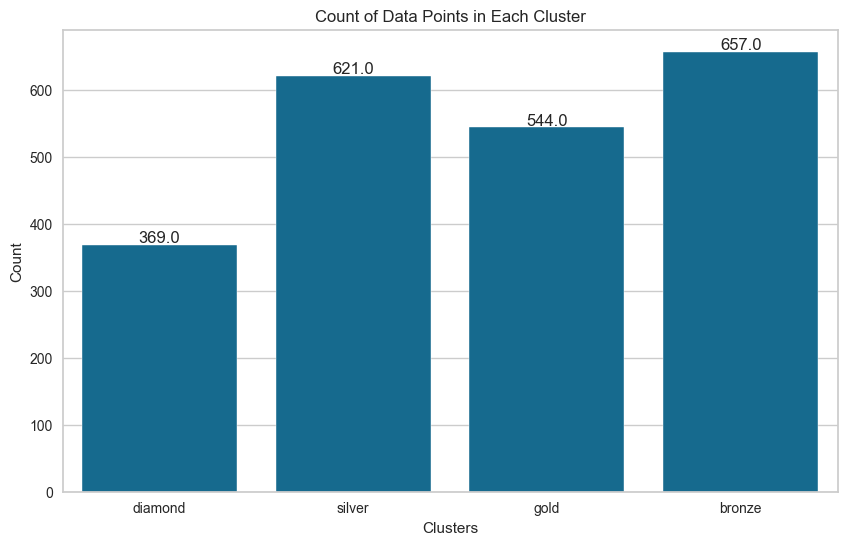

In [1613]:
# Plotting countplot for original clusters
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='clusters', data=eval_df)
# Adding annotations
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.title('Count of Data Points in Each Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.show()

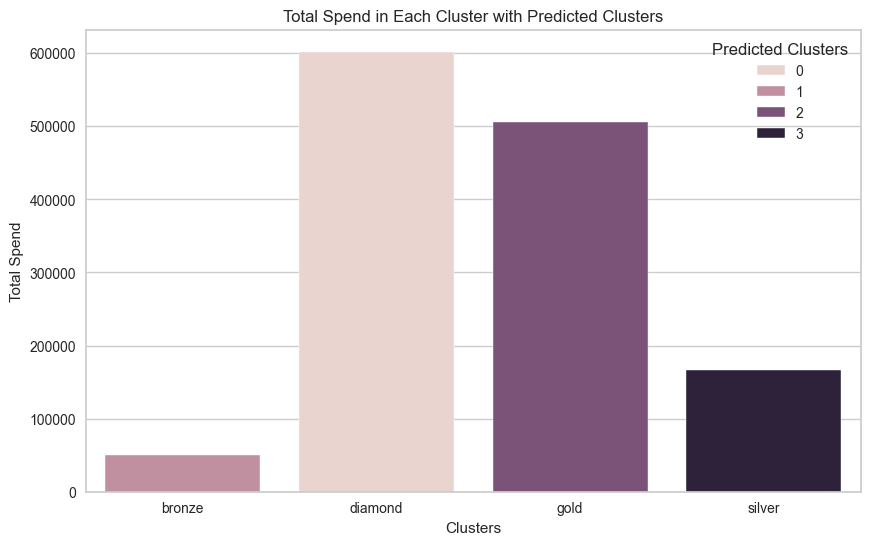

In [1614]:
# Aggregating total spend per cluster
aggregated_data = eval_df.groupby(['clusters', 'predicted_clusters'])['total_spend'].sum().reset_index()

# Plotting bar plot for total spend per cluster
plt.figure(figsize=(10, 6))
sns.barplot(x='clusters', y='total_spend', hue='predicted_clusters', data=aggregated_data)
plt.title('Total Spend in Each Cluster with Predicted Clusters')
plt.xlabel('Clusters')
plt.ylabel('Total Spend')
plt.legend(title='Predicted Clusters')
plt.show()

In [1615]:
bronze_df[['age']].describe()

,age
count,657
mean,40.56
std,10.67
min,18
25%,32
50%,39
75%,47
max,68


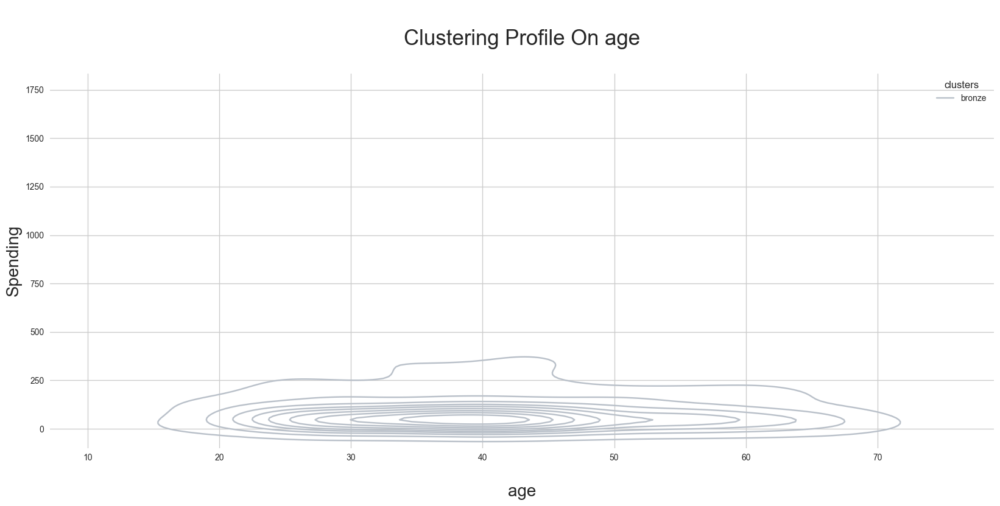

In [1616]:
cluster(bronze_df,'age')

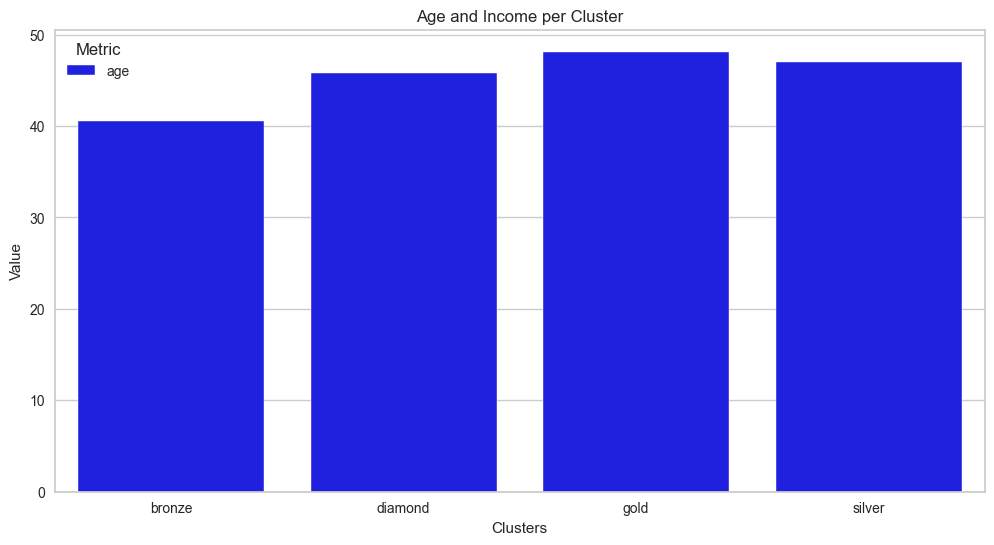

In [1617]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'age': 'mean'
    
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['age'], var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data, palette={'age': 'blue', 'income': 'green'})
plt.title('Age and Income per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric')
plt.show()

In [1618]:
bronze_df.income_class.unique()

['Low', 'Medium']
Categories (4, object): ['Low' < 'Medium' < 'High' < 'Very High']

In [1619]:
bronze_df.income_class.value_counts()

income_class
Low          540
Medium       117
High           0
Very High      0
Name: count, dtype: int64

In [1620]:
bronze_df.income_class.value_counts(normalize=True)

income_class
Low         0.82
Medium      0.18
High           0
Very High      0
Name: proportion, dtype: float64

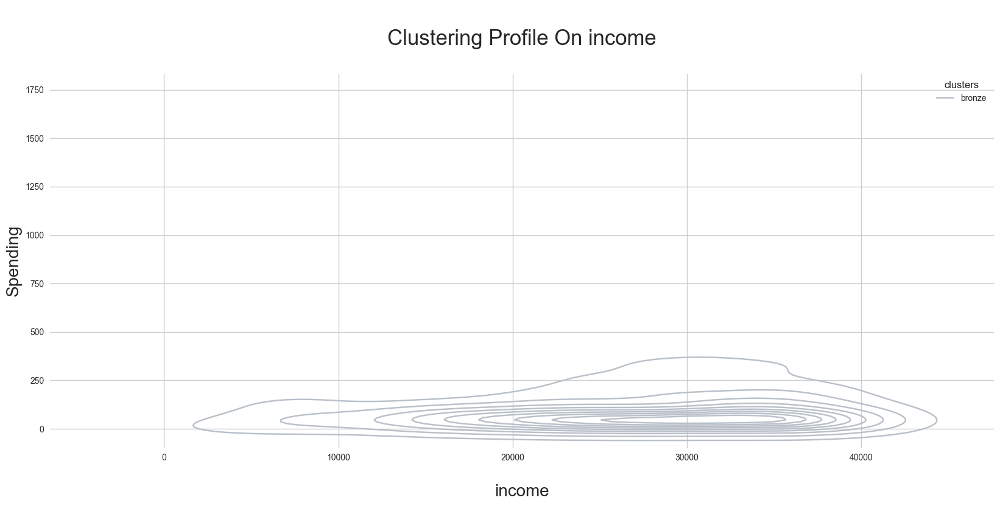

In [1621]:
cluster(bronze_df,'income')

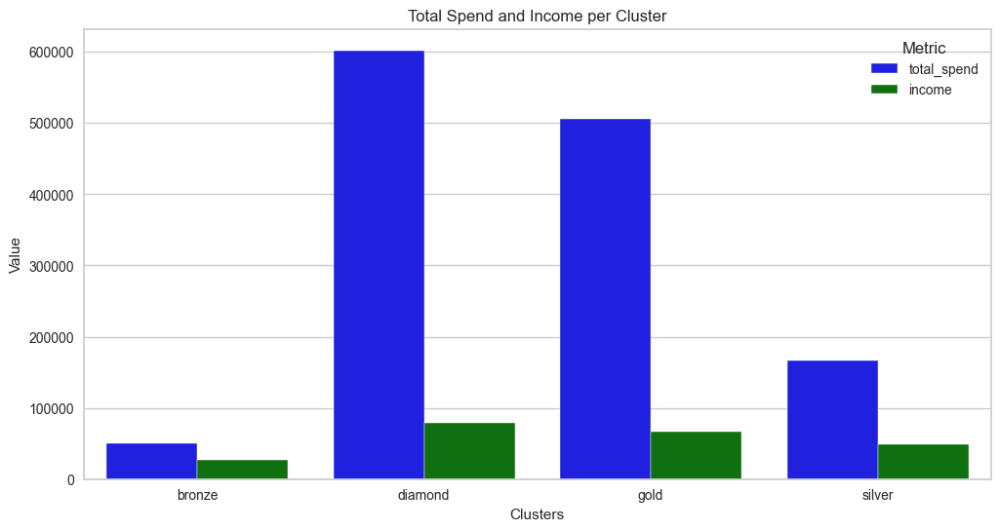

In [1622]:
# Aggregating total spend and income per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'total_spend': 'sum',
    'income': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = aggregated_data.melt(id_vars='clusters', value_vars=['total_spend', 'income'], var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data, palette={'total_spend': 'blue', 'income': 'green'})
plt.title('Total Spend and Income per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric')
plt.show()

In [1623]:
bronze_df.mnt_gold_prods.value_counts()

mnt_gold_prods
1      49
5      45
3      43
2      42
4      38
       ..
85      1
108     1
72      1
37      1
53      1
Name: count, Length: 68, dtype: int64

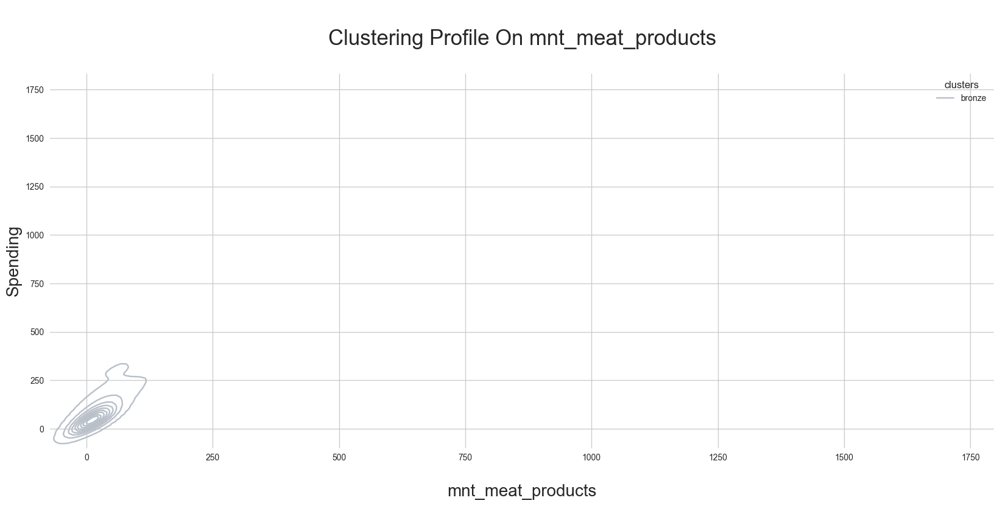

In [1624]:
cluster(bronze_df,'mnt_meat_products')

In [1625]:
bronze_df.mnt_wines.value_counts()

mnt_wines
2      40
5      35
6      35
1      35
4      32
       ..
152     1
67      1
66      1
76      1
70      1
Name: count, Length: 95, dtype: int64

In [1626]:
bronze_df.total_purchases.value_counts()

total_purchases
5     109
4      98
7      97
6      90
9      69
8      58
10     45
11     33
12     15
17      7
13      7
16      6
15      5
14      4
18      3
2       2
1       2
0       2
25      2
27      1
43      1
19      1
Name: count, dtype: int64

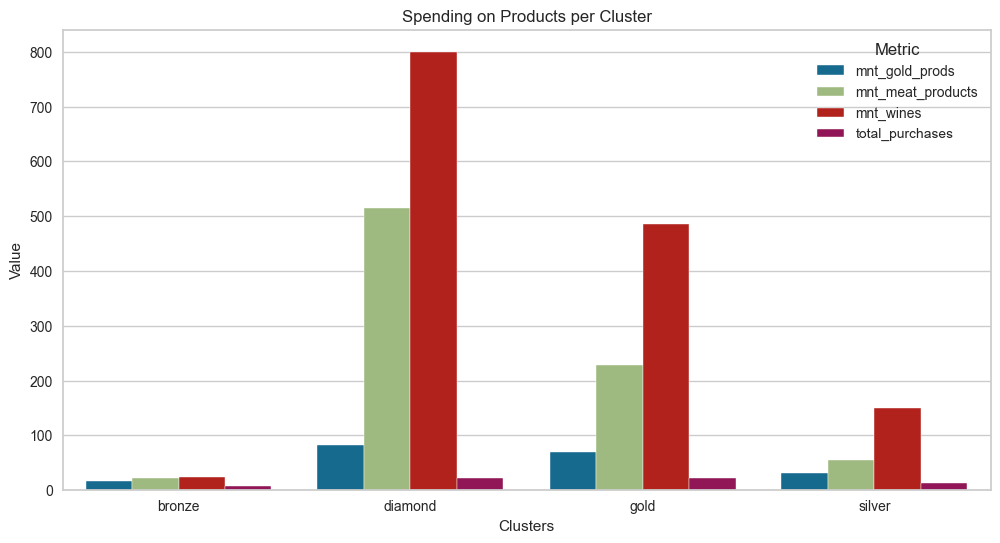

In [1627]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'mnt_gold_prods': 'mean',
    'mnt_meat_products': 'mean',
    'mnt_wines': 'mean',
    'total_purchases': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['mnt_gold_prods', 'mnt_meat_products', 'mnt_wines', 'total_purchases'],
                      var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data)
plt.title('Spending on Products per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric', loc='upper right')
plt.show()


In [1628]:
bronze_df.columns

Index(['education', 'marital_status', 'income', 'kidhome', 'teenhome',
       'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products',
       'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods',
       'num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases',
       'num_store_purchases', 'num_web_visits_month', 'age', 'dt_days', 'kids',
       'family_size', 'total_spend', 'accepted_camps', 'total_purchases',
       'predicted_clusters', 'response', 'camp1', 'camp2', 'camp3', 'camp4',
       'camp5', 'income_class', 'clusters', 'spend_class'],
      dtype='object')

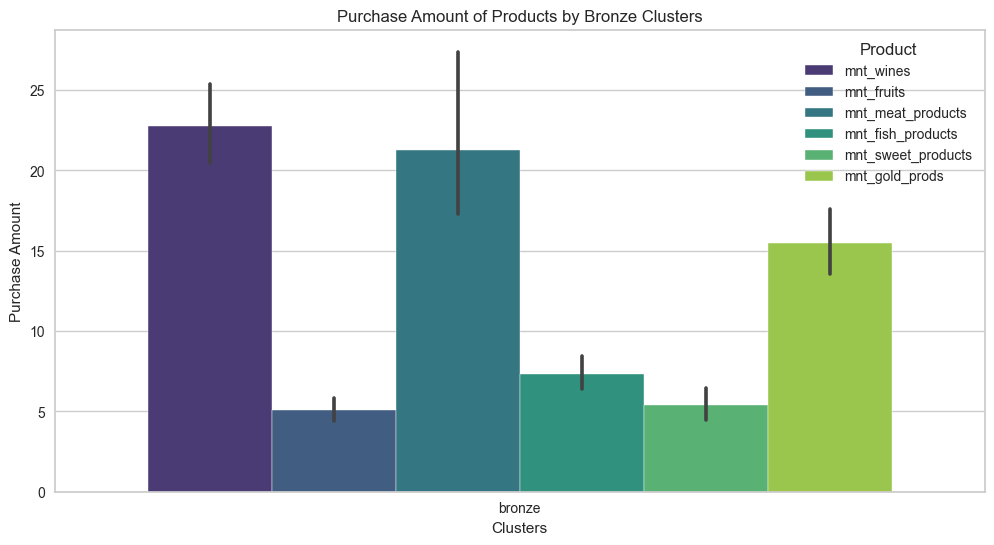

In [1629]:
# Subset the data for product columns only
products_columns = ['mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods']
bronze_df_products = bronze_df[['clusters'] + products_columns]

# Reshape the data for plotting
df_melted = pd.melt(bronze_df_products, id_vars='clusters', var_name='Product', value_name='Purchase_Amount')

# Plotting the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Purchase_Amount', hue='Product', data=df_melted, palette='viridis')

# Set the title and labels
plt.title('Purchase Amount of Products by Bronze Clusters')
plt.xlabel('Clusters')
plt.ylabel('Purchase Amount')
plt.legend(title='Product')

# Show the plot
plt.show()

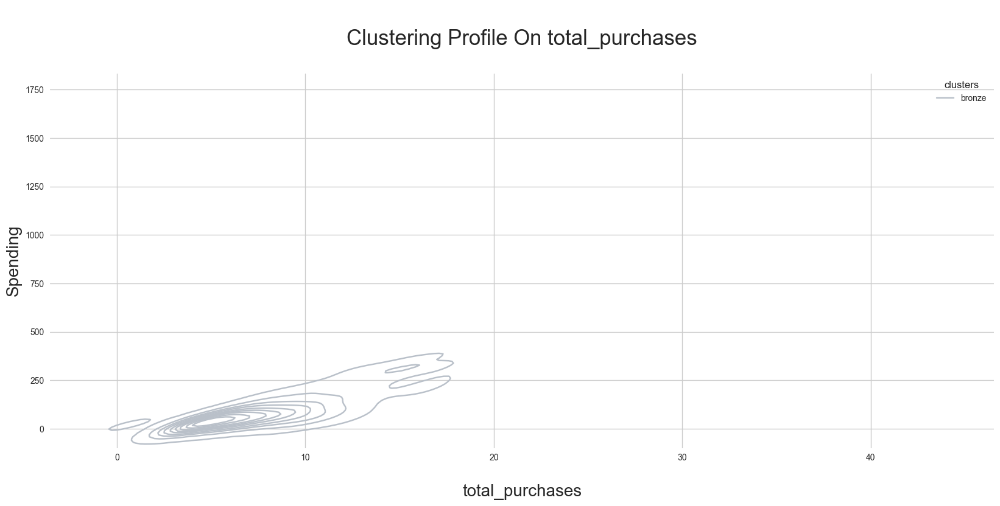

In [1630]:
cluster(bronze_df,'total_purchases')

In [1631]:
bronze_df.total_spend.value_counts()

total_spend
22     17
57     14
44     14
48     13
38     12
       ..
170     1
97      1
172     1
191     1
199     1
Name: count, Length: 175, dtype: int64

In [1632]:
bronze_df.spend_class.value_counts()

spend_class
Low          432
Medium       215
High           9
Very High      1
Name: count, dtype: int64

In [1633]:
bronze_df.kidhome.value_counts()

kidhome
0    381
1    267
2      9
Name: count, dtype: int64

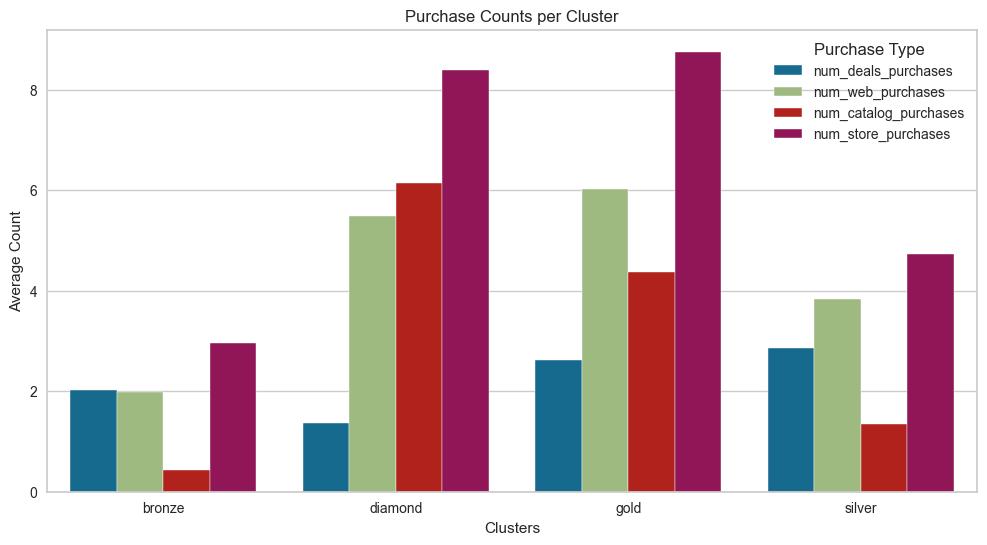

In [1634]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'num_deals_purchases': 'mean',
    'num_web_purchases': 'mean',
    'num_catalog_purchases': 'mean',
    'num_store_purchases': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases', 'num_store_purchases'],
                      var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data)
plt.title('Purchase Counts per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Average Count')
plt.legend(title='Purchase Type', loc='upper right')
plt.show()

In [1635]:
bronze_df.education.value_counts()

education
Post Graduate     604
Under Graduate     53
Name: count, dtype: int64

In [1636]:
bronze_df.education.value_counts(normalize=True)

education
Post Graduate    0.92
Under Graduate   0.08
Name: proportion, dtype: float64

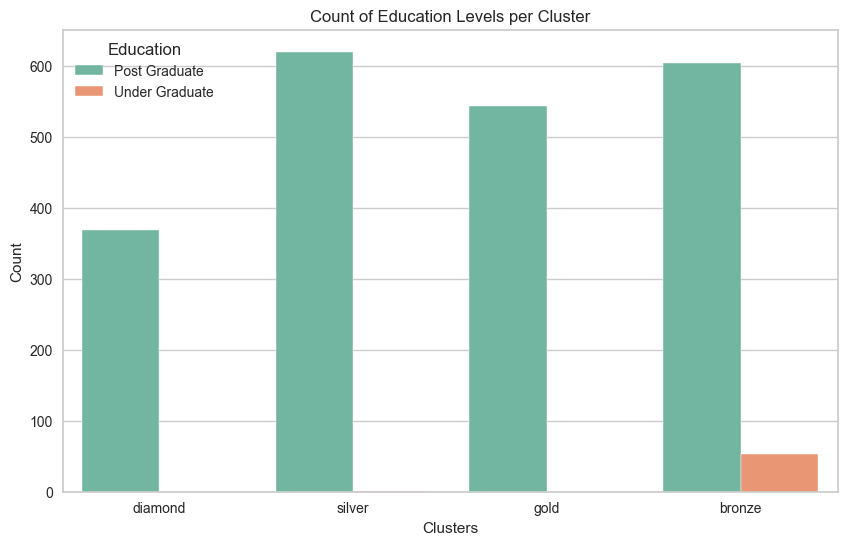

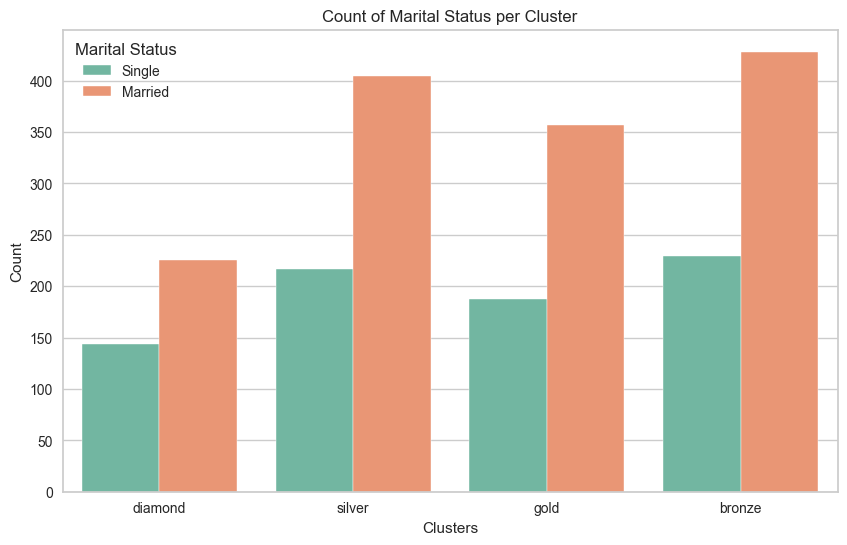

In [1637]:
# Plotting countplot for education
plt.figure(figsize=(10, 6))
sns.countplot(x='clusters', hue='education', data=eval_df, palette='Set2')
plt.title('Count of Education Levels per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.legend(title='Education')
plt.show()

# Plotting countplot for marital_status
plt.figure(figsize=(10, 6))
sns.countplot(x='clusters', hue='marital_status', data=eval_df, palette='Set2')
plt.title('Count of Marital Status per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.legend(title='Marital Status')
plt.show()

In [1638]:
bronze_df_camp = bronze_df[['camp1','camp2','camp3','camp4','camp5']]

In [1639]:
bronze_df_camp

,camp1,camp2,camp3,camp4,camp5
3,0,0,0,0,0
7,0,0,0,0,0
8,0,0,0,0,0
9,0,0,1,0,0
10,0,0,0,0,0
...,...,...,...,...,...
2178,0,0,1,0,0
2184,0,0,0,0,0
2185,0,0,0,1,0
2187,0,0,0,0,1


In [1640]:
# Melt the DataFrame to have a long format for easier plotting
df_melted = bronze_df_camp.melt(var_name='Campaign', value_name='Accepted')

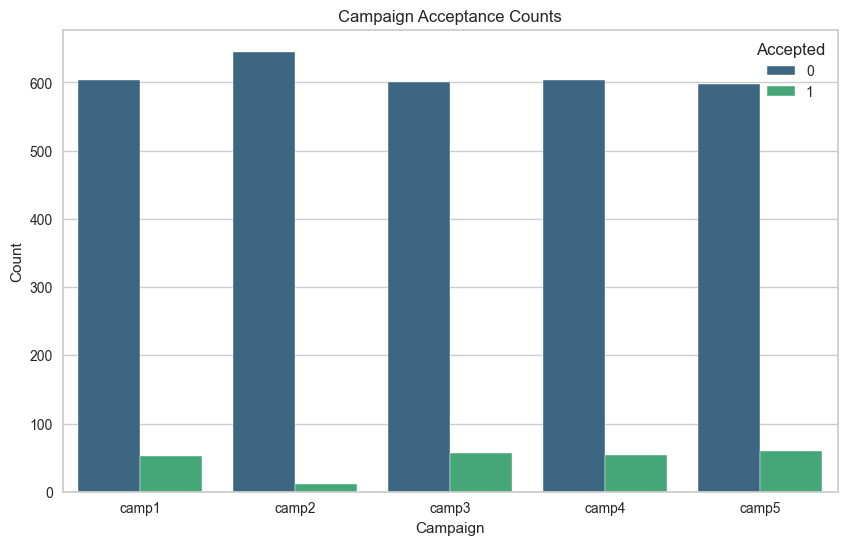

In [1641]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Draw the bar plot
sns.countplot(data=df_melted, x='Campaign', hue='Accepted', palette='viridis')

# Set the title and labels
plt.title('Campaign Acceptance Counts')
plt.xlabel('Campaign')
plt.ylabel('Count')

# Show the plot
plt.show()


## Evaluation

<div style="background-color: #f0f0f0; padding: 10px; margin-top: 10px;">
    <strong>Key Points:</strong><br>
    - Bronze class: 30% of customers<br>
    - Lower spending compared to other classes<br>
    - 82 percent of them have low income level and the rest have middle income level<br>
    - Majority have low income<br>
    - It has a lower average age than the average age in other classes<br>
    - Least purchases in meat gold and wine compared to other classes. But in their own shopping, they mostly bought meat and wine.<br>
    - They shopped mostly from stores.e<br>
    - Majority are post graduates with high marriage rate<br>
    - 92 percent of them are post graduates and the class with the highest marriage rate.<br>
    - Campaigns 1, 3, 4 and 5 were accepted at almost equal rates.<br>
    
</div>

### silver cluster

In [1642]:
silver_df = eval_df[eval_df['clusters'] == 'silver']

In [1643]:
silver_df

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,predicted_clusters,response,camp1,camp2,camp3,camp4,camp5,income_class,clusters,spend_class
1,Post Graduate,Single,46344,1,1,38,11,1,6,2,...,3,0,0,0,0,0,0,Medium,silver,Low
4,Post Graduate,Married,58293,1,0,94,173,43,118,46,...,3,0,0,0,0,0,0,Medium,silver,High
6,Post Graduate,Single,55635,0,1,34,235,65,164,50,...,3,0,0,0,0,0,0,Medium,silver,High
12,Post Graduate,Single,59354,0,0,53,233,2,53,3,...,3,0,0,0,0,0,0,Medium,silver,Medium
15,Post Graduate,Married,41850,0,0,51,53,5,19,2,...,3,1,1,0,0,0,1,Medium,silver,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2174,Post Graduate,Married,40101,0,1,73,171,3,129,26,...,3,0,1,0,0,1,0,Medium,silver,High
2175,Post Graduate,Married,58025,0,0,81,270,31,88,11,...,3,1,1,0,0,0,1,Medium,silver,High
2182,Post Graduate,Single,57967,0,0,39,229,7,137,4,...,3,0,0,0,0,0,0,Medium,silver,High
2190,Post Graduate,Married,64014,0,0,56,406,0,30,0,...,3,1,0,0,0,0,0,High,silver,High


In [1644]:
silver_df[['age']].describe()

,age
count,621
mean,47.03
std,10.88
min,22
25%,39
50%,46
75%,56
max,74


In [1645]:
eval_df['clusters'].value_counts(normalize=True)

clusters
bronze    0.30
silver    0.28
gold      0.25
diamond   0.17
Name: proportion, dtype: float64

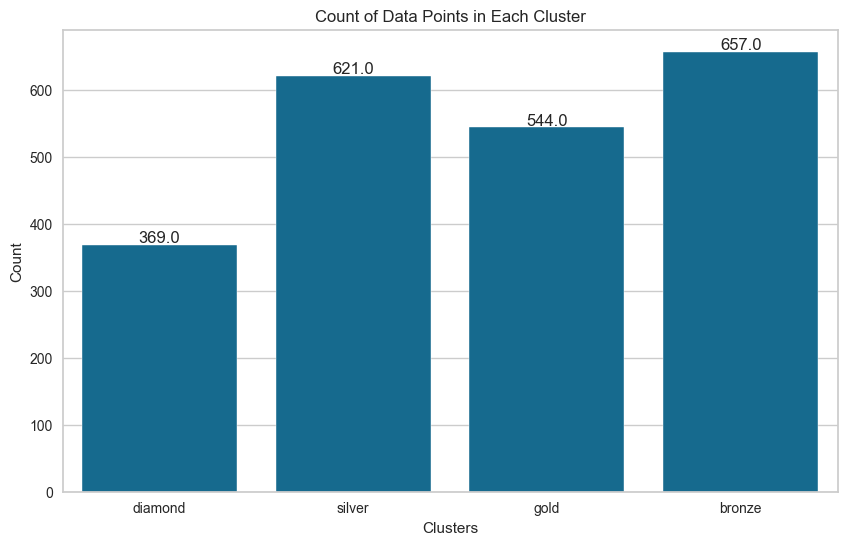

In [1646]:
# Plotting countplot for original clusters
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='clusters', data=eval_df)
# Adding annotations
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.title('Count of Data Points in Each Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.show()

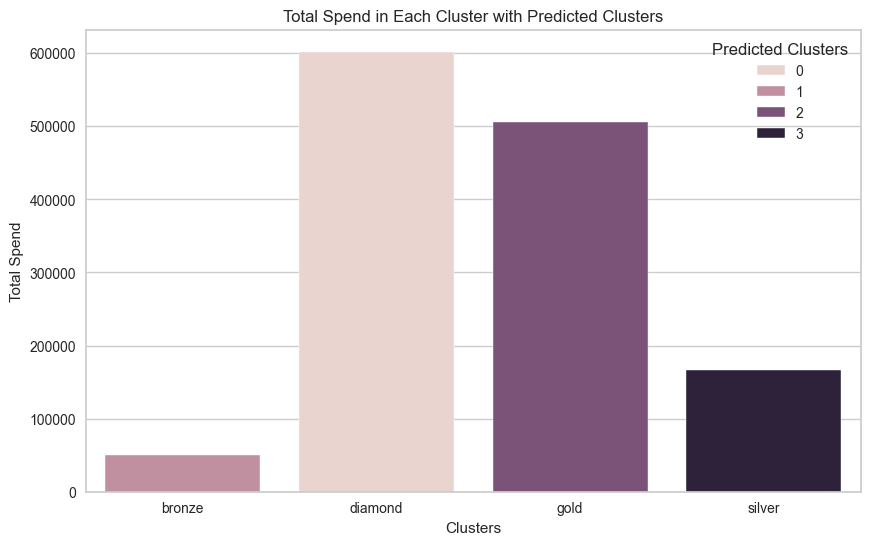

In [1647]:
# Aggregating total spend per cluster
aggregated_data = eval_df.groupby(['clusters', 'predicted_clusters'])['total_spend'].sum().reset_index()

# Plotting bar plot for total spend per cluster
plt.figure(figsize=(10, 6))
sns.barplot(x='clusters', y='total_spend', hue='predicted_clusters', data=aggregated_data)
plt.title('Total Spend in Each Cluster with Predicted Clusters')
plt.xlabel('Clusters')
plt.ylabel('Total Spend')
plt.legend(title='Predicted Clusters')
plt.show()

In [1648]:
silver_df[['age']].describe()

,age
count,621
mean,47.03
std,10.88
min,22
25%,39
50%,46
75%,56
max,74


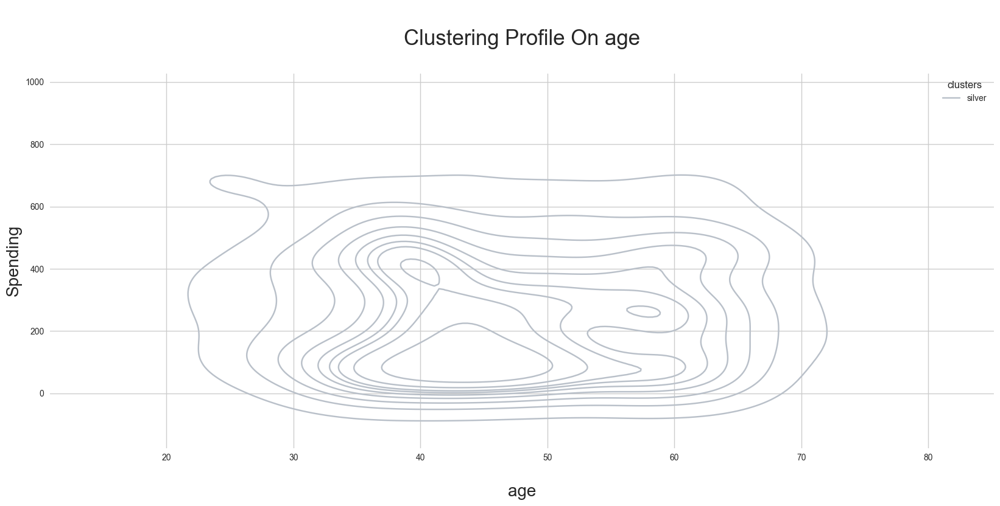

In [1649]:
cluster(silver_df,'age')

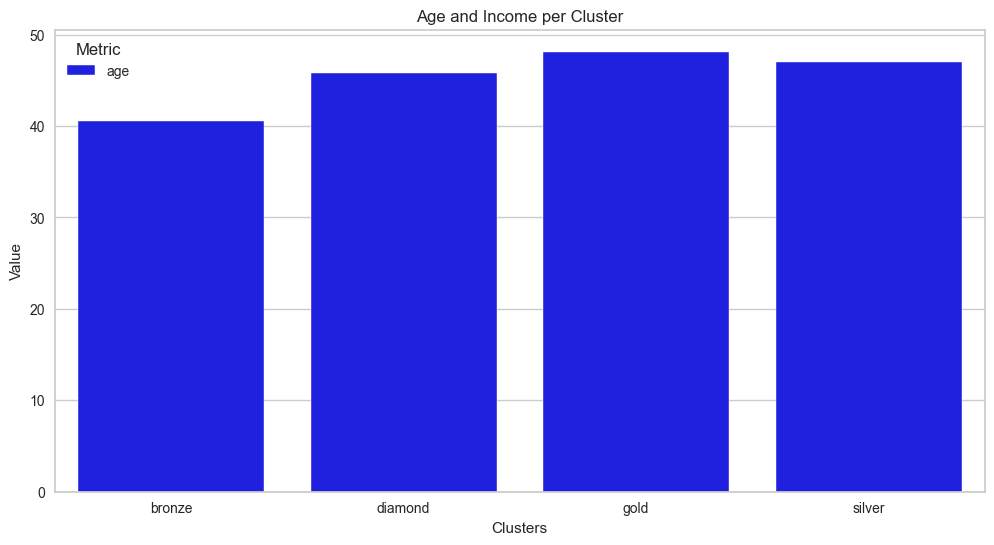

In [1650]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'age': 'mean'
    
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['age'], var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data, palette={'age': 'blue', 'income': 'green'})
plt.title('Age and Income per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric')
plt.show()

In [1651]:
silver_df.income_class.unique()

['Medium', 'High', 'Low']
Categories (4, object): ['Low' < 'Medium' < 'High' < 'Very High']

In [1652]:
silver_df.income_class.value_counts()

income_class
Medium       572
High          47
Low            2
Very High      0
Name: count, dtype: int64

In [1653]:
silver_df.income_class.value_counts(normalize=True)

income_class
Medium      0.92
High        0.08
Low         0.00
Very High      0
Name: proportion, dtype: float64

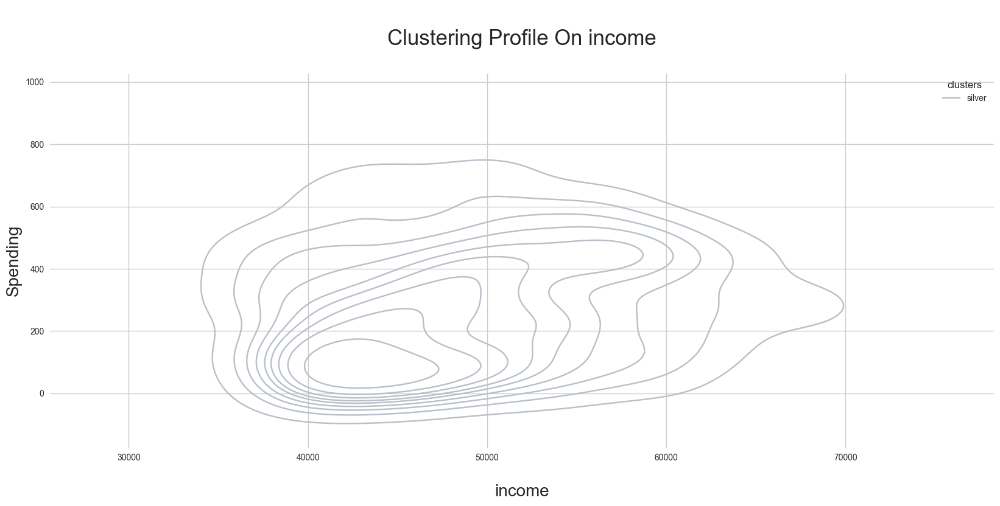

In [1654]:
cluster(silver_df,'income')

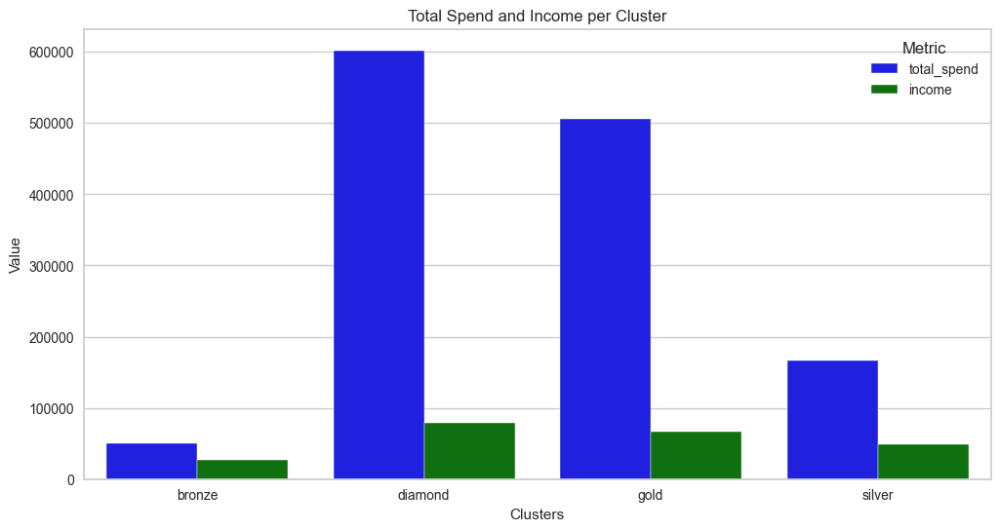

In [1655]:
# Aggregating total spend and income per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'total_spend': 'sum',
    'income': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = aggregated_data.melt(id_vars='clusters', value_vars=['total_spend', 'income'], var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data, palette={'total_spend': 'blue', 'income': 'green'})
plt.title('Total Spend and Income per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric')
plt.show()

In [1656]:
silver_df.mnt_gold_prods.value_counts()

mnt_gold_prods
4     28
3     23
6     22
0     21
1     20
      ..
96     1
53     1
33     1
57     1
62     1
Name: count, Length: 114, dtype: int64

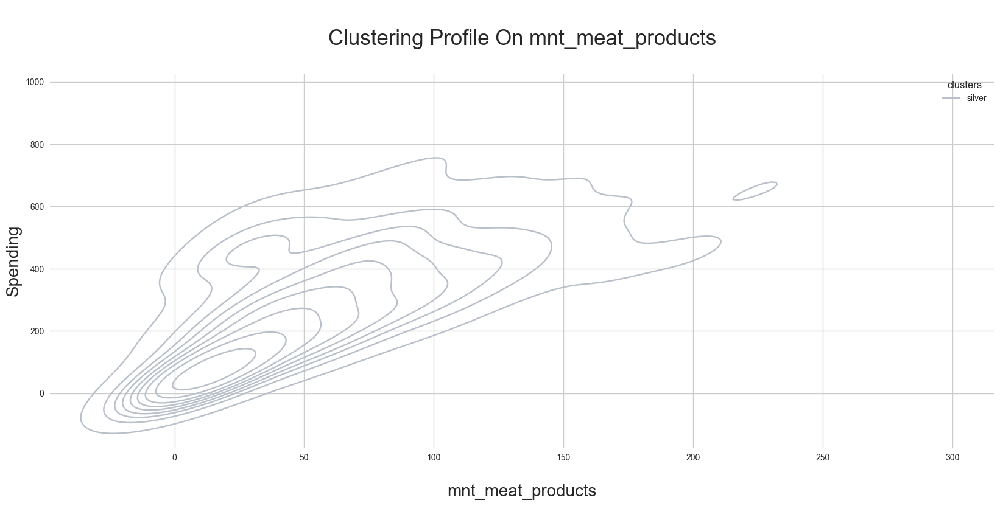

In [1657]:
cluster(silver_df,'mnt_meat_products')

In [1658]:
silver_df.mnt_wines.value_counts()

mnt_wines
112    8
29     8
14     8
19     7
46     7
      ..
223    1
400    1
66     1
393    1
302    1
Name: count, Length: 288, dtype: int64

In [1659]:
silver_df.total_purchases.value_counts()

total_purchases
7     52
12    48
16    45
17    42
15    40
5     36
8     36
9     31
10    31
4     27
13    27
14    27
11    27
18    26
6     26
19    24
20    22
21    17
22    11
23     9
24     8
26     3
25     3
29     2
27     1
Name: count, dtype: int64

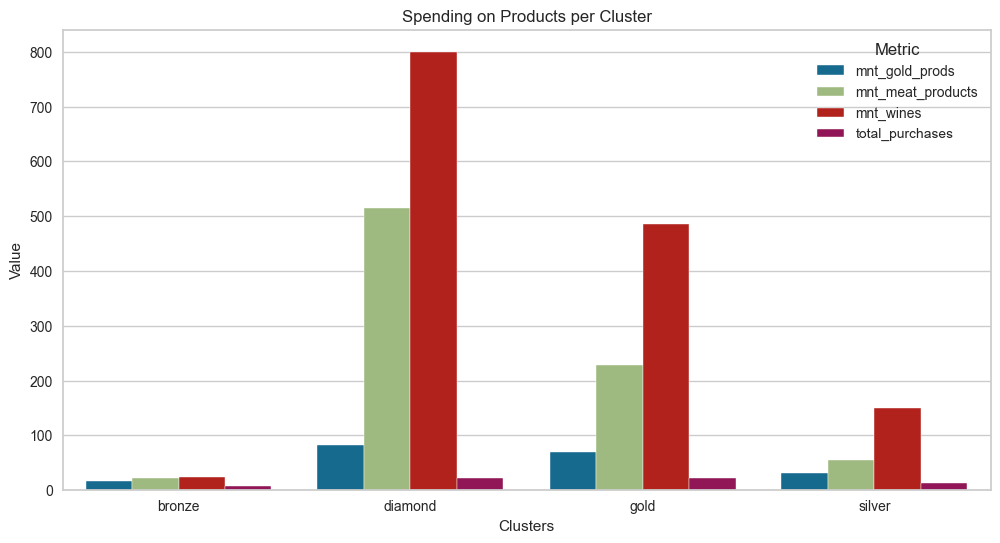

In [1660]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'mnt_gold_prods': 'mean',
    'mnt_meat_products': 'mean',
    'mnt_wines': 'mean',
    'total_purchases': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['mnt_gold_prods', 'mnt_meat_products', 'mnt_wines', 'total_purchases'],
                      var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data)
plt.title('Spending on Products per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric', loc='upper right')
plt.show()


In [1661]:
silver_df.columns

Index(['education', 'marital_status', 'income', 'kidhome', 'teenhome',
       'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products',
       'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods',
       'num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases',
       'num_store_purchases', 'num_web_visits_month', 'age', 'dt_days', 'kids',
       'family_size', 'total_spend', 'accepted_camps', 'total_purchases',
       'predicted_clusters', 'response', 'camp1', 'camp2', 'camp3', 'camp4',
       'camp5', 'income_class', 'clusters', 'spend_class'],
      dtype='object')

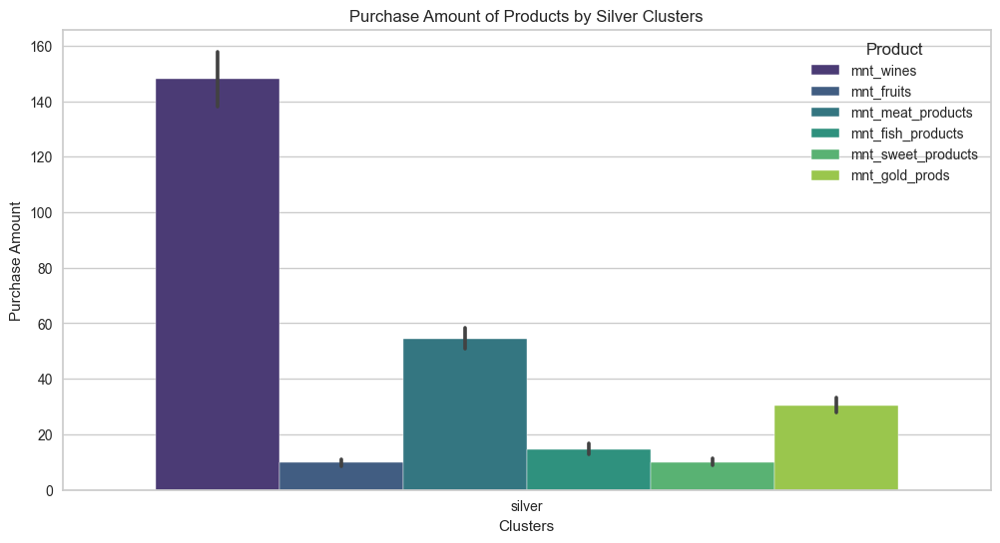

In [1662]:
# Subset the data for product columns only
products_columns = ['mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods']
silver_df_products = silver_df[['clusters'] + products_columns]

# Reshape the data for plotting
df_melted = pd.melt(silver_df_products, id_vars='clusters', var_name='Product', value_name='Purchase_Amount')

# Plotting the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Purchase_Amount', hue='Product', data=df_melted, palette='viridis')

# Set the title and labels
plt.title('Purchase Amount of Products by Silver Clusters')
plt.xlabel('Clusters')
plt.ylabel('Purchase Amount')
plt.legend(title='Product')

# Show the plot
plt.show()

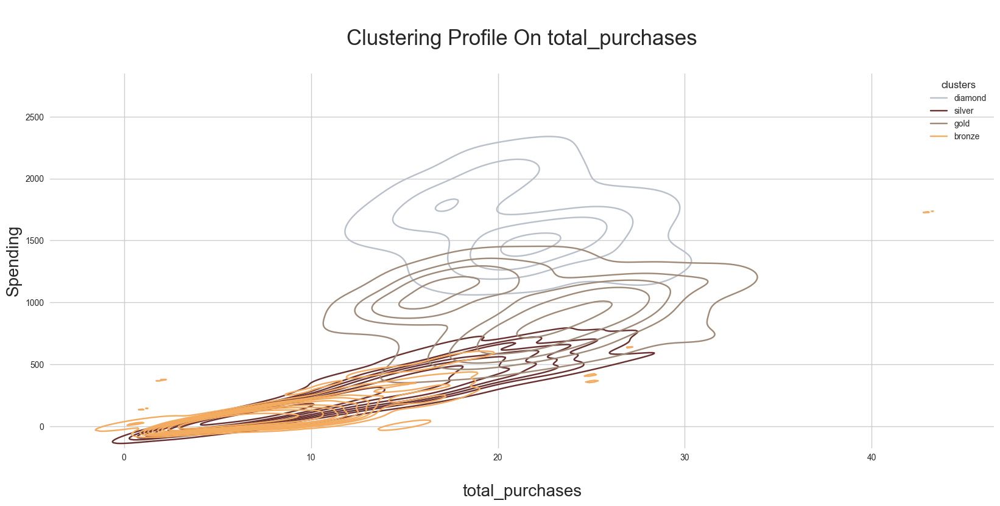

In [1663]:
cluster(eval_df,'total_purchases')

In [1664]:
silver_df.total_spend.value_counts()

total_spend
46     7
63     6
92     6
42     5
68     5
      ..
361    1
578    1
64     1
491    1
172    1
Name: count, Length: 363, dtype: int64

In [1665]:
silver_df.spend_class.value_counts()

spend_class
Medium       331
High         176
Low          114
Very High      0
Name: count, dtype: int64

In [1666]:
silver_df.kidhome.value_counts()

kidhome
0    358
1    255
2      8
Name: count, dtype: int64

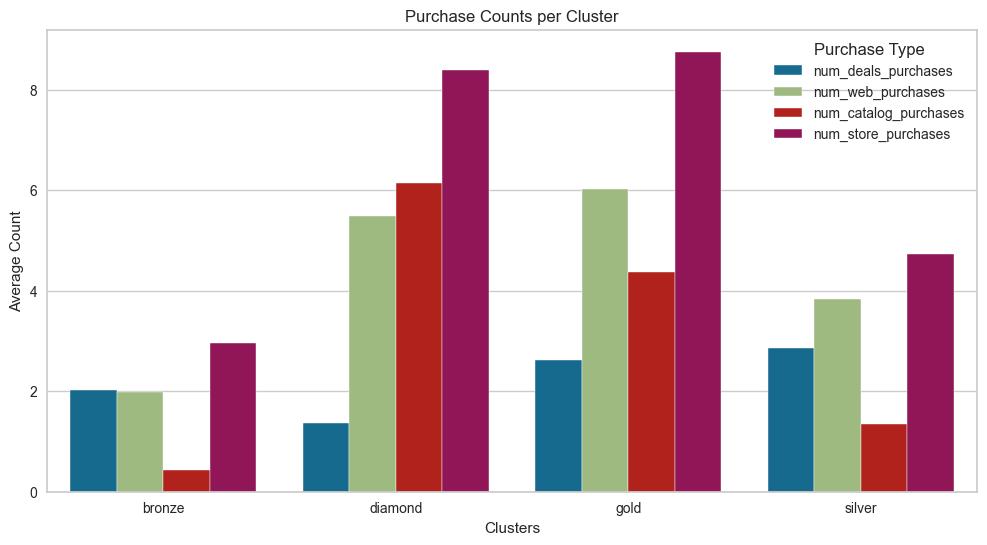

In [1667]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'num_deals_purchases': 'mean',
    'num_web_purchases': 'mean',
    'num_catalog_purchases': 'mean',
    'num_store_purchases': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases', 'num_store_purchases'],
                      var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data)
plt.title('Purchase Counts per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Average Count')
plt.legend(title='Purchase Type', loc='upper right')
plt.show()

In [1668]:
silver_df.education.value_counts()

education
Post Graduate     620
Under Graduate      1
Name: count, dtype: int64

In [1669]:
silver_df.education.value_counts(normalize=True)

education
Post Graduate    1.00
Under Graduate   0.00
Name: proportion, dtype: float64

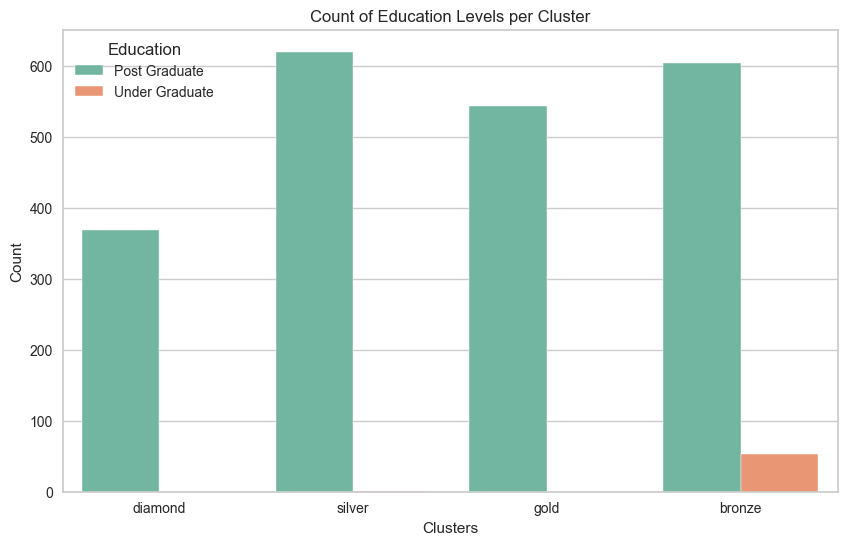

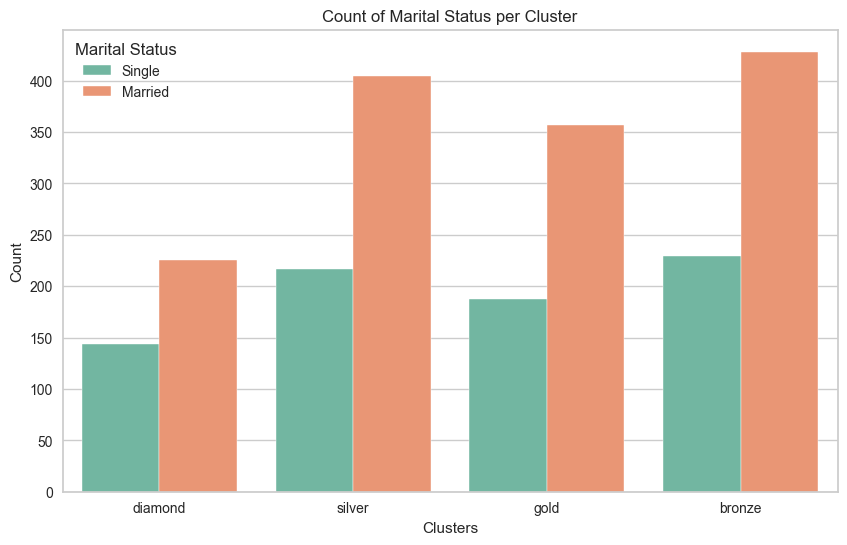

In [1670]:
# Plotting countplot for education
plt.figure(figsize=(10, 6))
sns.countplot(x='clusters', hue='education', data=eval_df, palette='Set2')
plt.title('Count of Education Levels per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.legend(title='Education')
plt.show()

# Plotting countplot for marital_status
plt.figure(figsize=(10, 6))
sns.countplot(x='clusters', hue='marital_status', data=eval_df, palette='Set2')
plt.title('Count of Marital Status per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.legend(title='Marital Status')
plt.show()

In [1671]:
silver_df_camp = silver_df[['camp1','camp2','camp3','camp4','camp5']]

In [1672]:
silver_df_camp

,camp1,camp2,camp3,camp4,camp5
1,0,0,0,0,0
4,0,0,0,0,0
6,0,0,0,0,0
12,0,0,0,0,0
15,1,0,0,0,1
...,...,...,...,...,...
2174,1,0,0,1,0
2175,1,0,0,0,1
2182,0,0,0,0,0
2190,0,0,0,0,0


In [1673]:
# Melt the DataFrame to have a long format for easier plotting
df_melted = silver_df_camp.melt(var_name='Campaign', value_name='Accepted')

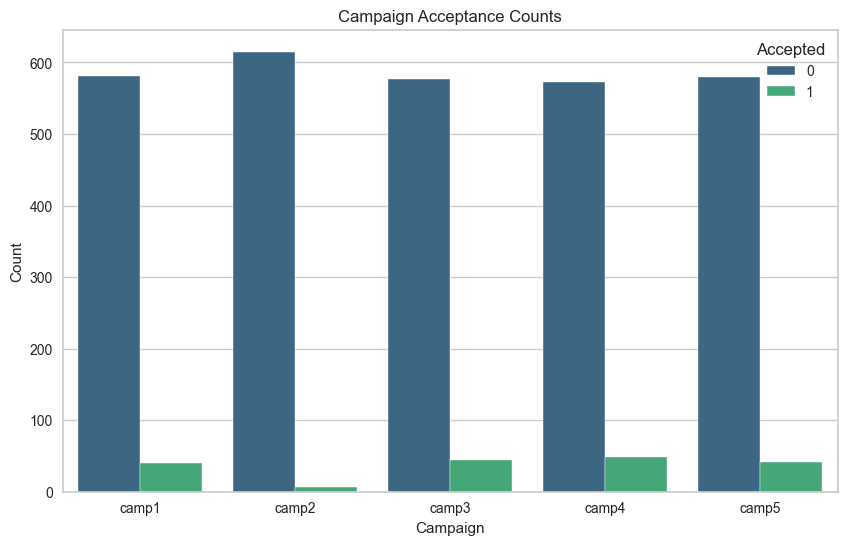

In [1674]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Draw the bar plot
sns.countplot(data=df_melted, x='Campaign', hue='Accepted', palette='viridis')

# Set the title and labels
plt.title('Campaign Acceptance Counts')
plt.xlabel('Campaign')
plt.ylabel('Count')

# Show the plot
plt.show()


## Evaluation

<div style="background-color: #f0f0f0; padding: 10px; margin-top: 10px;">
 <strong>Key Points:</strong><br>
 - Silver class: 28% of customers. 2nd highest rate<br>
 - Medium -Low spending compared to other classes but higher than bronze<br>
 - 92 percent of them have medium income level and the rest have high income level<br>
 -Majority have medium income<br>
 - It has the 2nd highest average age<br>
 - Medium purchases in meat gold and wine compared to other classes. But in their own shopping, they mostly bought meat and wine.<br>
 - They shopped mostly from stores 2. on the web<br>
 - ohne 1 customer all of them are post graduates and has the high marriage rate.<br>
 - Campaigns 1, 3, 4 and 5 were accepted at almost equal rates.<br>

</div>

### gold cluster

In [1675]:
gold_df = eval_df[eval_df['clusters'] == 'gold']

In [1676]:
gold_df

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,predicted_clusters,response,camp1,camp2,camp3,camp4,camp5,income_class,clusters,spend_class
2,Post Graduate,Married,71613,0,0,26,426,49,127,111,...,2,0,0,0,0,0,0,High,gold,High
5,Post Graduate,Married,62513,0,1,16,520,42,98,0,...,2,0,0,0,0,0,0,High,gold,High
11,Post Graduate,Single,63033,0,0,82,194,61,480,225,...,2,0,0,0,0,0,0,High,gold,Very High
21,Post Graduate,Married,58607,1,0,63,867,0,86,0,...,2,0,0,0,0,0,0,Medium,gold,High
22,Post Graduate,Married,65324,0,1,0,384,0,102,21,...,2,0,0,0,0,1,0,High,gold,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2183,Post Graduate,Married,"42,623.50",1,0,53,32,2,1607,12,...,2,0,0,0,0,0,0,Medium,gold,Very High
2186,Post Graduate,Single,44802,0,1,71,853,10,143,13,...,2,0,0,0,0,1,0,Medium,gold,Very High
2189,Post Graduate,Married,61223,1,0,46,709,43,182,42,...,2,0,0,0,0,0,0,High,gold,Very High
2191,Post Graduate,Single,56981,1,1,91,908,48,217,32,...,2,0,0,0,0,0,0,Medium,gold,Very High


In [1677]:
gold_df[['age']].describe()

,age
count,544
mean,48.12
std,11.24
min,19
25%,39.75
50%,48
75%,57
max,71


In [1678]:
eval_df['clusters'].value_counts(normalize=True)

clusters
bronze    0.30
silver    0.28
gold      0.25
diamond   0.17
Name: proportion, dtype: float64

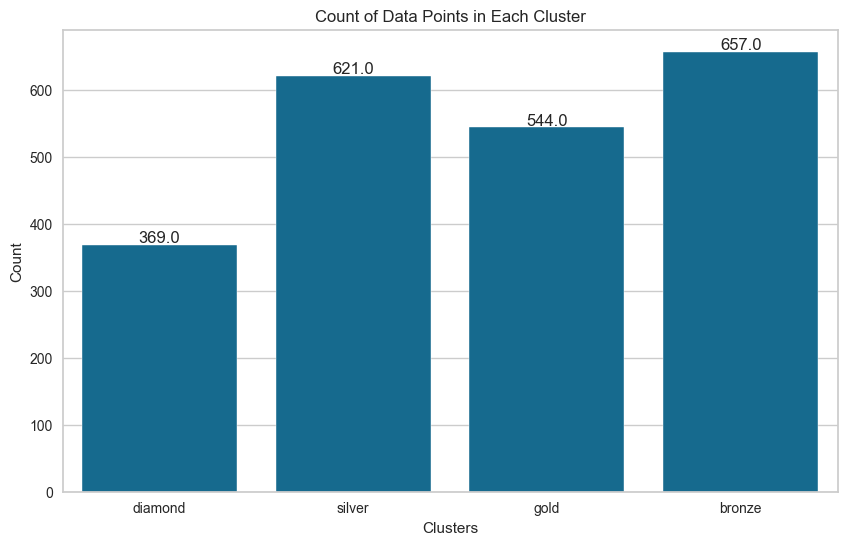

In [1679]:
# Plotting countplot for original clusters
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='clusters', data=eval_df)
# Adding annotations
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.title('Count of Data Points in Each Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.show()

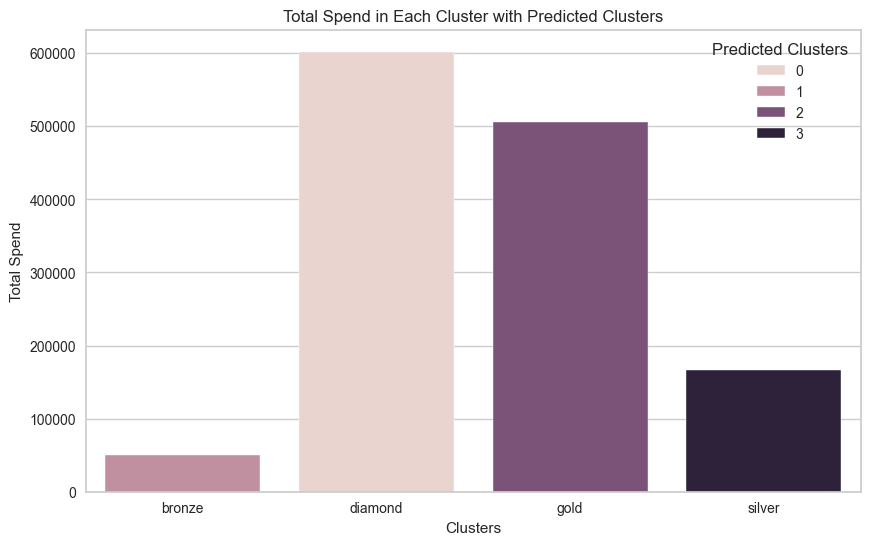

In [1680]:
# Aggregating total spend per cluster
aggregated_data = eval_df.groupby(['clusters', 'predicted_clusters'])['total_spend'].sum().reset_index()

# Plotting bar plot for total spend per cluster
plt.figure(figsize=(10, 6))
sns.barplot(x='clusters', y='total_spend', hue='predicted_clusters', data=aggregated_data)
plt.title('Total Spend in Each Cluster with Predicted Clusters')
plt.xlabel('Clusters')
plt.ylabel('Total Spend')
plt.legend(title='Predicted Clusters')
plt.show()

In [1681]:
gold_df[['age']].describe()

,age
count,544
mean,48.12
std,11.24
min,19
25%,39.75
50%,48
75%,57
max,71


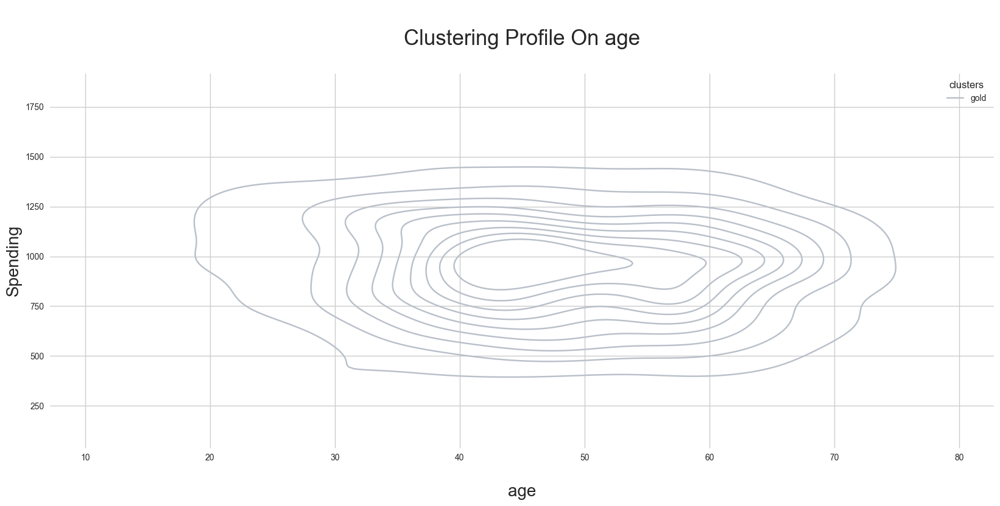

In [1682]:
cluster(gold_df,'age')

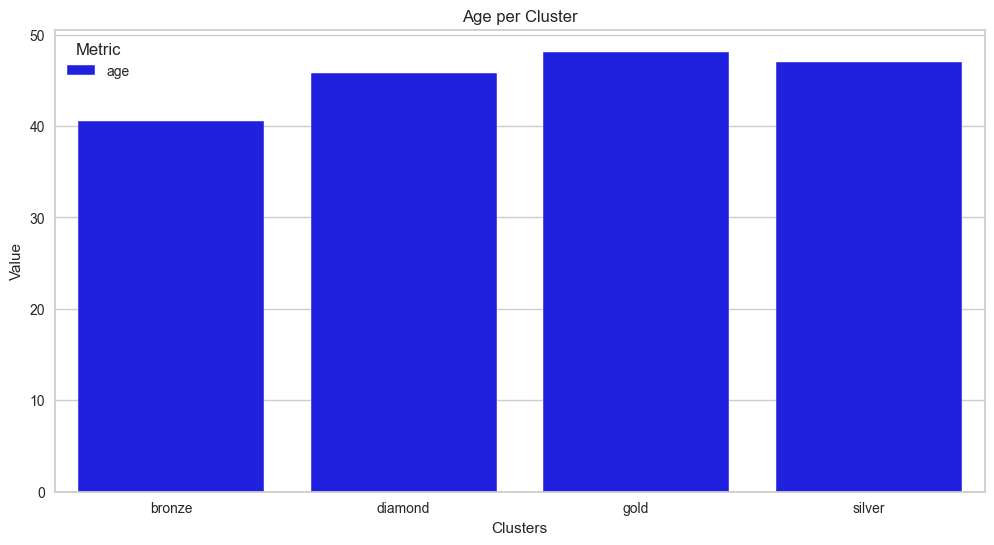

In [1683]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'age': 'mean'
    
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['age'], var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data, palette={'age': 'blue', 'income': 'green'})
plt.title('Age per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric')
plt.show()

In [1684]:
gold_df.income_class.unique()

['High', 'Medium', 'Very High']
Categories (4, object): ['Low' < 'Medium' < 'High' < 'Very High']

In [1685]:
gold_df.income_class.value_counts()

income_class
High         383
Medium       134
Very High     27
Low            0
Name: count, dtype: int64

In [1686]:
gold_df.income_class.value_counts(normalize=True)

income_class
High        0.70
Medium      0.25
Very High   0.05
Low            0
Name: proportion, dtype: float64

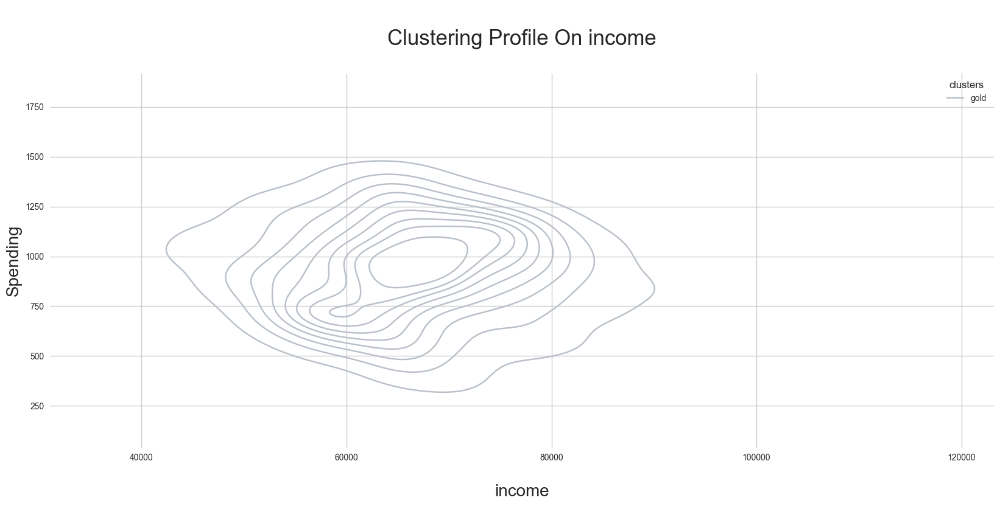

In [1687]:
cluster(gold_df,'income')

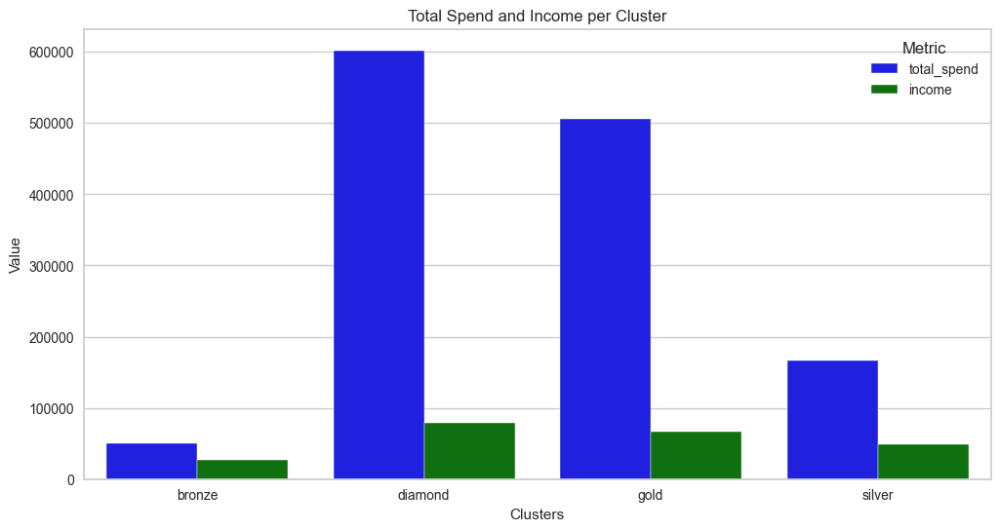

In [1688]:
# Aggregating total spend and income per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'total_spend': 'sum',
    'income': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = aggregated_data.melt(id_vars='clusters', value_vars=['total_spend', 'income'], var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data, palette={'total_spend': 'blue', 'income': 'green'})
plt.title('Total Spend and Income per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric')
plt.show()

In [1689]:
gold_df.mnt_gold_prods.value_counts()

mnt_gold_prods
54     17
12     12
30     11
26     10
35     10
       ..
84      1
132     1
51      1
119     1
247     1
Name: count, Length: 167, dtype: int64

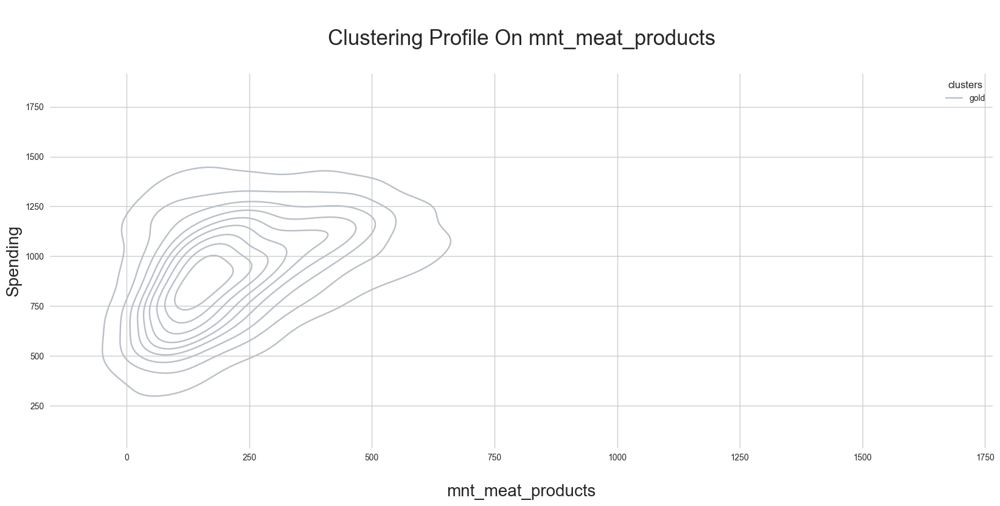

In [1690]:
cluster(gold_df,'mnt_meat_products')

In [1691]:
gold_df.mnt_wines.value_counts()

mnt_wines
620    5
520    5
398    5
412    4
371    4
      ..
376    1
547    1
374    1
852    1
428    1
Name: count, Length: 374, dtype: int64

In [1692]:
gold_df.total_purchases.value_counts()

total_purchases
23    52
26    43
22    42
21    41
17    41
25    39
19    38
20    37
16    32
24    29
28    23
27    23
18    22
15    18
14    15
32    10
31     9
29     9
13     7
30     5
12     2
33     2
11     2
39     1
10     1
1      1
Name: count, dtype: int64

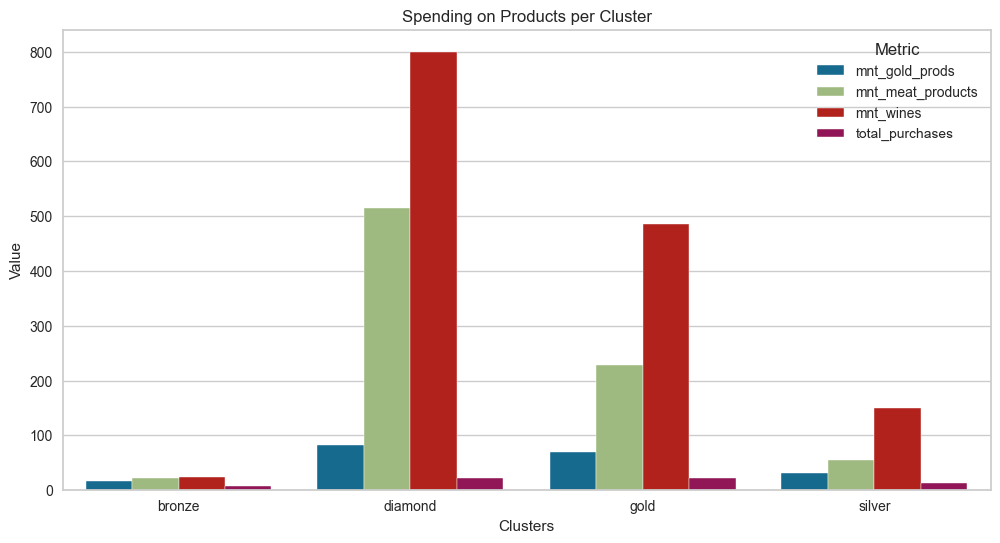

In [1693]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'mnt_gold_prods': 'mean',
    'mnt_meat_products': 'mean',
    'mnt_wines': 'mean',
    'total_purchases': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['mnt_gold_prods', 'mnt_meat_products', 'mnt_wines', 'total_purchases'],
                      var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data)
plt.title('Spending on Products per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric', loc='upper right')
plt.show()


In [1694]:
gold_df.columns

Index(['education', 'marital_status', 'income', 'kidhome', 'teenhome',
       'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products',
       'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods',
       'num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases',
       'num_store_purchases', 'num_web_visits_month', 'age', 'dt_days', 'kids',
       'family_size', 'total_spend', 'accepted_camps', 'total_purchases',
       'predicted_clusters', 'response', 'camp1', 'camp2', 'camp3', 'camp4',
       'camp5', 'income_class', 'clusters', 'spend_class'],
      dtype='object')

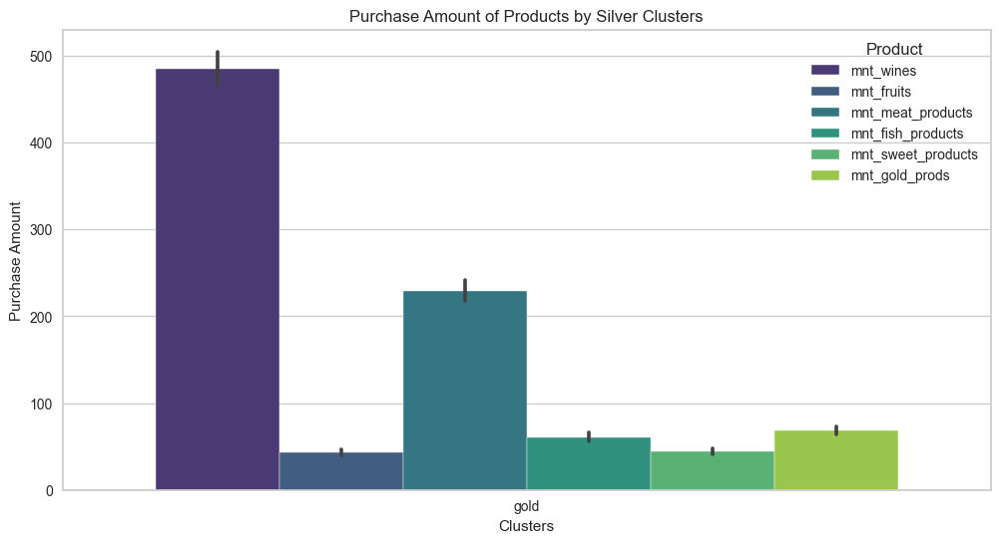

In [1695]:
# Subset the data for product columns only
products_columns = ['mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods']
gold_df_products = gold_df[['clusters'] + products_columns]

# Reshape the data for plotting
df_melted = pd.melt(gold_df_products, id_vars='clusters', var_name='Product', value_name='Purchase_Amount')

# Plotting the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Purchase_Amount', hue='Product', data=df_melted, palette='viridis')

# Set the title and labels
plt.title('Purchase Amount of Products by Silver Clusters')
plt.xlabel('Clusters')
plt.ylabel('Purchase Amount')
plt.legend(title='Product')

# Show the plot
plt.show()

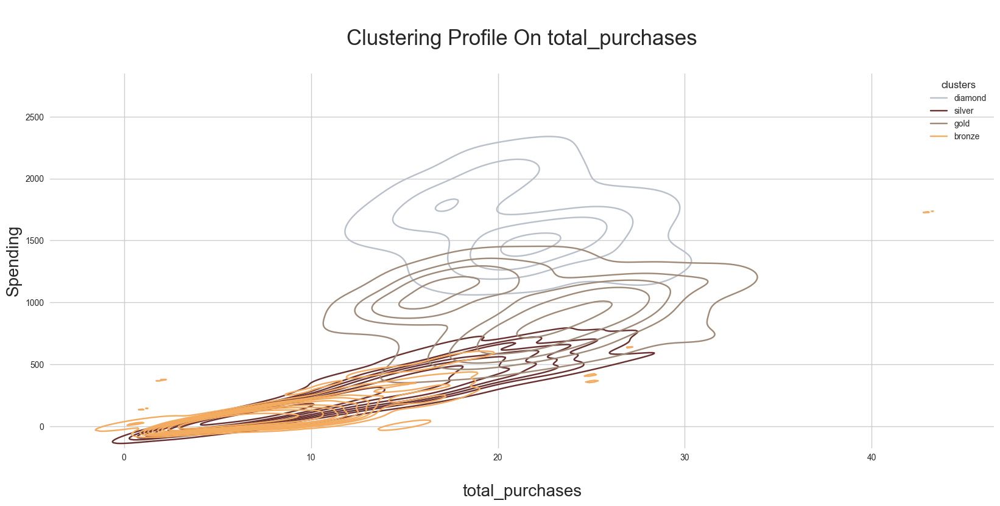

In [1696]:
cluster(eval_df,'total_purchases')

In [1697]:
gold_df.total_spend.value_counts()

total_spend
928     5
976     5
902     5
981     4
1001    4
       ..
1345    1
764     1
727     1
716     1
843     1
Name: count, Length: 381, dtype: int64

In [1698]:
gold_df.spend_class.value_counts()

spend_class
High         363
Very High    178
Medium         3
Low            0
Name: count, dtype: int64

In [1699]:
gold_df.kidhome.value_counts()

kidhome
0    325
1    205
2     14
Name: count, dtype: int64

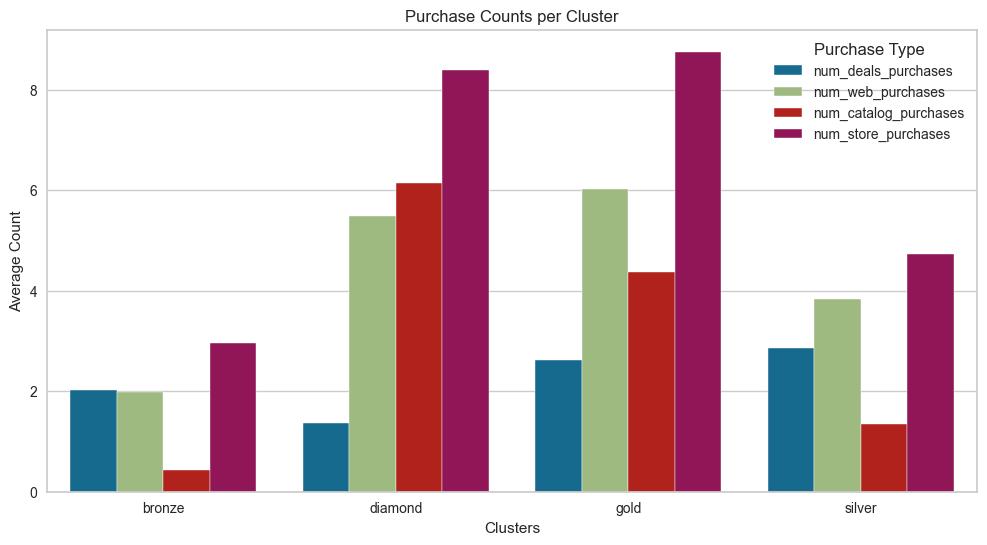

In [1700]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'num_deals_purchases': 'mean',
    'num_web_purchases': 'mean',
    'num_catalog_purchases': 'mean',
    'num_store_purchases': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases', 'num_store_purchases'],
                      var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data)
plt.title('Purchase Counts per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Average Count')
plt.legend(title='Purchase Type', loc='upper right')
plt.show()

In [1701]:
gold_df.education.value_counts()

education
Post Graduate    544
Name: count, dtype: int64

In [1702]:
gold_df.education.value_counts(normalize=True)

education
Post Graduate   1
Name: proportion, dtype: float64

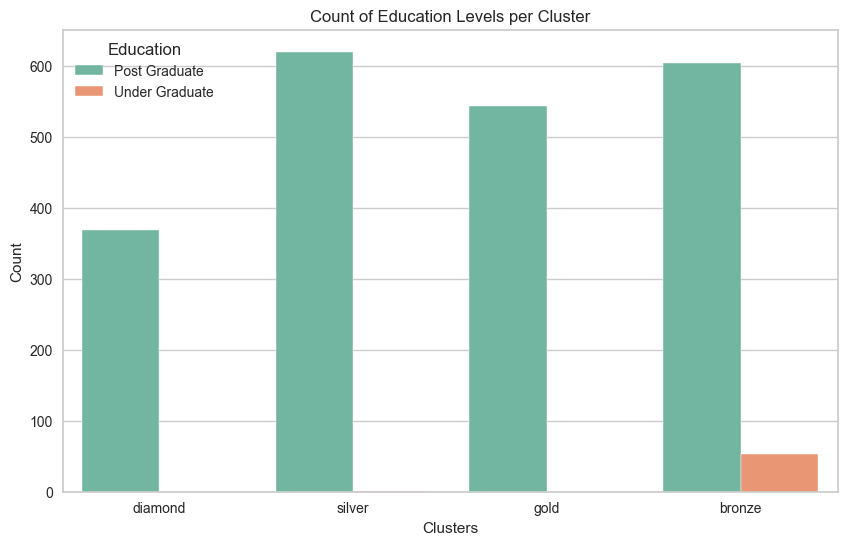

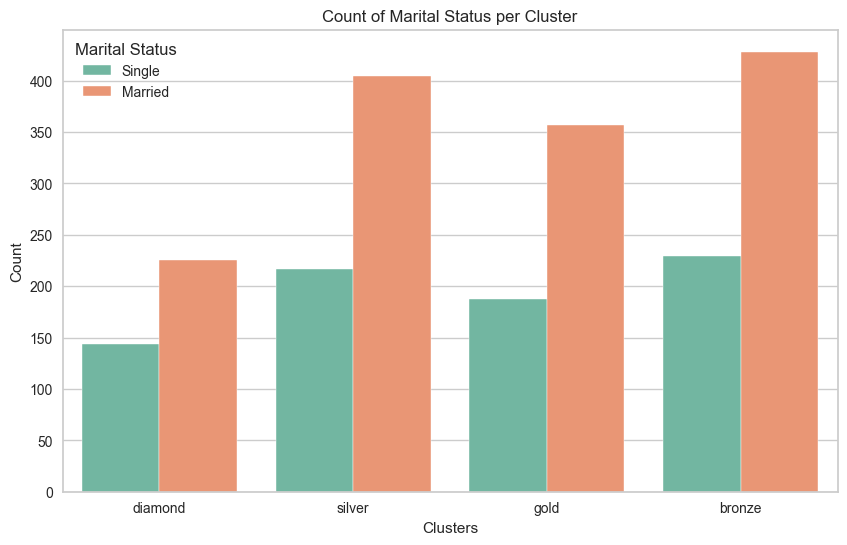

In [1703]:
# Plotting countplot for education
plt.figure(figsize=(10, 6))
sns.countplot(x='clusters', hue='education', data=eval_df, palette='Set2')
plt.title('Count of Education Levels per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.legend(title='Education')
plt.show()

# Plotting countplot for marital_status
plt.figure(figsize=(10, 6))
sns.countplot(x='clusters', hue='marital_status', data=eval_df, palette='Set2')
plt.title('Count of Marital Status per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.legend(title='Marital Status')
plt.show()

In [1704]:
gold_df_camp = gold_df[['camp1','camp2','camp3','camp4','camp5']]

In [1705]:
gold_df_camp

,camp1,camp2,camp3,camp4,camp5
2,0,0,0,0,0
5,0,0,0,0,0
11,0,0,0,0,0
21,0,0,0,0,0
22,0,0,0,1,0
...,...,...,...,...,...
2183,0,0,0,0,0
2186,0,0,0,1,0
2189,0,0,0,0,0
2191,0,0,0,0,0


In [1706]:
# Melt the DataFrame to have a long format for easier plotting
df_melted = gold_df_camp.melt(var_name='Campaign', value_name='Accepted')

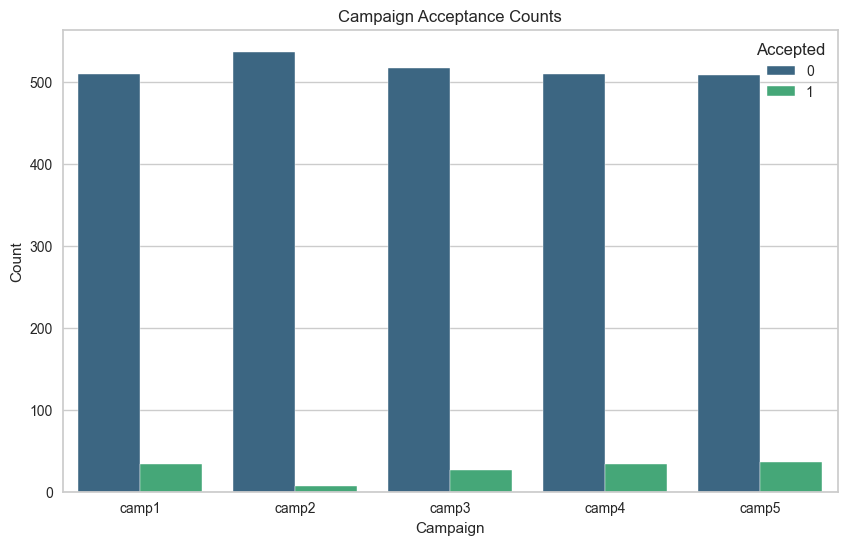

In [1707]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Draw the bar plot
sns.countplot(data=df_melted, x='Campaign', hue='Accepted', palette='viridis')

# Set the title and labels
plt.title('Campaign Acceptance Counts')
plt.xlabel('Campaign')
plt.ylabel('Count')

# Show the plot
plt.show()


## Evaluation

<div style="background-color: #f0f0f0; padding: 10px; margin-top: 10px;">
 <strong>Key Points:</strong><br>
 - Gold class: 25% of customers. 3. high rate<br>
 - High spending compared to other classes. 2nd highest.<br>
 - 92 percent of them have medium income level and the rest have high income level<br>
 - Majority have high income<br>
 - The class with the highest average age<br>
 - 2nd highest purchases in meat gold and wine compared to other classes. The most of his own expenses were purchased from meat and wine.<br>
 - They shopped mostly from stores 2. on the web<br>
 - all of them are post graduates and the marriage rate is low compared to others.<br>
 - Campaigns 1, 3, 4 and 5 were accepted at almost equal rates.<br>

</div>

### diamond cluster

In [1708]:
diamond_df = eval_df[eval_df['clusters'] == 'diamond']

In [1709]:
diamond_df

,education,marital_status,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,...,predicted_clusters,response,camp1,camp2,camp3,camp4,camp5,income_class,clusters,spend_class
0,Post Graduate,Single,58138,0,0,58,635,88,546,172,...,0,1,0,0,0,0,0,Medium,diamond,Very High
14,Post Graduate,Single,82800,0,0,23,1006,22,115,59,...,0,0,0,0,0,0,0,Very High,diamond,Very High
17,Post Graduate,Married,76995,0,0,91,1012,80,498,0,...,0,0,0,0,0,0,0,High,diamond,Very High
28,Post Graduate,Married,84618,1,0,96,684,100,801,21,...,0,0,0,0,0,0,0,Very High,diamond,Very High
39,Post Graduate,Married,80011,0,0,3,421,76,536,82,...,0,1,0,0,1,0,0,Very High,diamond,Very High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2150,Post Graduate,Married,73803,1,1,61,833,80,363,52,...,0,0,0,0,0,0,0,High,diamond,Very High
2166,Post Graduate,Married,88325,0,1,42,519,71,860,93,...,0,0,0,0,0,0,0,Very High,diamond,Very High
2168,Post Graduate,Single,80617,0,0,42,594,51,631,72,...,0,0,1,0,1,0,1,Very High,diamond,Very High
2172,Post Graduate,Single,82032,0,1,54,332,194,377,149,...,0,0,0,0,0,0,0,Very High,diamond,Very High


In [1710]:
diamond_df[['age']].describe()

,age
count,369
mean,45.75
std,13.12
min,19
25%,36
50%,45
75%,56
max,73


In [1711]:
eval_df['clusters'].value_counts(normalize=True)

clusters
bronze    0.30
silver    0.28
gold      0.25
diamond   0.17
Name: proportion, dtype: float64

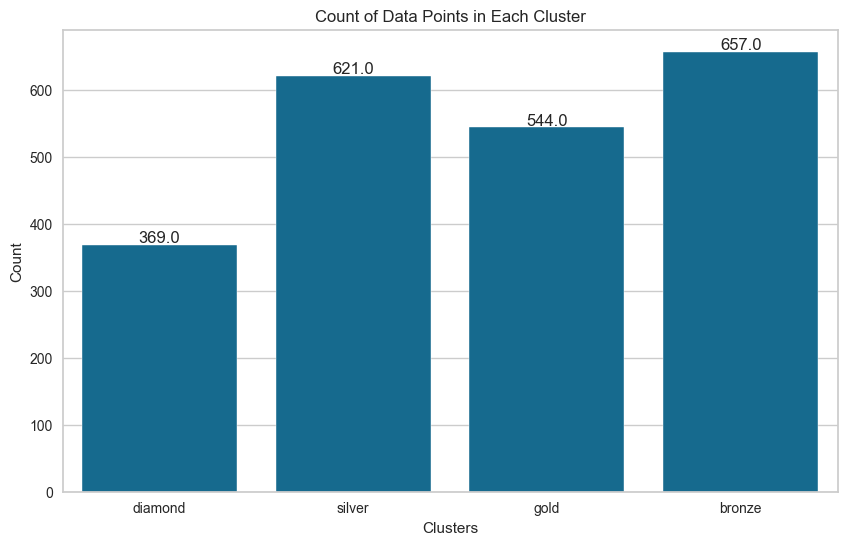

In [1712]:
# Plotting countplot for original clusters
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='clusters', data=eval_df)
# Adding annotations
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.title('Count of Data Points in Each Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.show()

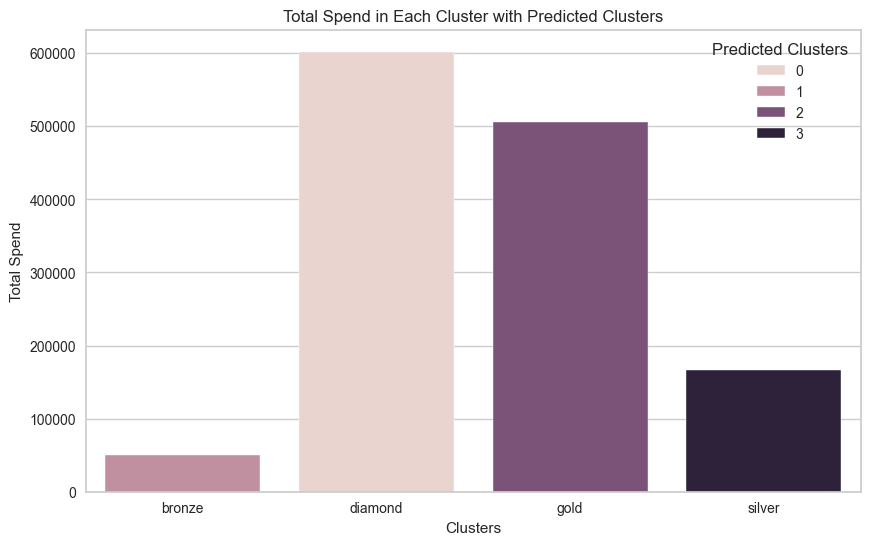

In [1713]:
# Aggregating total spend per cluster
aggregated_data = eval_df.groupby(['clusters', 'predicted_clusters'])['total_spend'].sum().reset_index()

# Plotting bar plot for total spend per cluster
plt.figure(figsize=(10, 6))
sns.barplot(x='clusters', y='total_spend', hue='predicted_clusters', data=aggregated_data)
plt.title('Total Spend in Each Cluster with Predicted Clusters')
plt.xlabel('Clusters')
plt.ylabel('Total Spend')
plt.legend(title='Predicted Clusters')
plt.show()

In [1714]:
diamond_df[['age']].describe()

,age
count,369
mean,45.75
std,13.12
min,19
25%,36
50%,45
75%,56
max,73


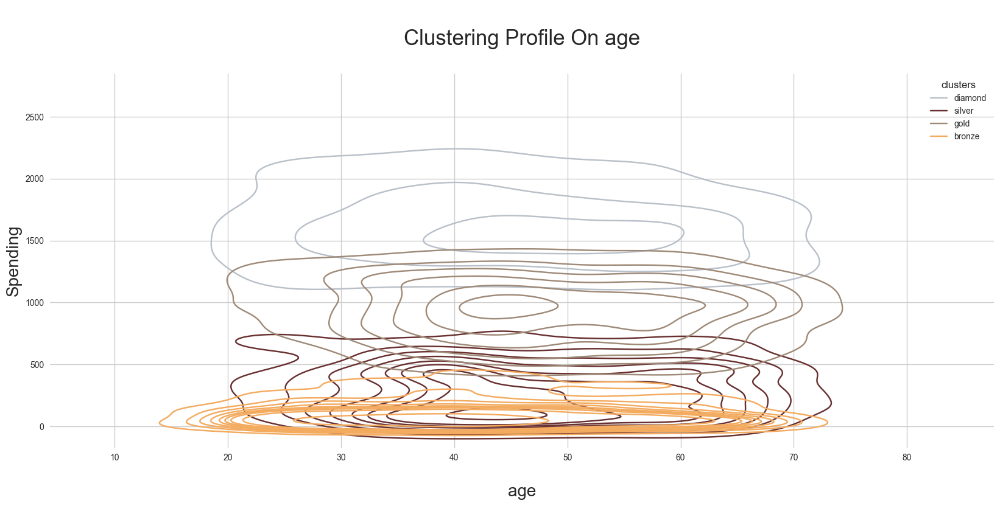

In [1715]:
cluster(eval_df,'age')

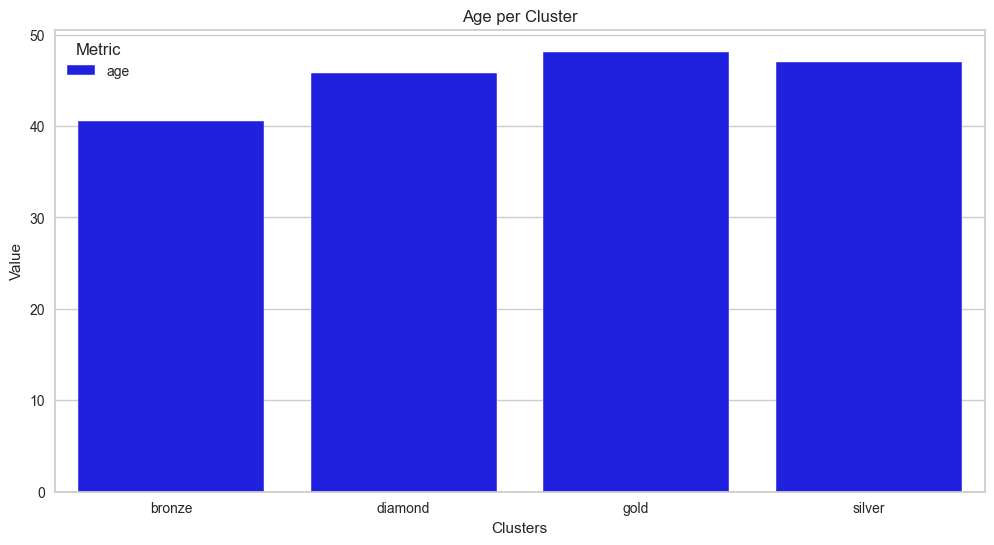

In [1716]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'age': 'mean'
    
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['age'], var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data, palette={'age': 'blue', 'income': 'green'})
plt.title('Age per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric')
plt.show()

In [1717]:
diamond_df.income_class.unique()

['Medium', 'Very High', 'High']
Categories (4, object): ['Low' < 'Medium' < 'High' < 'Very High']

In [1718]:
diamond_df.income_class.value_counts()

income_class
High         192
Very High    175
Medium         2
Low            0
Name: count, dtype: int64

In [1719]:
diamond_df.income_class.value_counts(normalize=True)

income_class
High        0.52
Very High   0.47
Medium      0.01
Low            0
Name: proportion, dtype: float64

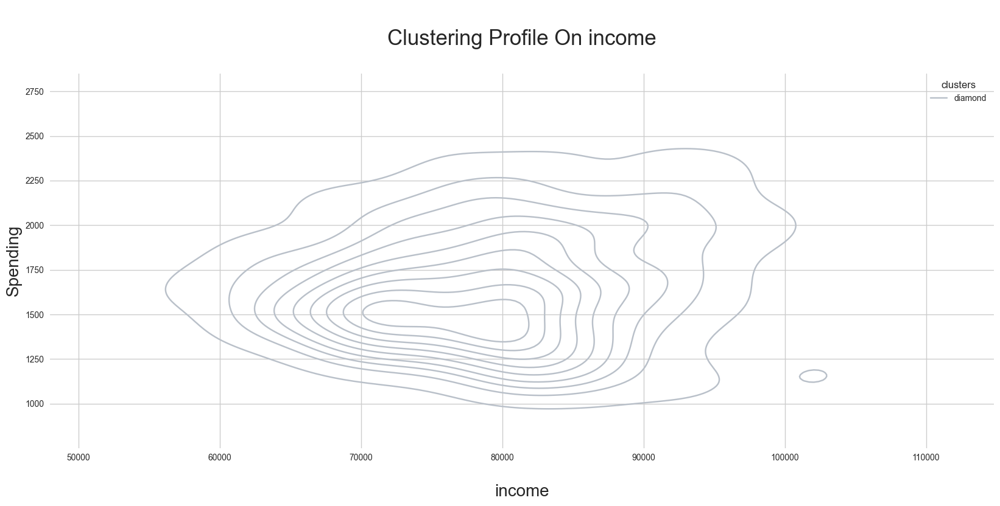

In [1720]:
cluster(diamond_df,'income')

In [1721]:
eval_df[['predicted_clusters','clusters']].value_counts()

predicted_clusters  clusters
1                   bronze      657
3                   silver      621
2                   gold        544
0                   diamond     369
Name: count, dtype: int64

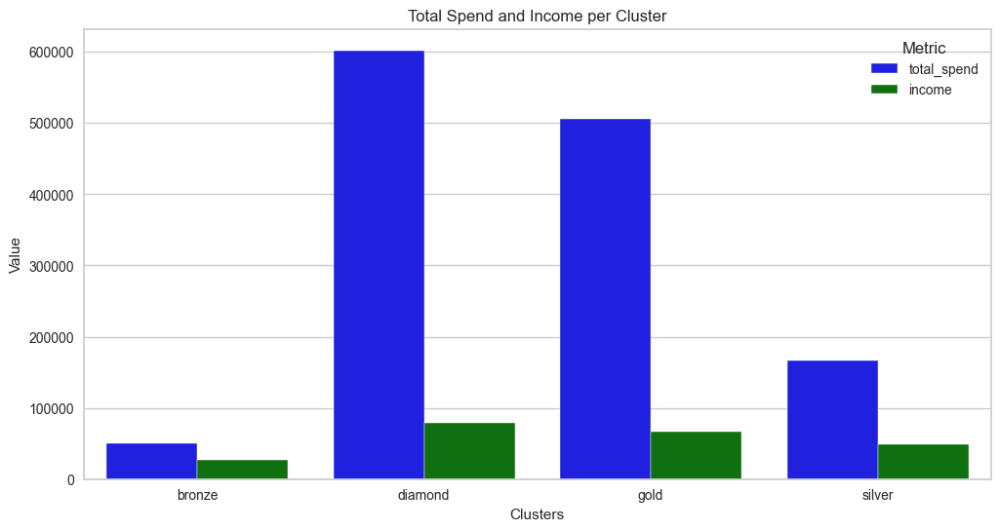

In [1722]:
# Aggregating total spend and income per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'total_spend': 'sum',
    'income': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = aggregated_data.melt(id_vars='clusters', value_vars=['total_spend', 'income'], var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data, palette={'total_spend': 'blue', 'income': 'green'})
plt.title('Total Spend and Income per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric')
plt.show()

In [1723]:
diamond_df.mnt_gold_prods.value_counts()

mnt_gold_prods
0      13
33     11
38     10
80      9
17      9
       ..
118     1
39      1
59      1
54      1
174     1
Name: count, Length: 141, dtype: int64

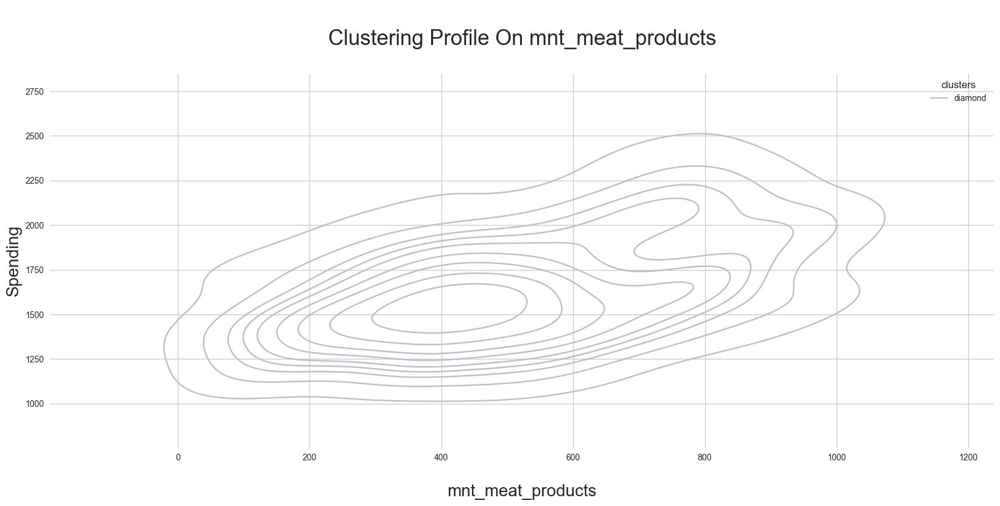

In [1724]:
cluster(diamond_df,'mnt_meat_products')

In [1725]:
diamond_df.mnt_wines.value_counts()

mnt_wines
901     4
483     4
635     3
1000    3
1004    3
       ..
796     1
1206    1
722     1
1023    1
671     1
Name: count, Length: 277, dtype: int64

In [1726]:
diamond_df.total_purchases.value_counts()

total_purchases
22    39
21    37
20    35
19    34
23    26
17    24
18    24
25    22
26    21
24    19
16    16
27    12
15    10
28     9
14     9
29     8
30     6
34     4
13     3
12     3
32     2
11     2
33     2
35     1
10     1
Name: count, dtype: int64

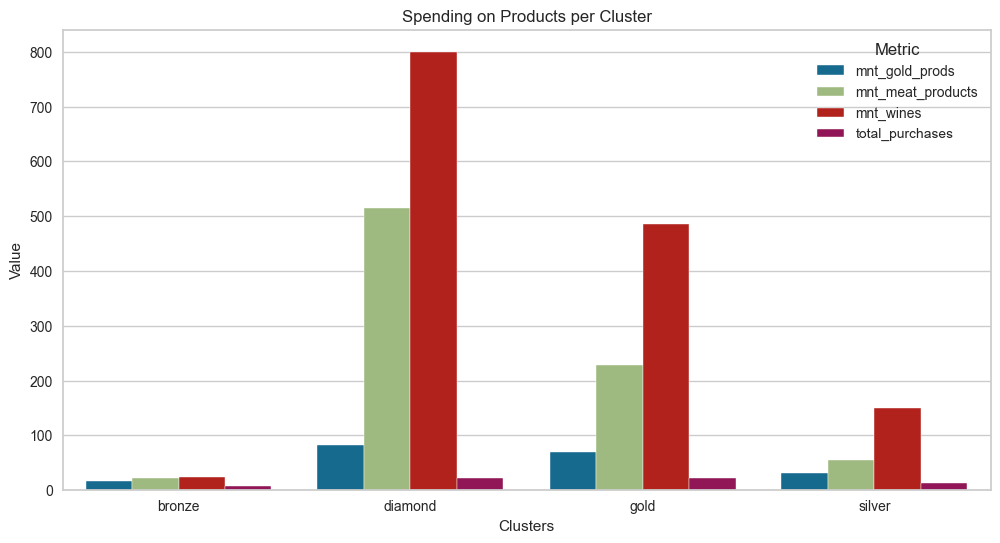

In [1727]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'mnt_gold_prods': 'mean',
    'mnt_meat_products': 'mean',
    'mnt_wines': 'mean',
    'total_purchases': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['mnt_gold_prods', 'mnt_meat_products', 'mnt_wines', 'total_purchases'],
                      var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data)
plt.title('Spending on Products per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Value')
plt.legend(title='Metric', loc='upper right')
plt.show()


In [1728]:
diamond_df.columns

Index(['education', 'marital_status', 'income', 'kidhome', 'teenhome',
       'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products',
       'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods',
       'num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases',
       'num_store_purchases', 'num_web_visits_month', 'age', 'dt_days', 'kids',
       'family_size', 'total_spend', 'accepted_camps', 'total_purchases',
       'predicted_clusters', 'response', 'camp1', 'camp2', 'camp3', 'camp4',
       'camp5', 'income_class', 'clusters', 'spend_class'],
      dtype='object')

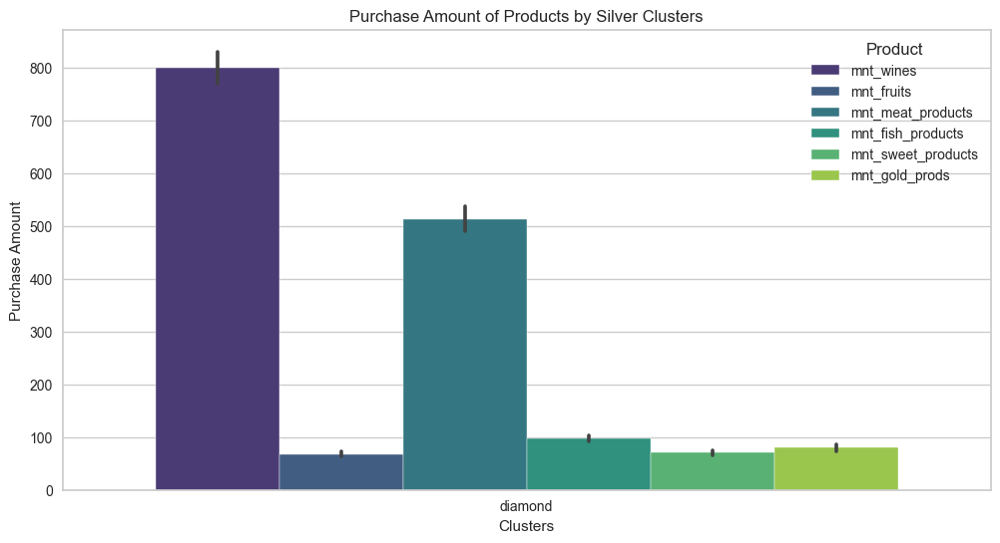

In [1729]:
# Subset the data for product columns only
products_columns = ['mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 'mnt_sweet_products', 'mnt_gold_prods']
diamond_df_products = diamond_df[['clusters'] + products_columns]

# Reshape the data for plotting
df_melted = pd.melt(diamond_df_products, id_vars='clusters', var_name='Product', value_name='Purchase_Amount')

# Plotting the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Purchase_Amount', hue='Product', data=df_melted, palette='viridis')

# Set the title and labels
plt.title('Purchase Amount of Products by Silver Clusters')
plt.xlabel('Clusters')
plt.ylabel('Purchase Amount')
plt.legend(title='Product')

# Show the plot
plt.show()

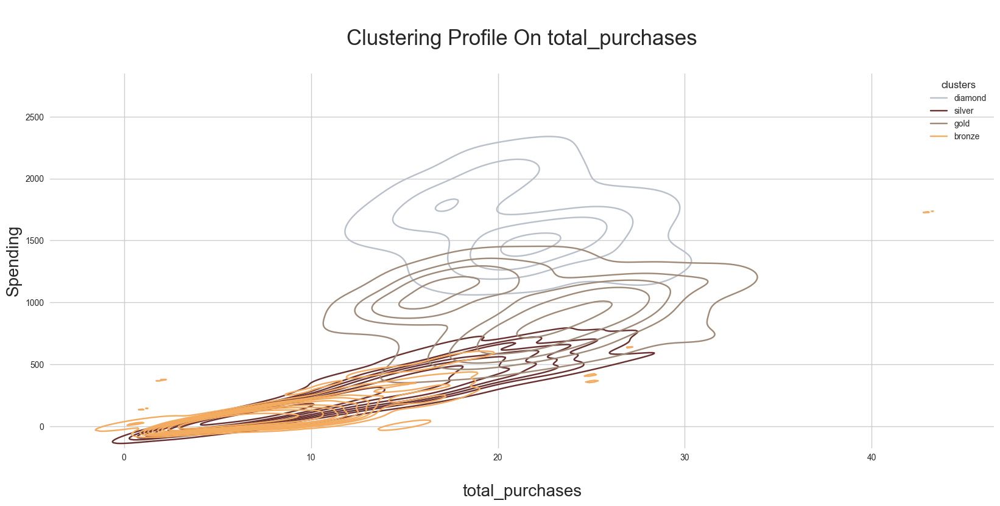

In [1730]:
cluster(eval_df,'total_purchases')

In [1731]:
diamond_df.total_spend.value_counts()

total_spend
1574    5
1366    4
1315    3
1631    3
1443    3
       ..
1829    1
1187    1
1318    1
1778    1
1623    1
Name: count, Length: 288, dtype: int64

In [1732]:
diamond_df.spend_class.value_counts()

spend_class
Very High    368
Low            0
Medium         0
High           0
Name: count, dtype: int64

In [1733]:
diamond_df.kidhome.value_counts()

kidhome
0    203
1    151
2     15
Name: count, dtype: int64

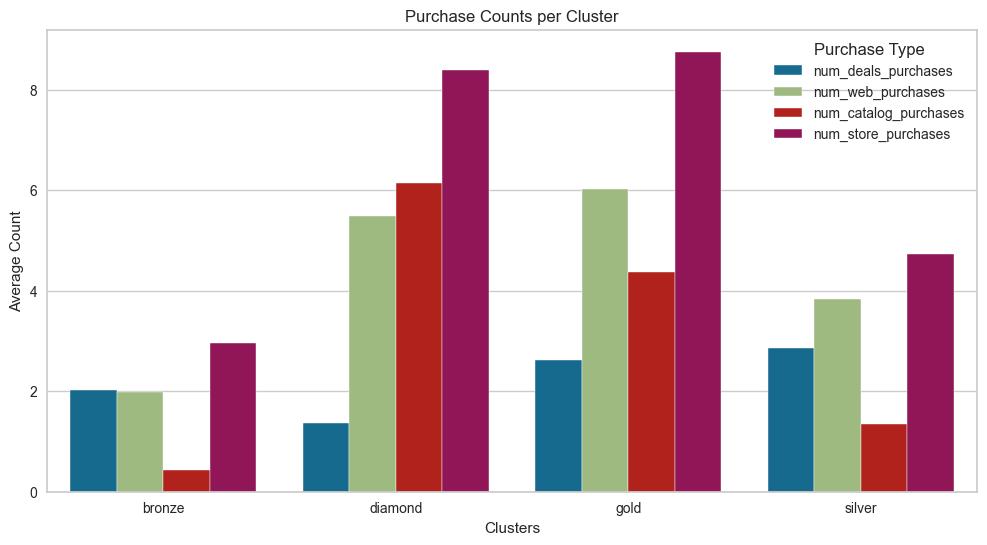

In [1734]:
# Aggregating mean values per cluster
aggregated_data = eval_df.groupby('clusters').agg({
    'num_deals_purchases': 'mean',
    'num_web_purchases': 'mean',
    'num_catalog_purchases': 'mean',
    'num_store_purchases': 'mean'
}).reset_index()

# Melting the aggregated data to long format
melted_data = pd.melt(aggregated_data, id_vars='clusters', value_vars=['num_deals_purchases', 'num_web_purchases', 'num_catalog_purchases', 'num_store_purchases'],
                      var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='clusters', y='Value', hue='Metric', data=melted_data)
plt.title('Purchase Counts per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Average Count')
plt.legend(title='Purchase Type', loc='upper right')
plt.show()

In [1735]:
diamond_df.education.value_counts()

education
Post Graduate    369
Name: count, dtype: int64

In [1736]:
diamond_df.education.value_counts(normalize=True)

education
Post Graduate   1
Name: proportion, dtype: float64

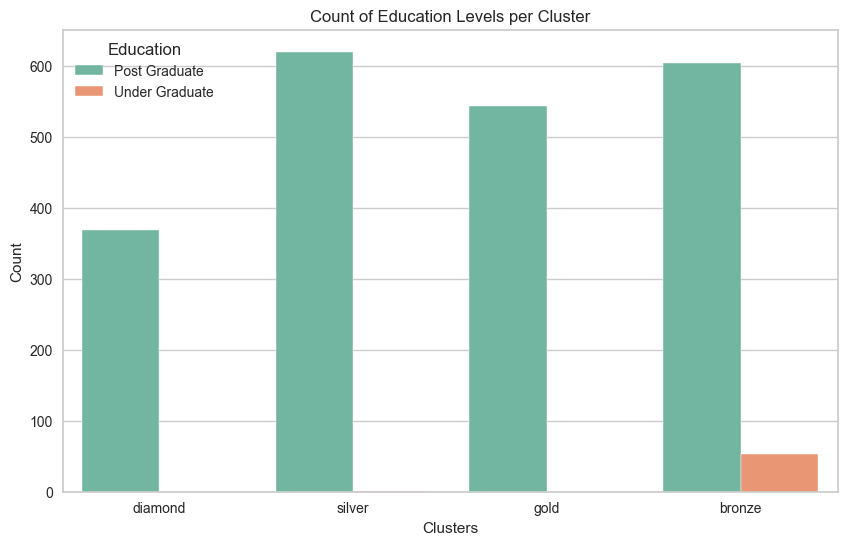

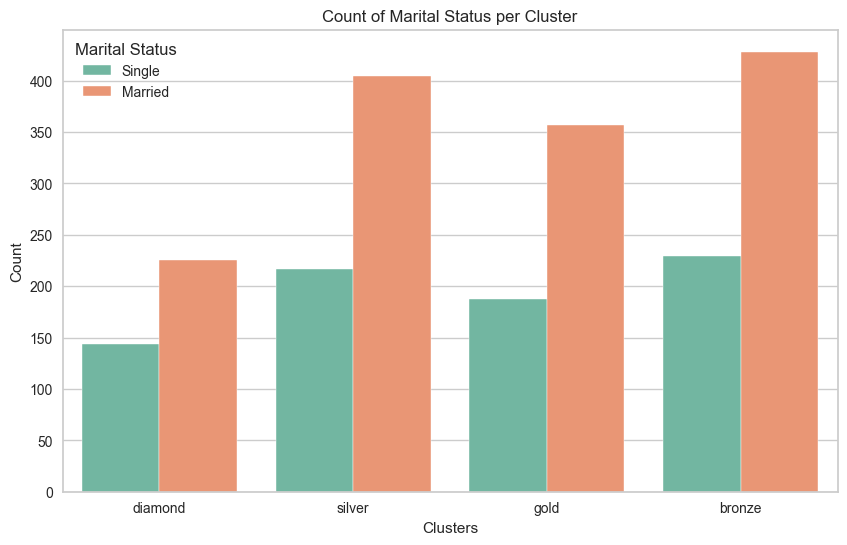

In [1737]:
# Plotting countplot for education
plt.figure(figsize=(10, 6))
sns.countplot(x='clusters', hue='education', data=eval_df, palette='Set2')
plt.title('Count of Education Levels per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.legend(title='Education')
plt.show()

# Plotting countplot for marital_status
plt.figure(figsize=(10, 6))
sns.countplot(x='clusters', hue='marital_status', data=eval_df, palette='Set2')
plt.title('Count of Marital Status per Cluster')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.legend(title='Marital Status')
plt.show()

In [1738]:
diamond_df_camp = diamond_df[['camp1','camp2','camp3','camp4','camp5']]

In [1739]:
diamond_df_camp

,camp1,camp2,camp3,camp4,camp5
0,0,0,0,0,0
14,0,0,0,0,0
17,0,0,0,0,0
28,0,0,0,0,0
39,0,0,1,0,0
...,...,...,...,...,...
2150,0,0,0,0,0
2166,0,0,0,0,0
2168,1,0,1,0,1
2172,0,0,0,0,0


In [1740]:
# Melt the DataFrame to have a long format for easier plotting
df_melted = diamond_df_camp.melt(var_name='Campaign', value_name='Accepted')

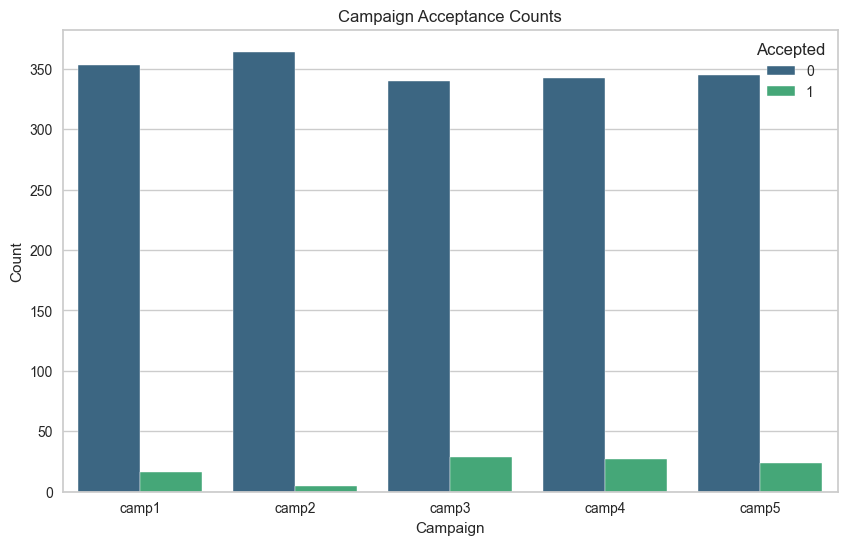

In [1741]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Draw the bar plot
sns.countplot(data=df_melted, x='Campaign', hue='Accepted', palette='viridis')

# Set the title and labels
plt.title('Campaign Acceptance Counts')
plt.xlabel('Campaign')
plt.ylabel('Count')

# Show the plot
plt.show()


## Evaluation

<div style="background-color: #f0f0f0; padding: 10px; margin-top: 10px;">
 <strong>Key Points:</strong><br>
 - diamond class: 17% of customers. lowest rate<br>
 - Highest spend<br>
 - 52 percent of them have high income level and the rest have very high income level<br>
 - Majority have high income<br>
 - has a high average age<br>
 - Highest purchases in meat gold and wine. They bought wine and then meat for his own expenses.<br>
 - They shopped mostly from stores The class that orders the most catalogs<br>
 - all of them are post graduates and have the lowest marriage rate.<br>
 - Campaigns 1, 3, 4 and 5 were accepted at almost equal rates.<br>

</div>

#### We have made our inferences on the Kmeans algorithm so far, and we will take and compare the results with another clustering algorithm, Hierarchical Clustering:


### The point we need to pay attention to is the number of clusters in kmeans so that we can find the differences.

## Hierarchical Clustering

### Determine optimal number of clusters using Dendogram

In [1742]:
numeric_df

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases,predicted_clusters
0,58138,0,0,58,635,88,546,172,88,88,...,4,7,57,663,0,1,1617,0,25,0
1,46344,1,1,38,11,1,6,2,1,6,...,2,5,60,113,2,3,27,0,6,3
2,71613,0,0,26,426,49,127,111,21,42,...,10,4,49,312,0,2,776,0,21,0
3,26646,1,0,26,11,4,20,10,3,5,...,4,6,30,139,1,3,53,0,8,1
4,58293,1,0,94,173,43,118,46,27,15,...,6,5,33,161,1,3,422,0,19,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,61223,0,1,46,709,43,182,42,118,247,...,4,5,47,381,1,3,1341,0,18,2
2190,64014,2,1,56,406,0,30,0,0,8,...,5,7,68,19,3,5,444,1,22,3
2191,56981,0,0,91,908,48,217,32,12,24,...,13,6,33,155,0,1,1241,1,19,0
2192,69245,0,1,8,428,30,214,80,30,61,...,10,3,58,156,1,3,843,0,23,2


In [1743]:
numeric_df1 = numeric_df.iloc[:,:-1]

In [1744]:
numeric_df1

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,58138,0,0,58,635,88,546,172,88,88,...,10,4,7,57,663,0,1,1617,0,25
1,46344,1,1,38,11,1,6,2,1,6,...,1,2,5,60,113,2,3,27,0,6
2,71613,0,0,26,426,49,127,111,21,42,...,2,10,4,49,312,0,2,776,0,21
3,26646,1,0,26,11,4,20,10,3,5,...,0,4,6,30,139,1,3,53,0,8
4,58293,1,0,94,173,43,118,46,27,15,...,3,6,5,33,161,1,3,422,0,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,61223,0,1,46,709,43,182,42,118,247,...,3,4,5,47,381,1,3,1341,0,18
2190,64014,2,1,56,406,0,30,0,0,8,...,2,5,7,68,19,3,5,444,1,22
2191,56981,0,0,91,908,48,217,32,12,24,...,3,13,6,33,155,0,1,1241,1,19
2192,69245,0,1,8,428,30,214,80,30,61,...,5,10,3,58,156,1,3,843,0,23


In [1745]:
hopkins(numeric_df1, 1)

0.8624319104722409

In [1746]:
numeric_df2 = numeric_df1.copy()
numeric_df3 = numeric_df1.copy()

In [1747]:
result=[]
for _ in range(10):
    result.append(hopkins(numeric_df2, 1))
np.mean(result)

0.8626178465094074

In [1748]:
result = []
for _ in range(10):
    result.append(hopkins(MinMaxScaler().fit_transform(numeric_df3), 1))
np.mean(result)

0.8225627742590511

In [1749]:
scaler = MinMaxScaler()

In [1750]:
df_scaled = scaler.fit_transform(numeric_df1)

In [1751]:
df_scaled

array([[0.50362487, 0.        , 0.        , ..., 0.63993648, 0.        ,
        0.58139535],
       [0.39832506, 0.5       , 0.5       , ..., 0.00873362, 0.        ,
        0.13953488],
       [0.62393307, 0.        , 0.        , ..., 0.30607384, 0.        ,
        0.48837209],
       ...,
       [0.49329488, 0.        , 0.        , ..., 0.4906709 , 0.25      ,
        0.44186047],
       [0.60279097, 0.        , 0.5       , ..., 0.3326717 , 0.        ,
        0.53488372],
       [0.45658191, 0.5       , 0.5       , ..., 0.06629615, 0.        ,
        0.25581395]])

In [1752]:
X = pd.DataFrame(df_scaled, columns=numeric_df1.columns)
X.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,0.50,0,0,0.59,0.43,0.44,0.32,0.66,0.33,0.24,...,0.36,0.31,0.35,0.70,0.95,0,0,0.64,0,0.58
1,0.40,0.50,0.50,0.38,0.01,0.01,0.00,0.01,0.00,0.02,...,0.04,0.15,0.25,0.75,0.16,0.67,0.50,0.01,0,0.14
2,0.62,0,0,0.26,0.29,0.25,0.07,0.43,0.08,0.12,...,0.07,0.77,0.20,0.55,0.45,0,0.25,0.31,0,0.49
3,0.22,0.50,0,0.26,0.01,0.02,0.01,0.04,0.01,0.01,...,0,0.31,0.30,0.21,0.20,0.33,0.50,0.02,0,0.19
4,0.51,0.50,0,0.95,0.12,0.22,0.07,0.18,0.10,0.04,...,0.11,0.46,0.25,0.27,0.23,0.33,0.50,0.17,0,0.44


In [1753]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [1754]:
hc_ward = linkage(y=X, method="ward")
hc_complete = linkage(X, "complete")
hc_average = linkage(X, "average")
hc_single = linkage(X, "single")

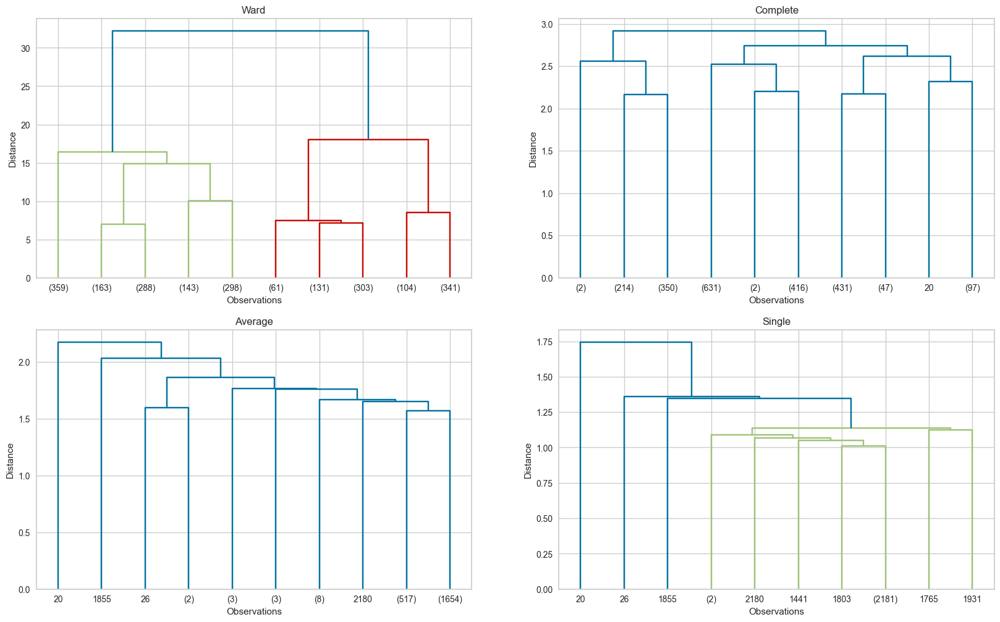

In [1755]:
plt.figure(figsize=(20,12))

plt.subplot(221)
plt.title("Ward")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_ward, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(222)
plt.title("Complete")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_complete, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(223)
plt.title("Average")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_average, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(224)
plt.title("Single")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_single, leaf_font_size=10, truncate_mode='lastp', p=10);

In [1756]:
from sklearn.cluster import AgglomerativeClustering

### silhouette_score

In [1757]:
from sklearn.metrics import silhouette_score

In [1758]:
K = range(2,10)

for k in K:
    model = AgglomerativeClustering(n_clusters=k)
    model.fit_predict(X)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(X, model.labels_)}')

Silhouette Score for 2 clusters: 0.24021924899694064
Silhouette Score for 3 clusters: 0.2007138283887065
Silhouette Score for 4 clusters: 0.15645520599229432
Silhouette Score for 5 clusters: 0.17173299738910586
Silhouette Score for 6 clusters: 0.17428346825443225
Silhouette Score for 7 clusters: 0.1774025114665676
Silhouette Score for 8 clusters: 0.17299488461453982
Silhouette Score for 9 clusters: 0.16764981988740607


In [1759]:
model = AgglomerativeClustering(n_clusters=2,
                                metric="euclidean",
                                linkage="ward")
clusters = model.fit_predict(X)

In [1760]:
X["clusters"] = clusters
X.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases,clusters
0,0.50,0,0,0.59,0.43,0.44,0.32,0.66,0.33,0.24,...,0.31,0.35,0.70,0.95,0,0,0.64,0,0.58,0
1,0.40,0.50,0.50,0.38,0.01,0.01,0.00,0.01,0.00,0.02,...,0.15,0.25,0.75,0.16,0.67,0.50,0.01,0,0.14,1
2,0.62,0,0,0.26,0.29,0.25,0.07,0.43,0.08,0.12,...,0.77,0.20,0.55,0.45,0,0.25,0.31,0,0.49,0
3,0.22,0.50,0,0.26,0.01,0.02,0.01,0.04,0.01,0.01,...,0.31,0.30,0.21,0.20,0.33,0.50,0.02,0,0.19,1
4,0.51,0.50,0,0.95,0.12,0.22,0.07,0.18,0.10,0.04,...,0.46,0.25,0.27,0.23,0.33,0.50,0.17,0,0.44,1


pca

In [1761]:
pca = PCA(n_components=3)

In [1762]:
principal_components = pca.fit_transform(X)

In [1763]:
component_df = pd.DataFrame(data=principal_components,
                           columns=["first_component", "second_component", "third_component"])
component_df


,first_component,second_component,third_component
0,-1.05,-0.27,0.44
1,0.81,0.23,-0.39
2,-0.79,-0.22,-0.19
3,0.71,-0.34,-0.22
4,0.37,-0.16,0.11
...,...,...,...
2186,-0.67,0.34,-0.02
2187,0.77,0.88,-0.35
2188,-0.91,-0.32,0.01
2189,-0.64,0.37,-0.57


In [1764]:
component_df['clusters'] = X['clusters']

In [1765]:
component_df

,first_component,second_component,third_component,clusters
0,-1.05,-0.27,0.44,0
1,0.81,0.23,-0.39,1
2,-0.79,-0.22,-0.19,0
3,0.71,-0.34,-0.22,1
4,0.37,-0.16,0.11,1
...,...,...,...,...
2186,-0.67,0.34,-0.02,0
2187,0.77,0.88,-0.35,1
2188,-0.91,-0.32,0.01,0
2189,-0.64,0.37,-0.57,0


<Figure size 2000x1000 with 0 Axes>

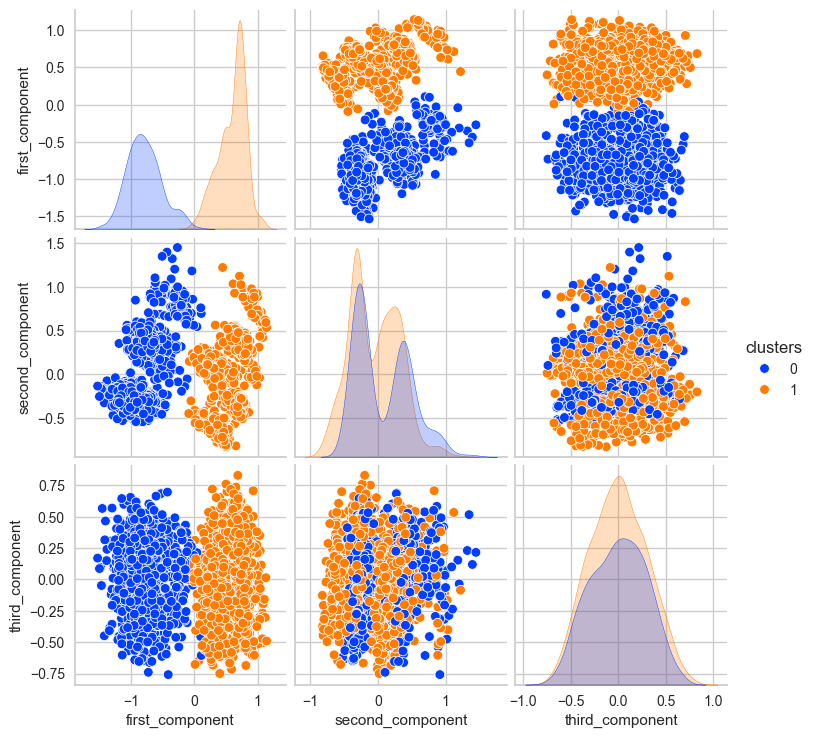

In [1766]:
plt.figure(figsize = (20,10))
sns.pairplot(data=component_df, hue="clusters", palette="bright");

In [1767]:
X = pd.DataFrame(df_scaled, columns=numeric_df1.columns)
X.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,0.50,0,0,0.59,0.43,0.44,0.32,0.66,0.33,0.24,...,0.36,0.31,0.35,0.70,0.95,0,0,0.64,0,0.58
1,0.40,0.50,0.50,0.38,0.01,0.01,0.00,0.01,0.00,0.02,...,0.04,0.15,0.25,0.75,0.16,0.67,0.50,0.01,0,0.14
2,0.62,0,0,0.26,0.29,0.25,0.07,0.43,0.08,0.12,...,0.07,0.77,0.20,0.55,0.45,0,0.25,0.31,0,0.49
3,0.22,0.50,0,0.26,0.01,0.02,0.01,0.04,0.01,0.01,...,0,0.31,0.30,0.21,0.20,0.33,0.50,0.02,0,0.19
4,0.51,0.50,0,0.95,0.12,0.22,0.07,0.18,0.10,0.04,...,0.11,0.46,0.25,0.27,0.23,0.33,0.50,0.17,0,0.44


In [1768]:
model = AgglomerativeClustering(n_clusters=4,
                                metric="euclidean",
                                linkage="ward")
clusters = model.fit_predict(X)


In [1769]:
X["clusters"] = clusters
X.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases,clusters
0,0.50,0,0,0.59,0.43,0.44,0.32,0.66,0.33,0.24,...,0.31,0.35,0.70,0.95,0,0,0.64,0,0.58,2
1,0.40,0.50,0.50,0.38,0.01,0.01,0.00,0.01,0.00,0.02,...,0.15,0.25,0.75,0.16,0.67,0.50,0.01,0,0.14,3
2,0.62,0,0,0.26,0.29,0.25,0.07,0.43,0.08,0.12,...,0.77,0.20,0.55,0.45,0,0.25,0.31,0,0.49,2
3,0.22,0.50,0,0.26,0.01,0.02,0.01,0.04,0.01,0.01,...,0.31,0.30,0.21,0.20,0.33,0.50,0.02,0,0.19,0
4,0.51,0.50,0,0.95,0.12,0.22,0.07,0.18,0.10,0.04,...,0.46,0.25,0.27,0.23,0.33,0.50,0.17,0,0.44,0


In [1770]:
pca = PCA(n_components=3)

In [1771]:
principal_components = pca.fit_transform(X)

In [1772]:
component_df = pd.DataFrame(data=principal_components,
                           columns=["first_component", "second_component", "third_component"])
component_df


,first_component,second_component,third_component
0,0.88,0.86,-0.18
1,1.82,-0.84,-0.14
2,0.85,0.53,-0.25
3,-1.21,-0.45,-0.34
4,-1.13,-0.06,-0.09
...,...,...,...
2186,-0.08,0.37,0.37
2187,1.94,-0.91,0.40
2188,0.85,0.68,-0.33
2189,-0.07,0.32,0.36


In [1773]:
component_df['clusters'] = X['clusters']

In [1774]:
component_df

,first_component,second_component,third_component,clusters
0,0.88,0.86,-0.18,2
1,1.82,-0.84,-0.14,3
2,0.85,0.53,-0.25,2
3,-1.21,-0.45,-0.34,0
4,-1.13,-0.06,-0.09,0
...,...,...,...,...
2186,-0.08,0.37,0.37,1
2187,1.94,-0.91,0.40,3
2188,0.85,0.68,-0.33,2
2189,-0.07,0.32,0.36,1


<Figure size 2000x1000 with 0 Axes>

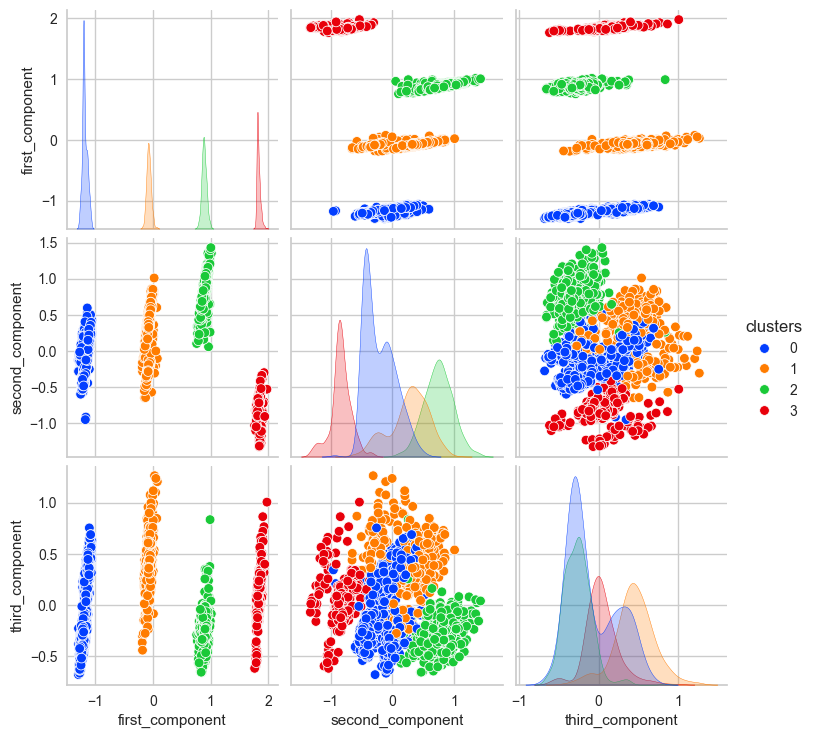

In [1775]:
plt.figure(figsize = (20,10))
sns.pairplot(data=component_df, hue="clusters", palette="bright");

In [1776]:
clus_pred = component_df.groupby("clusters").mean().T
clus_pred

clusters,0,1,2,3
first_component,-1.19,-0.08,0.88,1.83
second_component,-0.21,0.27,0.75,-0.84
third_component,-0.09,0.44,-0.27,0.03


<Axes: >

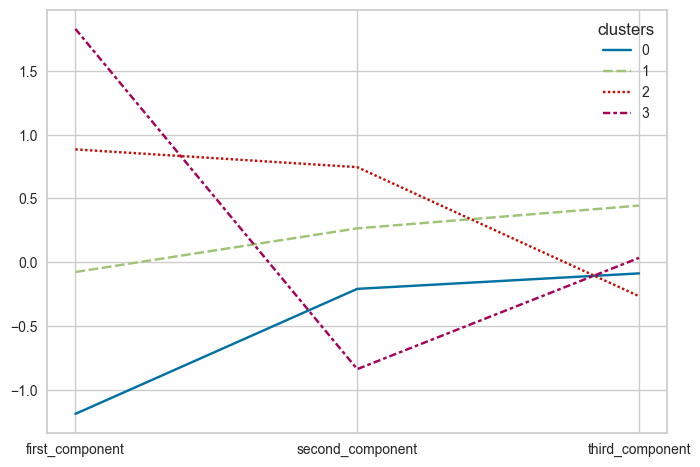

In [1777]:
sns.lineplot(data=clus_pred)

In [1778]:
X

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases,clusters
0,0.50,0,0,0.59,0.43,0.44,0.32,0.66,0.33,0.24,...,0.31,0.35,0.70,0.95,0,0,0.64,0,0.58,2
1,0.40,0.50,0.50,0.38,0.01,0.01,0.00,0.01,0.00,0.02,...,0.15,0.25,0.75,0.16,0.67,0.50,0.01,0,0.14,3
2,0.62,0,0,0.26,0.29,0.25,0.07,0.43,0.08,0.12,...,0.77,0.20,0.55,0.45,0,0.25,0.31,0,0.49,2
3,0.22,0.50,0,0.26,0.01,0.02,0.01,0.04,0.01,0.01,...,0.31,0.30,0.21,0.20,0.33,0.50,0.02,0,0.19,0
4,0.51,0.50,0,0.95,0.12,0.22,0.07,0.18,0.10,0.04,...,0.46,0.25,0.27,0.23,0.33,0.50,0.17,0,0.44,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2186,0.53,0,0.50,0.46,0.47,0.22,0.11,0.16,0.45,0.68,...,0.31,0.25,0.52,0.55,0.33,0.50,0.53,0,0.42,1
2187,0.56,1,0.50,0.57,0.27,0,0.02,0,0,0.02,...,0.38,0.35,0.89,0.03,1,1,0.17,0.25,0.51,3
2188,0.49,0,0,0.92,0.61,0.24,0.13,0.12,0.05,0.07,...,1,0.30,0.27,0.22,0,0,0.49,0.25,0.44,2
2189,0.60,0,0.50,0.08,0.29,0.15,0.12,0.31,0.11,0.17,...,0.77,0.15,0.71,0.22,0.33,0.50,0.33,0,0.53,1


In [1779]:
X.clusters.value_counts()

clusters
0    892
2    495
1    445
3    359
Name: count, dtype: int64

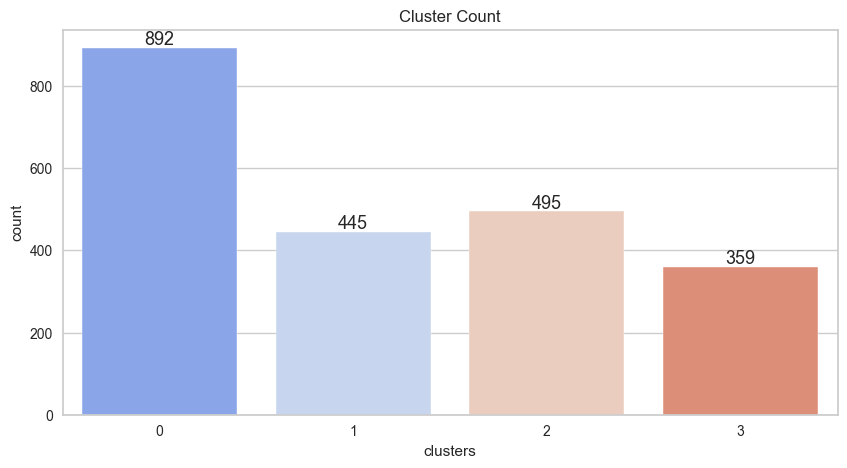

In [1780]:
plt.figure(figsize=(10, 5))
plt.title("Cluster Count")
ax = sns.countplot(x=X.clusters, palette="coolwarm")
# ax.bar_label(ax.containers[0])
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.0f'),
                (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                size=13, xytext=(0, 6),
                textcoords='offset points')
plt.show()

In [1781]:
X

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases,clusters
0,0.50,0,0,0.59,0.43,0.44,0.32,0.66,0.33,0.24,...,0.31,0.35,0.70,0.95,0,0,0.64,0,0.58,2
1,0.40,0.50,0.50,0.38,0.01,0.01,0.00,0.01,0.00,0.02,...,0.15,0.25,0.75,0.16,0.67,0.50,0.01,0,0.14,3
2,0.62,0,0,0.26,0.29,0.25,0.07,0.43,0.08,0.12,...,0.77,0.20,0.55,0.45,0,0.25,0.31,0,0.49,2
3,0.22,0.50,0,0.26,0.01,0.02,0.01,0.04,0.01,0.01,...,0.31,0.30,0.21,0.20,0.33,0.50,0.02,0,0.19,0
4,0.51,0.50,0,0.95,0.12,0.22,0.07,0.18,0.10,0.04,...,0.46,0.25,0.27,0.23,0.33,0.50,0.17,0,0.44,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2186,0.53,0,0.50,0.46,0.47,0.22,0.11,0.16,0.45,0.68,...,0.31,0.25,0.52,0.55,0.33,0.50,0.53,0,0.42,1
2187,0.56,1,0.50,0.57,0.27,0,0.02,0,0,0.02,...,0.38,0.35,0.89,0.03,1,1,0.17,0.25,0.51,3
2188,0.49,0,0,0.92,0.61,0.24,0.13,0.12,0.05,0.07,...,1,0.30,0.27,0.22,0,0,0.49,0.25,0.44,2
2189,0.60,0,0.50,0.08,0.29,0.15,0.12,0.31,0.11,0.17,...,0.77,0.15,0.71,0.22,0.33,0.50,0.33,0,0.53,1


In [1782]:
numeric_df1

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_catalog_purchases,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases
0,58138,0,0,58,635,88,546,172,88,88,...,10,4,7,57,663,0,1,1617,0,25
1,46344,1,1,38,11,1,6,2,1,6,...,1,2,5,60,113,2,3,27,0,6
2,71613,0,0,26,426,49,127,111,21,42,...,2,10,4,49,312,0,2,776,0,21
3,26646,1,0,26,11,4,20,10,3,5,...,0,4,6,30,139,1,3,53,0,8
4,58293,1,0,94,173,43,118,46,27,15,...,3,6,5,33,161,1,3,422,0,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,61223,0,1,46,709,43,182,42,118,247,...,3,4,5,47,381,1,3,1341,0,18
2190,64014,2,1,56,406,0,30,0,0,8,...,2,5,7,68,19,3,5,444,1,22
2191,56981,0,0,91,908,48,217,32,12,24,...,3,13,6,33,155,0,1,1241,1,19
2192,69245,0,1,8,428,30,214,80,30,61,...,5,10,3,58,156,1,3,843,0,23


In [1783]:
HC = numeric_df1.copy()

In [1784]:
HC['clusters'] = clusters

In [1785]:
HC

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,...,num_store_purchases,num_web_visits_month,age,dt_days,kids,family_size,total_spend,accepted_camps,total_purchases,clusters
0,58138,0,0,58,635,88,546,172,88,88,...,4,7,57,663,0,1,1617,0,25,2
1,46344,1,1,38,11,1,6,2,1,6,...,2,5,60,113,2,3,27,0,6,3
2,71613,0,0,26,426,49,127,111,21,42,...,10,4,49,312,0,2,776,0,21,2
3,26646,1,0,26,11,4,20,10,3,5,...,4,6,30,139,1,3,53,0,8,0
4,58293,1,0,94,173,43,118,46,27,15,...,6,5,33,161,1,3,422,0,19,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,61223,0,1,46,709,43,182,42,118,247,...,4,5,47,381,1,3,1341,0,18,1
2190,64014,2,1,56,406,0,30,0,0,8,...,5,7,68,19,3,5,444,1,22,3
2191,56981,0,0,91,908,48,217,32,12,24,...,13,6,33,155,0,1,1241,1,19,2
2192,69245,0,1,8,428,30,214,80,30,61,...,10,3,58,156,1,3,843,0,23,1


<Axes: xlabel='total_spend', ylabel='income'>

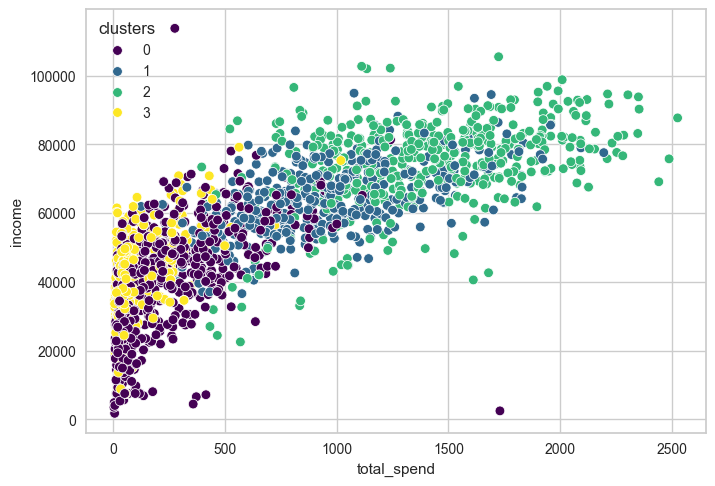

In [1786]:
sns.scatterplot(HC, x = 'total_spend', y= 'income', hue = 'clusters', palette = 'viridis')

In [1787]:
clusters_mapping = {0: 'bronze',
                   1 : 'gold',
                   2 : 'diamond',
                   3 : 'silver'}

In [1788]:
HC.clusters = HC.clusters.map(clusters_mapping)

In [1789]:

cluster_names = ['diamond', 'silver', 'gold', 'bronze']

cluster_means = []

# Her küme için ortalama 'income' ve 'spent' değerlerini hesapla
for cluster in cluster_names:
    cluster_data = HC[HC['clusters'] == cluster][['income', 'total_spend']].mean()
    cluster_means.append({
        'clusters': cluster,
        'income_mean': cluster_data['income'],
        'spent_mean': cluster_data['total_spend']
    })

cluster_means_df = pd.DataFrame(cluster_means)

cluster_means_df.sort_values(by = 'income_mean')

,clusters,income_mean,spent_mean
3,bronze,"36,802.62",196.73
1,silver,"41,361.36",119.95
2,gold,"63,719.63",943.71
0,diamond,"74,830.22","1,387.28"


In [1790]:
cluster_means = HC.groupby('clusters')['income'].mean()
cluster_means

clusters
bronze    36,802.62
diamond   74,830.22
gold      63,719.63
silver    41,361.36
Name: income, dtype: float64

In [1791]:
def classify_income(row):
    return cluster_means[row['clusters']]

In [1792]:
HC['income_class'] = HC.apply(classify_income, axis=1)

print(HC)

      income  kidhome  teenhome  recency  mnt_wines  mnt_fruits  \
0      58138        0         0       58        635          88   
1      46344        1         1       38         11           1   
2      71613        0         0       26        426          49   
3      26646        1         0       26         11           4   
4      58293        1         0       94        173          43   
...      ...      ...       ...      ...        ...         ...   
2189   61223        0         1       46        709          43   
2190   64014        2         1       56        406           0   
2191   56981        0         0       91        908          48   
2192   69245        0         1        8        428          30   
2193   52869        1         1       40         84           3   

      mnt_meat_products  mnt_fish_products  mnt_sweet_products  \
0                   546                172                  88   
1                     6                  2                   1 

In [1793]:
HC['income_class'] = pd.cut(HC['income_class'], bins=4, labels=['high_income', 'medium_high_income', 'medium_low_income', 'low_income'])

In [1794]:
pd.crosstab(HC.income_class, HC.clusters) 

clusters,bronze,diamond,gold,silver
income_class,,,,
high_income,892,0,0,359
medium_low_income,0,0,445,0
low_income,0,495,0,0


### Clustering based on selected features

In [1795]:
HC1 = HC[['income', 'total_spend']]

In [1796]:
scaler = StandardScaler()
scaled_X = scaler.fit_transform(HC1)
scaled_X

array([[ 0.3162741 ,  1.68842529],
       [-0.25494592, -0.96392148],
       [ 0.96891015,  0.28551734],
       ...,
       [ 0.260237  ,  1.06120366],
       [ 0.85422057,  0.3972829 ],
       [ 0.06108008, -0.7220408 ]])

In [1797]:
X_2 = pd.DataFrame(scaled_X, columns = HC1.columns )
X_2.shape

(2191, 2)

In [1798]:
hopkins(X_2)

0.9197491482198971

In [1799]:
hopkins(X_2, 1)

0.9286884768163957

In [1800]:
hc_ward1 = linkage(X_2, method = 'ward')
hc_ward1

array([[5.06000000e+02, 1.06900000e+03, 0.00000000e+00, 2.00000000e+00],
       [2.32000000e+02, 1.27100000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.36900000e+03, 1.40400000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [4.37200000e+03, 4.37400000e+03, 2.16218989e+01, 1.11000000e+03],
       [4.37600000e+03, 4.37700000e+03, 3.45872747e+01, 1.08100000e+03],
       [4.37800000e+03, 4.37900000e+03, 7.61482905e+01, 2.19100000e+03]])

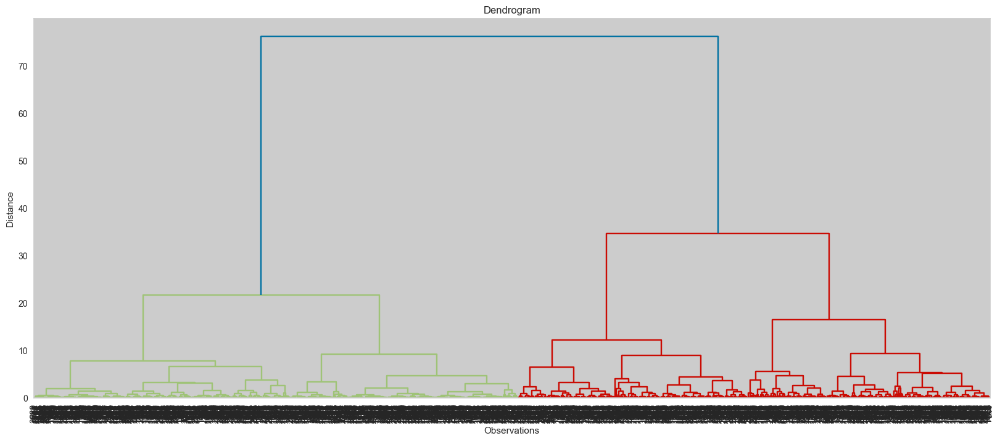

In [1801]:
plt.figure(figsize = (20,8))
plt.title("Dendrogram")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_ward1, leaf_font_size = 10);

In [1802]:
from sklearn.cluster import AgglomerativeClustering

In [1803]:
model = AgglomerativeClustering(n_clusters=4,
                                metric="euclidean",
                                linkage="ward")

In [1804]:
model.fit_predict(X_2)

array([0, 3, 2, ..., 2, 2, 3], dtype=int64)

In [1805]:
model.labels_

array([0, 3, 2, ..., 2, 2, 3], dtype=int64)

In [1806]:
K = range(2,10)

for k in K:
    model = AgglomerativeClustering(n_clusters = k)
    model.fit(X)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(X, model.labels_)}')

Silhouette Score for 2 clusters: 0.3921598388627079
Silhouette Score for 3 clusters: 0.4312738256733646
Silhouette Score for 4 clusters: 0.4141848729186048
Silhouette Score for 5 clusters: 0.3398597060927448
Silhouette Score for 6 clusters: 0.34409992834481523
Silhouette Score for 7 clusters: 0.3212528900862833
Silhouette Score for 8 clusters: 0.2847126556806135
Silhouette Score for 9 clusters: 0.27163527772888507


In [1807]:
model = AgglomerativeClustering(n_clusters=4,
                                metric="euclidean",
                                linkage="ward")
clusters = model.fit_predict(X_2)

In [1808]:
X_2['clusters'] = clusters

In [1809]:
X_2.head().T

,0,1,2,3,4
income,0.32,-0.25,0.97,-1.21,0.32
total_spend,1.69,-0.96,0.29,-0.92,-0.31
clusters,0,3,2,1,2


## Conclusion

## Evaluation

<div style="background-color: #f0f0f0; padding: 10px; margin-top: 10px;">
 <strong>Labeling for Customer Segments:</strong><br>
 - <strong>Cluster 0 - Diamond :</strong> High and very high income and high spending behavior <strong>High Activity Customers</strong><br>
 - <strong>Cluster 1 - Bronze :</strong> low income and low spending behavior <strong> Low Activity Customers</strong><br>
 - <strong>Cluster 2 - Gold :</strong>:high income and high spending behavior <strong> Medium High Activity Customers</strong><br>
 - <strong>Cluster 3 - Silver :</strong> middle income and middle spending behavior <strong> Medium Low Activity Customers</strong><br>

</div>

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___